In [1]:
# Load libraries

# # Plotting utils 
import matplotlib.pyplot as plt 
import matplotlib.colors as colors
import matplotlib.ticker as ticker 
import matplotlib.patches as patches
import matplotlib as matplotlib
import matplotlib.dates as mdates
from mpl_toolkits.axes_grid1 import make_axes_locatable

import seaborn as sns

# Analysis
import time
import numpy as np 
import xarray as xr
import datetime
from   datetime import date, timedelta
import pandas as pd 
import pickle
import scipy.stats as stats

import metpy.calc as mpc
from metpy.units import units
from metpy.plots import Hodograph, SkewT

import warnings
warnings.filterwarnings('ignore')



In [2]:
'''
Find all the times in the full array (20m dt) that line up with the day classifications above. 
'''
def getTimes_basedOnDates(fullDS, matchDatesDS):
    iTimes = []
    
    for iTime in range(len(matchDatesDS.year_month_day.values)):
        iKeepTimes = np.where((fullDS['time.year'] ==matchDatesDS.year_month_day_level_0.values[iTime]) &
                              (fullDS['time.month']==matchDatesDS.year_month_day_level_1.values[iTime]) & 
                              (fullDS['time.day']  ==matchDatesDS.year_month_day_level_2.values[iTime]))[0]    
        iTimes = np.append(iTimes, iKeepTimes).astype(int)
    
    # Now select only those times in the local time array
    DS_dayClass = fullDS.isel(time=iTimes)
    
    return(DS_dayClass)



## Read in data

In [3]:
# saveDir = '/glade/work/mdfowler/CLASP/histData/processedData/'

# # realSfcHMG = pickle.load( open( saveDir+"realSfc_HMG_rtpthlponly_relaxTlongTau_freeSfcT.p" , "rb") )
# # realSfcHTG = pickle.load( open( saveDir+"realSfc_HTG_rtpthlponly_relaxTlongTau_freeSfcT.p" , "rb") )

# # realSfcHMG_pert01 = pickle.load( open( saveDir+"realSfc_HMG_rtpthlponly_relaxTlongTau_freeSfcT_pert01.p" , "rb") )
# # realSfcHMG_pert02 = pickle.load( open( saveDir+"realSfc_HMG_rtpthlponly_relaxTlongTau_freeSfcT_pert02.p" , "rb") )
# # realSfcHMG_pert03 = pickle.load( open( saveDir+"realSfc_HMG_rtpthlponly_relaxTlongTau_freeSfcT_pert03.p" , "rb") )
# # realSfcHMG_pert04 = pickle.load( open( saveDir+"realSfc_HMG_rtpthlponly_relaxTlongTau_freeSfcT_pert04.p" , "rb") )
# realSfcHMG_pert05 = pickle.load( open( saveDir+"realSfc_HMG_rtpthlponly_relaxTlongTau_freeSfcT_pert05.p" , "rb") )
# realSfcHMG_pert06 = pickle.load( open( saveDir+"realSfc_HMG_rtpthlponly_relaxTlongTau_freeSfcT_pert06.p" , "rb") )
# realSfcHMG_pert07 = pickle.load( open( saveDir+"realSfc_HMG_rtpthlponly_relaxTlongTau_freeSfcT_pert07.p" , "rb") )

# # realSfcHTG_pert01 = pickle.load( open( saveDir+"realSfc_HTG_rtpthlponly_relaxTlongTau_freeSfcT_pert01.p" , "rb") )
# # realSfcHTG_pert02 = pickle.load( open( saveDir+"realSfc_HTG_rtpthlponly_relaxTlongTau_freeSfcT_pert02.p" , "rb") )
# # realSfcHTG_pert03 = pickle.load( open( saveDir+"realSfc_HTG_rtpthlponly_relaxTlongTau_freeSfcT_pert03.p" , "rb") )
# # realSfcHTG_pert04 = pickle.load( open( saveDir+"realSfc_HTG_rtpthlponly_relaxTlongTau_freeSfcT_pert04.p" , "rb") )
# realSfcHTG_pert05 = pickle.load( open( saveDir+"realSfc_HTG_rtpthlponly_relaxTlongTau_freeSfcT_pert05.p" , "rb") )
# realSfcHTG_pert06 = pickle.load( open( saveDir+"realSfc_HTG_rtpthlponly_relaxTlongTau_freeSfcT_pert06.p" , "rb") )
# realSfcHTG_pert07 = pickle.load( open( saveDir+"realSfc_HTG_rtpthlponly_relaxTlongTau_freeSfcT_pert07.p" , "rb") )

# # print('Done reading in all the ensemble datasets')


In [4]:
# # ## Combine into one array
# # realSfcHMG        = realSfcHMG.assign_coords({"case": 'HMG'})
# # realSfcHMG_pert01 = realSfcHMG_pert01.assign_coords({"case": 'HMG_pert01'})
# # realSfcHMG_pert02 = realSfcHMG_pert02.assign_coords({"case": 'HMG_pert02'})
# # realSfcHMG_pert03 = realSfcHMG_pert03.assign_coords({"case": 'HMG_pert03'})
# # realSfcHMG_pert04 = realSfcHMG_pert04.assign_coords({"case": 'HMG_pert04'})

# realSfcHMG_pert05 = realSfcHMG_pert05.assign_coords({"case": 'HMG_pert05'})
# realSfcHMG_pert06 = realSfcHMG_pert06.assign_coords({"case": 'HMG_pert06'})
# realSfcHMG_pert07 = realSfcHMG_pert07.assign_coords({"case": 'HMG_pert07'})


# # realSfcHTG        = realSfcHTG.assign_coords({"case": 'HTG'})
# # realSfcHTG_pert01 = realSfcHTG_pert01.assign_coords({"case": 'HTG_pert01'})
# # realSfcHTG_pert02 = realSfcHTG_pert02.assign_coords({"case": 'HTG_pert02'})
# # realSfcHTG_pert03 = realSfcHTG_pert03.assign_coords({"case": 'HTG_pert03'})
# # realSfcHTG_pert04 = realSfcHTG_pert04.assign_coords({"case": 'HTG_pert04'})

# realSfcHTG_pert05 = realSfcHTG_pert05.assign_coords({"case": 'HTG_pert05'})
# realSfcHTG_pert06 = realSfcHTG_pert06.assign_coords({"case": 'HTG_pert06'})
# realSfcHTG_pert07 = realSfcHTG_pert07.assign_coords({"case": 'HTG_pert07'})

# # realSfc_allCases = xr.concat([realSfcHMG, 
# #                               realSfcHMG_pert01,
# #                               realSfcHMG_pert02,                              
# #                               realSfcHMG_pert03, 
# #                               realSfcHMG_pert04,
# #                               realSfcHTG,
# #                               realSfcHTG_pert01,
# #                               realSfcHTG_pert02,                              
# #                               realSfcHTG_pert03, 
# #                               realSfcHTG_pert04,                              
# #                                ], "case")

# realSfc_moreEns = xr.concat([realSfcHMG_pert05, 
#                              realSfcHMG_pert06,
#                              realSfcHMG_pert07,
#                              realSfcHTG_pert05, 
#                              realSfcHTG_pert06,
#                              realSfcHTG_pert07,                             
#                                ], "case")



# # print('Done combining cases') 

# # del realSfcHMG
# # del realSfcHMG_pert01
# # del realSfcHMG_pert02
# # del realSfcHMG_pert03
# # del realSfcHMG_pert04
# del realSfcHMG_pert05
# del realSfcHMG_pert06
# del realSfcHMG_pert07
# # del realSfcHTG
# # del realSfcHTG_pert01
# # del realSfcHTG_pert02
# # del realSfcHTG_pert03
# # del realSfcHTG_pert04
# del realSfcHTG_pert05
# del realSfcHTG_pert06
# del realSfcHTG_pert07




Done combining cases


In [5]:
# ## First day of each run 06/02 doesn't start until 6p. So drop 06/02 
# ## And last day of each run 8/28 only goes until about 6p, so let's drop 8/28 too. 

# iDropJune      = np.where( (realSfc_moreEns['time.month']==6) & (realSfc_moreEns['time.day']==2))[0]
# iDropAug       = np.where( (realSfc_moreEns['time.month']==8) & (realSfc_moreEns['time.day']==28))[0]
# allTimeIndices = np.arange(0,len(realSfc_moreEns.time.values))
# keepIndices    = np.delete(allTimeIndices, np.append(iDropJune, iDropAug))

# ## Now limit to those days:
# realSfc_moreEns        = realSfc_moreEns.isel(time=keepIndices)



In [6]:
# # ## Upsample
# # realSfc_allCases_upsample = realSfc_allCases.resample(time="30Min").mean()
# realSfc_moreEns_upsample = realSfc_moreEns.resample(time="30Min").mean()
# del realSfc_moreEns

In [14]:
# ## Save the upsampled DS 
# saveDir = '/glade/work/mdfowler/CLASP/histData/processedData/'
# pickle.dump( realSfc_allCases_upsample,   open( saveDir+"realSfc_allCases_30minMeans.p", "wb" ) )
# print('Saved upsampled file to pickle')

# saveDir = '/glade/work/mdfowler/CLASP/histData/processedData/'
# pickle.dump( realSfc_moreEns_upsample,   open( saveDir+"realSfc_ens5to7_30minMeans.p", "wb" ) )
# print('Saved upsampled file to pickle')


Saved upsampled file to pickle


## Handle land files too 

In [5]:
# saveDir = '/glade/work/mdfowler/CLASP/histData/processedData/'

# realSfcHMGclm = pickle.load( open( saveDir+"realSfc_HMGclm_rtpthlponly_relaxTlongTau_freeSfcT.p" , "rb") )
# realSfcHTGclm = pickle.load( open( saveDir+"realSfc_HTGclm_rtpthlponly_relaxTlongTau_freeSfcT.p" , "rb") )

# realSfcHMGclm_pert01 = pickle.load( open( saveDir+"realSfc_HMGclm_rtpthlponly_relaxTlongTau_freeSfcT_pert01.p" , "rb") )
# realSfcHMGclm_pert02 = pickle.load( open( saveDir+"realSfc_HMGclm_rtpthlponly_relaxTlongTau_freeSfcT_pert02.p" , "rb") )
# realSfcHMGclm_pert03 = pickle.load( open( saveDir+"realSfc_HMGclm_rtpthlponly_relaxTlongTau_freeSfcT_pert03.p" , "rb") )
# realSfcHMGclm_pert04 = pickle.load( open( saveDir+"realSfc_HMGclm_rtpthlponly_relaxTlongTau_freeSfcT_pert04.p" , "rb") )
# realSfcHMGclm_pert05 = pickle.load( open( saveDir+"realSfc_HMGclm_rtpthlponly_relaxTlongTau_freeSfcT_pert05.p" , "rb") )
# realSfcHMGclm_pert06 = pickle.load( open( saveDir+"realSfc_HMGclm_rtpthlponly_relaxTlongTau_freeSfcT_pert06.p" , "rb") )
# realSfcHMGclm_pert07 = pickle.load( open( saveDir+"realSfc_HMGclm_rtpthlponly_relaxTlongTau_freeSfcT_pert07.p" , "rb") )

# realSfcHTGclm_pert01 = pickle.load( open( saveDir+"realSfc_HTGclm_rtpthlponly_relaxTlongTau_freeSfcT_pert01.p" , "rb") )
# realSfcHTGclm_pert02 = pickle.load( open( saveDir+"realSfc_HTGclm_rtpthlponly_relaxTlongTau_freeSfcT_pert02.p" , "rb") )
# realSfcHTGclm_pert03 = pickle.load( open( saveDir+"realSfc_HTGclm_rtpthlponly_relaxTlongTau_freeSfcT_pert03.p" , "rb") )
# realSfcHTGclm_pert04 = pickle.load( open( saveDir+"realSfc_HTGclm_rtpthlponly_relaxTlongTau_freeSfcT_pert04.p" , "rb") )
# realSfcHTGclm_pert05 = pickle.load( open( saveDir+"realSfc_HTGclm_rtpthlponly_relaxTlongTau_freeSfcT_pert05.p" , "rb") )
# realSfcHTGclm_pert06 = pickle.load( open( saveDir+"realSfc_HTGclm_rtpthlponly_relaxTlongTau_freeSfcT_pert06.p" , "rb") )
# realSfcHTGclm_pert07 = pickle.load( open( saveDir+"realSfc_HTGclm_rtpthlponly_relaxTlongTau_freeSfcT_pert07.p" , "rb") )

# print('Done reading in all the CLM_h0 ensemble datasets')


# realSfcHMGclmPatch = pickle.load( open( saveDir+"realSfc_HMGclmPatch_rtpthlponly_relaxTlongTau_freeSfcT.p" , "rb") )
# realSfcHTGclmPatch = pickle.load( open( saveDir+"realSfc_HTGclmPatch_rtpthlponly_relaxTlongTau_freeSfcT.p" , "rb") )

# realSfcHMGclmPatch_pert01 = pickle.load( open( saveDir+"realSfc_HMGclmPatch_rtpthlponly_relaxTlongTau_freeSfcT_pert01.p" , "rb") )
# realSfcHMGclmPatch_pert02 = pickle.load( open( saveDir+"realSfc_HMGclmPatch_rtpthlponly_relaxTlongTau_freeSfcT_pert02.p" , "rb") )
# realSfcHMGclmPatch_pert03 = pickle.load( open( saveDir+"realSfc_HMGclmPatch_rtpthlponly_relaxTlongTau_freeSfcT_pert03.p" , "rb") )
# realSfcHMGclmPatch_pert04 = pickle.load( open( saveDir+"realSfc_HMGclmPatch_rtpthlponly_relaxTlongTau_freeSfcT_pert04.p" , "rb") )
# realSfcHMGclmPatch_pert05 = pickle.load( open( saveDir+"realSfc_HMGclmPatch_rtpthlponly_relaxTlongTau_freeSfcT_pert05.p" , "rb") )
# realSfcHMGclmPatch_pert06 = pickle.load( open( saveDir+"realSfc_HMGclmPatch_rtpthlponly_relaxTlongTau_freeSfcT_pert06.p" , "rb") )
# realSfcHMGclmPatch_pert07 = pickle.load( open( saveDir+"realSfc_HMGclmPatch_rtpthlponly_relaxTlongTau_freeSfcT_pert07.p" , "rb") )

# realSfcHTGclmPatch_pert01 = pickle.load( open( saveDir+"realSfc_HTGclmPatch_rtpthlponly_relaxTlongTau_freeSfcT_pert01.p" , "rb") )
# realSfcHTGclmPatch_pert02 = pickle.load( open( saveDir+"realSfc_HTGclmPatch_rtpthlponly_relaxTlongTau_freeSfcT_pert02.p" , "rb") )
# realSfcHTGclmPatch_pert03 = pickle.load( open( saveDir+"realSfc_HTGclmPatch_rtpthlponly_relaxTlongTau_freeSfcT_pert03.p" , "rb") )
# realSfcHTGclmPatch_pert04 = pickle.load( open( saveDir+"realSfc_HTGclmPatch_rtpthlponly_relaxTlongTau_freeSfcT_pert04.p" , "rb") )
# realSfcHTGclmPatch_pert05 = pickle.load( open( saveDir+"realSfc_HTGclmPatch_rtpthlponly_relaxTlongTau_freeSfcT_pert05.p" , "rb") )
# realSfcHTGclmPatch_pert06 = pickle.load( open( saveDir+"realSfc_HTGclmPatch_rtpthlponly_relaxTlongTau_freeSfcT_pert06.p" , "rb") )
# realSfcHTGclmPatch_pert07 = pickle.load( open( saveDir+"realSfc_HTGclmPatch_rtpthlponly_relaxTlongTau_freeSfcT_pert07.p" , "rb") )

# print('Done reading in all the CLM_h1 ensemble datasets')


Done reading in all the CLM_h0 ensemble datasets
Done reading in all the CLM_h1 ensemble datasets


In [6]:
# # ## Combine into one array
# realSfcHMGclm        = realSfcHMGclm.assign_coords({"case": 'HMG'})
# realSfcHMGclm_pert01 = realSfcHMGclm_pert01.assign_coords({"case": 'HMG_pert01'})
# realSfcHMGclm_pert02 = realSfcHMGclm_pert02.assign_coords({"case": 'HMG_pert02'})
# realSfcHMGclm_pert03 = realSfcHMGclm_pert03.assign_coords({"case": 'HMG_pert03'})
# realSfcHMGclm_pert04 = realSfcHMGclm_pert04.assign_coords({"case": 'HMG_pert04'})
# realSfcHMGclm_pert05 = realSfcHMGclm_pert05.assign_coords({"case": 'HMG_pert05'})
# realSfcHMGclm_pert06 = realSfcHMGclm_pert06.assign_coords({"case": 'HMG_pert06'})
# realSfcHMGclm_pert07 = realSfcHMGclm_pert07.assign_coords({"case": 'HMG_pert07'})

# realSfcHTGclm        = realSfcHTGclm.assign_coords({"case": 'HTG'})
# realSfcHTGclm_pert01 = realSfcHTGclm_pert01.assign_coords({"case": 'HTG_pert01'})
# realSfcHTGclm_pert02 = realSfcHTGclm_pert02.assign_coords({"case": 'HTG_pert02'})
# realSfcHTGclm_pert03 = realSfcHTGclm_pert03.assign_coords({"case": 'HTG_pert03'})
# realSfcHTGclm_pert04 = realSfcHTGclm_pert04.assign_coords({"case": 'HTG_pert04'})
# realSfcHTGclm_pert05 = realSfcHTGclm_pert05.assign_coords({"case": 'HTG_pert05'})
# realSfcHTGclm_pert06 = realSfcHTGclm_pert06.assign_coords({"case": 'HTG_pert06'})
# realSfcHTGclm_pert07 = realSfcHTGclm_pert07.assign_coords({"case": 'HTG_pert07'})

# realSfcCLM_allCases = xr.concat([realSfcHMGclm, 
#                               realSfcHMGclm_pert01,
#                               realSfcHMGclm_pert02,                              
#                               realSfcHMGclm_pert03, 
#                               realSfcHMGclm_pert04,
#                               realSfcHMGclm_pert05, 
#                               realSfcHMGclm_pert06,
#                               realSfcHMGclm_pert07,
#                               realSfcHTGclm,
#                               realSfcHTGclm_pert01,
#                               realSfcHTGclm_pert02,                              
#                               realSfcHTGclm_pert03, 
#                               realSfcHTGclm_pert04,                              
#                               realSfcHTGclm_pert05, 
#                               realSfcHTGclm_pert06,
#                               realSfcHTGclm_pert07,                             
#                                ], "case")

# print('Done combining CLM_h0 cases') 

# del realSfcHMGclm
# del realSfcHMGclm_pert01
# del realSfcHMGclm_pert02
# del realSfcHMGclm_pert03
# del realSfcHMGclm_pert04
# del realSfcHMGclm_pert05
# del realSfcHMGclm_pert06
# del realSfcHMGclm_pert07
# del realSfcHTGclm
# del realSfcHTGclm_pert01
# del realSfcHTGclm_pert02
# del realSfcHTGclm_pert03
# del realSfcHTGclm_pert04
# del realSfcHTGclm_pert05
# del realSfcHTGclm_pert06
# del realSfcHTGclm_pert07

# # - - - - - - - Patch files - - - - - - -  

# # ## Combine into one array
# realSfcHMGclmPatch        = realSfcHMGclmPatch.assign_coords({"case": 'HMG'})
# realSfcHMGclmPatch_pert01 = realSfcHMGclmPatch_pert01.assign_coords({"case": 'HMG_pert01'})
# realSfcHMGclmPatch_pert02 = realSfcHMGclmPatch_pert02.assign_coords({"case": 'HMG_pert02'})
# realSfcHMGclmPatch_pert03 = realSfcHMGclmPatch_pert03.assign_coords({"case": 'HMG_pert03'})
# realSfcHMGclmPatch_pert04 = realSfcHMGclmPatch_pert04.assign_coords({"case": 'HMG_pert04'})
# realSfcHMGclmPatch_pert05 = realSfcHMGclmPatch_pert05.assign_coords({"case": 'HMG_pert05'})
# realSfcHMGclmPatch_pert06 = realSfcHMGclmPatch_pert06.assign_coords({"case": 'HMG_pert06'})
# realSfcHMGclmPatch_pert07 = realSfcHMGclmPatch_pert07.assign_coords({"case": 'HMG_pert07'})

# realSfcHTGclmPatch        = realSfcHTGclmPatch.assign_coords({"case": 'HTG'})
# realSfcHTGclmPatch_pert01 = realSfcHTGclmPatch_pert01.assign_coords({"case": 'HTG_pert01'})
# realSfcHTGclmPatch_pert02 = realSfcHTGclmPatch_pert02.assign_coords({"case": 'HTG_pert02'})
# realSfcHTGclmPatch_pert03 = realSfcHTGclmPatch_pert03.assign_coords({"case": 'HTG_pert03'})
# realSfcHTGclmPatch_pert04 = realSfcHTGclmPatch_pert04.assign_coords({"case": 'HTG_pert04'})
# realSfcHTGclmPatch_pert05 = realSfcHTGclmPatch_pert05.assign_coords({"case": 'HTG_pert05'})
# realSfcHTGclmPatch_pert06 = realSfcHTGclmPatch_pert06.assign_coords({"case": 'HTG_pert06'})
# realSfcHTGclmPatch_pert07 = realSfcHTGclmPatch_pert07.assign_coords({"case": 'HTG_pert07'})

# realSfcCLMpatch_allCases = xr.concat([realSfcHMGclmPatch, 
#                               realSfcHMGclmPatch_pert01,
#                               realSfcHMGclmPatch_pert02,                              
#                               realSfcHMGclmPatch_pert03, 
#                               realSfcHMGclmPatch_pert04,
#                               realSfcHMGclmPatch_pert05, 
#                               realSfcHMGclmPatch_pert06,
#                               realSfcHMGclmPatch_pert07,
#                               realSfcHTGclmPatch,
#                               realSfcHTGclmPatch_pert01,
#                               realSfcHTGclmPatch_pert02,                              
#                               realSfcHTGclmPatch_pert03, 
#                               realSfcHTGclmPatch_pert04,                              
#                               realSfcHTGclmPatch_pert05, 
#                               realSfcHTGclmPatch_pert06,
#                               realSfcHTGclmPatch_pert07,                             
#                                ], "case")

# print('Done combining CLM_h0 cases') 

# del realSfcHMGclmPatch
# del realSfcHMGclmPatch_pert01
# del realSfcHMGclmPatch_pert02
# del realSfcHMGclmPatch_pert03
# del realSfcHMGclmPatch_pert04
# del realSfcHMGclmPatch_pert05
# del realSfcHMGclmPatch_pert06
# del realSfcHMGclmPatch_pert07
# del realSfcHTGclmPatch
# del realSfcHTGclmPatch_pert01
# del realSfcHTGclmPatch_pert02
# del realSfcHTGclmPatch_pert03
# del realSfcHTGclmPatch_pert04
# del realSfcHTGclmPatch_pert05
# del realSfcHTGclmPatch_pert06
# del realSfcHTGclmPatch_pert07




Done combining CLM_h0 cases
Done combining CLM_h0 cases


In [7]:
# print('Getting 30m means...')
# ## First day of each run 06/02 doesn't start until 6p. So drop 06/02 
# ## And last day of each run 8/28 only goes until about 6p, so let's drop 8/28 too. 
# iDropJune      = np.where( (realSfcCLM_allCases['time.month']==6) & (realSfcCLM_allCases['time.day']==2))[0]
# iDropAug       = np.where( (realSfcCLM_allCases['time.month']==8) & (realSfcCLM_allCases['time.day']==28))[0]
# allTimeIndices = np.arange(0,len(realSfcCLM_allCases.time.values))
# keepIndices    = np.delete(allTimeIndices, np.append(iDropJune, iDropAug))
# # Now limit to those days:
# realSfcCLM_allCases        = realSfcCLM_allCases.isel(time=keepIndices)


# ## Upsample
# realSfcCLM_allCases_upsample = realSfcCLM_allCases.resample(time="30Min").mean()
# del realSfcCLM_allCases

# ## Save the upsampled DS 
# saveDir = '/glade/work/mdfowler/CLASP/histData/processedData/'
# pickle.dump( realSfcCLM_allCases_upsample,   open( saveDir+"realSfcCLM_allCases_30minMeans.p", "wb" ) )
# print('Saved upsampled file to pickle')
# del realSfcCLM_allCases_upsample 


Getting 30m means...
Saved upsampled file to pickle


In [8]:
# print('Getting 30m means...')
# ## First day of each run 06/02 doesn't start until 6p. So drop 06/02 
# ## And last day of each run 8/28 only goes until about 6p, so let's drop 8/28 too. 
# iDropJune      = np.where( (realSfcCLMpatch_allCases['time.month']==6) & (realSfcCLMpatch_allCases['time.day']==2))[0]
# iDropAug       = np.where( (realSfcCLMpatch_allCases['time.month']==8) & (realSfcCLMpatch_allCases['time.day']==28))[0]
# allTimeIndices = np.arange(0,len(realSfcCLMpatch_allCases.time.values))
# keepIndices    = np.delete(allTimeIndices, np.append(iDropJune, iDropAug))
# # Now limit to those days:
# realSfcCLMpatch_allCases  = realSfcCLMpatch_allCases.isel(time=keepIndices)


# ## Upsample
# realSfcCLMpatch_allCases_upsample = realSfcCLMpatch_allCases.resample(time="30Min").mean()
# del realSfcCLMpatch_allCases

# ## Save the upsampled DS 
# saveDir = '/glade/work/mdfowler/CLASP/histData/processedData/'
# pickle.dump( realSfcCLMpatch_allCases_upsample,   open( saveDir+"realSfcCLMpatch_allCases_30minMeans.p", "wb" ) )
# print('Saved upsampled file to pickle')
# del realSfcCLMpatch_allCases_upsample 


Getting 30m means...
Saved upsampled file to pickle


## Just deal with prepared data

In [3]:
## Read in 30 minute data 
saveDir = '/glade/work/mdfowler/CLASP/histData/processedData/'
realSfc_allCases         = pickle.load( open( saveDir+"realSfc_allCases_30minMeans.p" , "rb") )
realSfcCLM_allCases      = pickle.load( open( saveDir+"realSfcCLM_allCases_30minMeans.p" , "rb") )
realSfcCLMpatch_allCases = pickle.load( open( saveDir+"realSfcCLMpatch_allCases_30minMeans.p" , "rb") )

# realSfc_moreEns_upsample = pickle.load( open( saveDir+"realSfc_ens5to7_30minMeans.p" , "rb") )

print('Done reading in previously saved data')


Done reading in previously saved data


In [4]:
# realSfc_allCases = xr.merge([realSfc_allCases, realSfc_moreEns_upsample])

# print('Merged successfully!') 


In [ ]:
# del realSfc_moreEns_upsample

In [8]:
realSfc_allCases.case.values


array(['HMG', 'HMG_pert01', 'HMG_pert02', 'HMG_pert03', 'HMG_pert04',
       'HTG', 'HTG_pert01', 'HTG_pert02', 'HTG_pert03', 'HTG_pert04'],
      dtype=object)

In [5]:
# Add month_day index to arrays
month_day_idx                      = pd.MultiIndex.from_arrays([realSfc_allCases['time.year'].values,
                                                                realSfc_allCases['time.month'].values, 
                                                                realSfc_allCases['time.day'].values])

realSfc_allCases.coords['year_month_day']         = ('time', month_day_idx)
realSfcCLM_allCases.coords['year_month_day']      = ('time', month_day_idx)
realSfcCLMpatch_allCases.coords['year_month_day'] = ('time', month_day_idx)


In [6]:
## Once you interpolate to any other timestep, it fills in all the months that are missing between JJA's, so need to drop them again

iKeep_June = np.where( (realSfc_allCases['time.month']==6) & (realSfc_allCases['time.day']>2))[0]
iKeep_July = np.where( (realSfc_allCases['time.month']==7) )[0]
iKeep_Aug  = np.where( (realSfc_allCases['time.month']==8) & (realSfc_allCases['time.day']<28))[0]

keepIndices    = np.append(np.append(iKeep_June, iKeep_July), iKeep_Aug)

## Now limit to those days:
realSfc_allCases         = realSfc_allCases.isel(time=np.sort(keepIndices))
realSfcCLM_allCases      = realSfcCLM_allCases.isel(time=np.sort(keepIndices))
realSfcCLMpatch_allCases = realSfcCLMpatch_allCases.isel(time=np.sort(keepIndices))



In [10]:
print(realSfcCLM_allCases.isel(case=[0,1,2,3,4,5,6,7]).case.values)
print(realSfc_allCases.isel(case=[0,1, 2, 3, 4]).case.values)

['HMG' 'HMG_pert01' 'HMG_pert02' 'HMG_pert03' 'HMG_pert04' 'HMG_pert05'
 'HMG_pert06' 'HMG_pert07']
['HMG' 'HMG_pert01' 'HMG_pert02' 'HMG_pert03' 'HMG_pert04']


In [14]:
print(realSfcCLMpatch_allCases.isel(case=[8,9,10,11,12,13,14,15]).case.values)
print(print(realSfc_allCases.isel(case=[5,6,7,8,9]).case.values))


['HTG' 'HTG_pert01' 'HTG_pert02' 'HTG_pert03' 'HTG_pert04' 'HTG_pert05'
 'HTG_pert06' 'HTG_pert07']
['HTG' 'HTG_pert01' 'HTG_pert02' 'HTG_pert03' 'HTG_pert04']
None


In [15]:
# ensHMG         = realSfc_allCases.isel(case=[0,1, 2, 3, 4, 5, 6, 7])
# ensHTG         = realSfc_allCases.isel(case=[8,9,10,11,12,13,14,15])
ensHMG         = realSfc_allCases.isel(case=[0,1, 2, 3, 4])
ensHTG         = realSfc_allCases.isel(case=[5,6, 7, 8, 9])

ensHMGclm      = realSfcCLM_allCases.isel(case=[0,1, 2, 3, 4, 5, 6, 7])
ensHTGclm      = realSfcCLM_allCases.isel(case=[8,9,10,11,12,13,14,15])

ensHMGclmPatch = realSfcCLMpatch_allCases.isel(case=[0,1, 2, 3, 4, 5, 6, 7])
ensHTGclmPatch = realSfcCLMpatch_allCases.isel(case=[8,9,10,11,12,13,14,15])


## Pre-compute the ens mean
ensMean_HMG         = ensHMG.mean(dim='case')
ensMean_HTG         = ensHTG.mean(dim='case')

ensMeanCLM_HMG      = ensHMGclm.mean(dim='case')
ensMeanCLM_HTG      = ensHTGclm.mean(dim='case')

ensMeanCLMpatch_HMG = ensHMGclmPatch.mean(dim='case')
ensMeanCLMpatch_HTG = ensHTGclmPatch.mean(dim='case')


ensCases = xr.concat([ensMean_HMG, ensMean_HTG], "case")
ensCases = ensCases.assign_coords({"case": np.asarray(['HMGensMean', 'HTGensMean'])})

ensCasesCLM = xr.concat([ensMeanCLM_HMG, ensMeanCLM_HTG], "case")
ensCasesCLM = ensCasesCLM.assign_coords({"case": np.asarray(['HMGensMean', 'HTGensMean'])})

ensCasesCLMpatch = xr.concat([ensMeanCLMpatch_HMG, ensMeanCLMpatch_HTG], "case")
ensCasesCLMpatch = ensCasesCLMpatch.assign_coords({"case": np.asarray(['HMGensMean', 'HTGensMean'])})



## Select sensitive days

In [16]:
## Select vaiable that's of interest 
varSel  = 'PBLdepth'


## This is the option I've been using for the AGU presentation and before that 
startHr = 12
endHr   = 18

## --- Now select those hours: 
if len(np.shape(realSfc_allCases[varSel]))==5:
    if np.shape(realSfc_allCases[varSel])[2]==65:
        real_var    = realSfc_allCases[varSel].isel(ilev=-1)
        real_varEns = ensCases[varSel].isel(ilev=-1)
    elif np.shape(realSfc_allCases[varSel])[2]==64:
        real_var    = realSfc_allCases[varSel].isel(lev=-1)   
        real_varEns = ensCases[varSel].isel(lev=-1)
else:
    real_var    = realSfc_allCases[varSel]
    real_varEns = ensCases[varSel]

# Select those hours
iHours_real = np.where( (real_var['time.hour']>=startHr) & (real_var['time.hour']<=endHr) )[0]
real_var_selTime    = real_var.isel(time=iHours_real)
real_varEns_selTime = real_varEns.isel(time=iHours_real)

# For each date, get the mean value over the selected time period 
real_var_dayMean    = real_var_selTime.groupby('year_month_day').mean(dim='time')
real_varEns_dayMean = real_varEns_selTime.groupby('year_month_day').mean(dim='time')


# # For each date, get the *max* value 
# real_var_dayMean    = real_var.groupby('year_month_day').max(dim='time')
# real_varEns_dayMean = real_varEns.groupby('year_month_day').max(dim='time')




In [17]:
## Get list of dates in string form
strDates = []

for iDate in range(len(real_var_dayMean.year_month_day.values)):
    yr_sel  = real_var_dayMean.year_month_day_level_0[iDate]
    mon_sel = real_var_dayMean.year_month_day_level_1[iDate]
    day_sel = real_var_dayMean.year_month_day_level_2[iDate]
    
    strDates = np.append(strDates, datetime.date(yr_sel,mon_sel,day_sel))

    
# Get year delineation 
yrStart =[]

for iDate in range(len(strDates)-1):
    if strDates[iDate].year==(strDates[iDate+1].year)-1:
        
        yrStart = np.append(yrStart, iDate+1)


In [18]:
'''
Find all the times in the full array (20m dt) that line up with the day classifications above. 
'''
def getTimes_basedOnDates(fullDS, matchDatesDS):
    iTimes = []
    
    for iTime in range(len(matchDatesDS.year_month_day.values)):
        iKeepTimes = np.where((fullDS['time.year'] ==matchDatesDS.year_month_day_level_0.values[iTime]) &
                              (fullDS['time.month']==matchDatesDS.year_month_day_level_1.values[iTime]) & 
                              (fullDS['time.day']  ==matchDatesDS.year_month_day_level_2.values[iTime]))[0]    
        iTimes = np.append(iTimes, iKeepTimes).astype(int)
    
    # Now select only those times in the local time array
    DS_dayClass = fullDS.isel(time=iTimes)
    
    return(DS_dayClass)

In [19]:
def plotPDFS_distVar(distVar, logScaleBinary):
    #No filtering of days based on above condition (i.e., precip amount)
    if len(np.shape(realSfc_allCases[distVar]))==5:
        if distVar=='WP3_CLUBB':
            levSel=-2
        else: 
            levSel=-1
        
        if np.shape(realSfc_allCases[distVar])[2]==65:
            real_var = realSfc_allCases[distVar].isel(ilev=levSel)
        elif np.shape(realSfc_allCases[distVar])[2]==64:
            real_var = realSfc_allCases[distVar].isel(lev=levSel)        
    else:
        real_var = realSfc_allCases[distVar]

    # Select those hours
    iHours_real = np.where( (real_var['time.hour']>=startHr) & (real_var['time.hour']<=endHr) )[0]
    real_var_selTime = real_var.isel(time=iHours_real)

    # For each date, get the mean value over the selected time period 
    real_var_dayMean = real_var_selTime.groupby('year_month_day').mean(dim='time')

    # Define dataframe
    dfReal = pd.concat(axis=0, ignore_index=True, objs=[
         pd.DataFrame.from_dict({varSel: np.squeeze(real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG')[0])),          'case': 'HMG'}),
         pd.DataFrame.from_dict({varSel: np.squeeze(real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert01')[0])),   'case': 'HMG_pert01'}),
         pd.DataFrame.from_dict({varSel: np.squeeze(real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert02')[0])),   'case': 'HMG_pert02'}),
         pd.DataFrame.from_dict({varSel: np.squeeze(real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert03')[0])),   'case': 'HMG_pert03'}),
         pd.DataFrame.from_dict({varSel: np.squeeze(real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert04')[0])),   'case': 'HMG_pert04'}),

         pd.DataFrame.from_dict({varSel: np.squeeze(real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HTG')[0])),          'case': 'HTG'}),
         pd.DataFrame.from_dict({varSel: np.squeeze(real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HTG_pert01')[0])),   'case': 'HTG_pert01'}),
         pd.DataFrame.from_dict({varSel: np.squeeze(real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HTG_pert02')[0])),   'case': 'HTG_pert02'}),
         pd.DataFrame.from_dict({varSel: np.squeeze(real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HTG_pert03')[0])),   'case': 'HTG_pert03'}),
         pd.DataFrame.from_dict({varSel: np.squeeze(real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HTG_pert04')[0])),   'case': 'HTG_pert04'}),


    ])

    # Make plot 
    g = sns.displot(dfReal, x=varSel, hue='case', kind='kde', height=6, cut=0, 
                    palette=['mediumblue','dodgerblue','cornflowerblue','skyblue','lightblue',
                             'firebrick','lightcoral','coral','lightsalmon','lightpink'])


    g.ax.set_title("Afternoon Mean "+distVar+" (hr"+str(startHr)+"-hr"+str(endHr)+")", fontsize=16 ) 
    g.ax.set_xlabel(distVar,fontsize=14)
    g.ax.set_ylabel('Density',fontsize=14)
    g.ax.tick_params(axis='both', labelsize= 12)
    plt.setp(g._legend.get_title(), fontsize=12)
    plt.setp(g._legend.get_texts(), fontsize=12)
    
    if logScaleBinary==1:
        g.ax.set_xscale('log')
    
    return plt
    

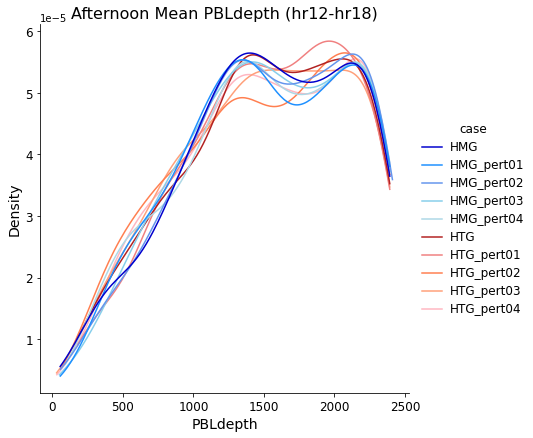

In [21]:
startHr = 12
endHr   = 18

distVar    = 'PBLdepth'
pltDistVar = plotPDFS_distVar(distVar,0)


## Get sensitive days

In [22]:
## Now get the dates where the HTG case has a really different behavior than the HMG one... 

# Use original HTG and HMG cases (no pertlim) 
# diff_realHTG   = np.squeeze(real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HTG')[0])) - np.squeeze(real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG')[0]))

# Use ens mean instead 
diff_realHTG   = np.squeeze(real_varEns_dayMean.isel(case=np.where(real_varEns_dayMean.case.values=='HTGensMean')[0])) - np.squeeze(real_varEns_dayMean.isel(case=np.where(real_varEns_dayMean.case.values=='HMGensMean')[0]))


highPct = 90
lowPct  = 10

print('Delineation based on ', varSel)
print('Real Surface:')
print('- - - - - - - - ')
print(highPct, 'th percentile difference (HTG): %.3e'  % np.nanpercentile(diff_realHTG, highPct))
print(lowPct,'th percentile difference (HTG):  %.3e'  % np.nanpercentile(diff_realHTG, lowPct))
print()
iHigh_realHTG  = np.where(diff_realHTG   >= np.nanpercentile(diff_realHTG, highPct))[0]
iLow_realHTG   = np.where(diff_realHTG   <= np.nanpercentile(diff_realHTG, lowPct))[0]


## Get indices of dates that are consistent...
listHigh_real = list(set( iHigh_realHTG )  )
listLow_real  = list(set( iLow_realHTG ) )

print('Num days consistent for high percentile (real sfc): ', len(listHigh_real))
print('Num days consistent for low  percentile (real sfc): ', len(listLow_real))



Delineation based on  PBLdepth
Real Surface:
- - - - - - - - 
90 th percentile difference (HTG): 9.405e+01
10 th percentile difference (HTG):  -1.137e+02

Num days consistent for high percentile (real sfc):  35
Num days consistent for low  percentile (real sfc):  35


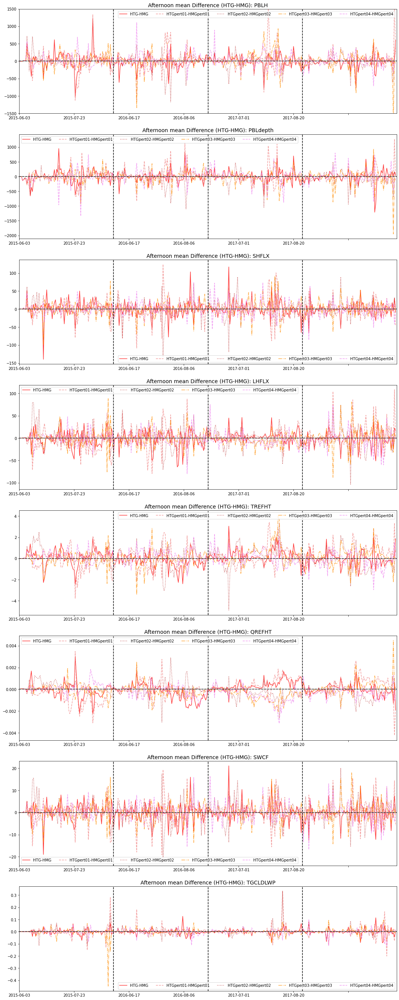

In [32]:
# Plot daily means...
plotVars = np.asarray(['PBLH','PBLdepth','SHFLX','LHFLX','TREFHT','QREFHT','SWCF','TGCLDLWP'])
nPlots = len(plotVars)

fig,axs = plt.subplots(nPlots,1, figsize=(18,6*nPlots))
axs     = axs.ravel()

for iPlot in range(nPlots):
    
    real_var         = realSfc_allCases[plotVars[iPlot]]
    ens_var          = ensCases[plotVars[iPlot]]
    iHours_real      = np.where( (real_var['time.hour']>=12) & (real_var['time.hour']<=18) )[0]
    real_var_selTime = real_var.isel(time=iHours_real)
    ens_var_selTime  = ens_var.isel(time=iHours_real)
    
    
    # For each date, get the mean value over the day
    real_var_dayMean = real_var_selTime.groupby('year_month_day').mean(dim='time')
    ens_var_dayMean  = ens_var_selTime.groupby('year_month_day').mean(dim='time')

    
    diffHTG      = real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HTG')[0]).values-real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG')[0]).values
    diff_p1HTGp1 = real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HTG_pert01')[0]).values-real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert01')[0]).values
    diff_p2HTGp2 = real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HTG_pert02')[0]).values-real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert02')[0]).values
    diff_p3HTGp3 = real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HTG_pert03')[0]).values-real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert03')[0]).values
    diff_p4HTGp4 = real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HTG_pert04')[0]).values-real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert04')[0]).values
    # diff_p5HTGp5 = real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HTG_pert05')[0]).values-real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert05')[0]).values
    # diff_p6HTGp6 = real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HTG_pert06')[0]).values-real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert06')[0]).values
    # diff_p7HTGp7 = real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HTG_pert07')[0]).values-real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert07')[0]).values



    diffHMGp1 = real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert01')[0]).values-real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG')[0]).values
    diffHMGp2 = real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert02')[0]).values-real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG')[0]).values
    diffHMGp3 = real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert03')[0]).values-real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG')[0]).values
    diffHMGp4 = real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert04')[0]).values-real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG')[0]).values
    # diffHMGp5 = real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert05')[0]).values-real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG')[0]).values
    # diffHMGp6 = real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert06')[0]).values-real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG')[0]).values
    # diffHMGp7 = real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert07')[0]).values-real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG')[0]).values
    diffHMGp2p1 = real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert02')[0]).values-real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert01')[0]).values
    diffHMGp3p2 = real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert03')[0]).values-real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert02')[0]).values
    diffHMGp4p3 = real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert04')[0]).values-real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert03')[0]).values
    # diffHMGp5p4 = real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert05')[0]).values-real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert04')[0]).values

    
    diffEns   = ens_var_dayMean.isel(case=np.where(ens_var_dayMean.case.values=='HTGensMean')[0]).values-ens_var_dayMean.isel(case=np.where(ens_var_dayMean.case.values=='HMGensMean')[0]).values
    
    ## Plot lines 
    axs[iPlot].plot(np.arange(len(np.squeeze(diffHTG))), np.squeeze(diffHTG), 
                    color='red', alpha=0.75, label='HTG-HMG')
    axs[iPlot].plot(np.arange(len(np.squeeze(diff_p1HTGp1))), np.squeeze(diff_p1HTGp1), 
                    color='lightcoral',linestyle='--', alpha=0.75, label='HTGpert01-HMGpert01')   # lightcoral
    axs[iPlot].plot(np.arange(len(np.squeeze(diff_p2HTGp2))), np.squeeze(diff_p2HTGp2), 
                    color='firebrick', linestyle=':', alpha=0.75, label='HTGpert02-HMGpert02') # orange
    axs[iPlot].plot(np.arange(len(np.squeeze(diff_p3HTGp3))), np.squeeze(diff_p3HTGp3), 
                    color='darkorange',linestyle='-.', alpha=0.75, label='HTGpert03-HMGpert03')   # lightcoral    
    axs[iPlot].plot(np.arange(len(np.squeeze(diff_p4HTGp4))), np.squeeze(diff_p4HTGp4), 
                    color='violet',linestyle='--', alpha=0.75, label='HTGpert04-HMGpert04')   # lightcoral     
    # axs[iPlot].plot(np.arange(len(np.squeeze(diff_p5HTGp5))), np.squeeze(diff_p5HTGp5), 
    #                 color='lightcoral',linestyle=':', alpha=0.75, label='HTGpert05-HMGpert05')   # lightcoral   
    # axs[iPlot].plot(np.arange(len(np.squeeze(diff_p6HTGp6))), np.squeeze(diff_p6HTGp6), 
    #                 color='lightcoral',linestyle='-.', alpha=0.75, label='HTGpert06-HMGpert06')   # lightcoral    
    # axs[iPlot].plot(np.arange(len(np.squeeze(diff_p7HTGp7))), np.squeeze(diff_p7HTGp7), 
    #                 color='lightcoral',linestyle='-', alpha=0.75, label='HTGpert07-HMGpert07')   # lightcoral 
        
    # axs[iPlot].plot(np.arange(len(np.squeeze(diffHMGp1))), np.squeeze(diffHMGp1), 
    #                 color='dodgerblue', alpha=0.75, label='HMGpert01-HMG')      # lightseagreen 
    # axs[iPlot].plot(np.arange(len(np.squeeze(diffHMGp2))), np.squeeze(diffHMGp2), 
    #                 color='dodgerblue',linestyle='--', alpha=0.8, label='HMGpert02-HMG')
    # axs[iPlot].plot(np.arange(len(np.squeeze(diffHMGp3))), np.squeeze(diffHMGp3), 
    #                 color='dodgerblue',linestyle=':', alpha=0.8, label='HMGpert03-HMG')
    # axs[iPlot].plot(np.arange(len(np.squeeze(diffHMGp4))), np.squeeze(diffHMGp4), 
    #                 color='dodgerblue',linestyle='-.', alpha=0.8, label='HMGpert04-HMG')
    # axs[iPlot].plot(np.arange(len(np.squeeze(diffHMGp5))), np.squeeze(diffHMGp5), 
    #                 color='lightseagreen',linestyle='--', alpha=0.8, label='HMGpert05-HMG')
    # axs[iPlot].plot(np.arange(len(np.squeeze(diffHMGp6))), np.squeeze(diffHMGp6), 
    #                 color='lightseagreen',linestyle=':', alpha=0.8, label='HMGpert06-HMG')
    # axs[iPlot].plot(np.arange(len(np.squeeze(diffHMGp7))), np.squeeze(diffHMGp7), 
    #                 color='lightseagreen',linestyle='-.', alpha=0.8, label='HMGpert07-HMG')
    # axs[iPlot].plot(np.arange(len(np.squeeze(diffHMGp2p1))), np.squeeze(diffHMGp2p1), 
    #                 color='green',linestyle='-', alpha=0.8, label='HMGpert02-HMGpert01')
    # axs[iPlot].plot(np.arange(len(np.squeeze(diffHMGp3p2))), np.squeeze(diffHMGp3p2), 
    #                 color='green',linestyle='--', alpha=0.8, label='HMGpert03-HMGpert02')
    # axs[iPlot].plot(np.arange(len(np.squeeze(diffHMGp4p3))), np.squeeze(diffHMGp4p3), 
    #                 color='green',linestyle=':', alpha=0.8, label='HMGpert04-HMGpert03')
    # axs[iPlot].plot(np.arange(len(np.squeeze(diffHMGp5p4))), np.squeeze(diffHMGp5p4), 
    #                 color='green',linestyle='-.', alpha=0.8, label='HMGpert05-HMGpert04')
    
#     axs[iPlot].plot(np.arange(len(np.squeeze(diffEns))), np.squeeze(diffEns), 
#                     'k', label='HTGens-HMGens')
        

    ## Add separating lines for ease of looking at these 
    axs[iPlot].axhline(0,color='k',linestyle='--')
    for iYr in range(len(yrStart)):
        axs[iPlot].axvline(yrStart[iYr], color='k',linestyle='--')


    # # Plot markers for days that qualify as high/low changes
    # axs[iPlot].plot(np.arange(len(np.squeeze(diffEns)))[listHigh_real], np.squeeze(diffEns)[listHigh_real],'k^',markersize=9,alpha=0.6, label='HighDay')
    # axs[iPlot].plot(np.arange(len(np.squeeze(diffEns)))[listLow_real],  np.squeeze(diffEns)[listLow_real],'kv',markersize=9,alpha=0.6, label='LowDay')

    axs[iPlot].legend(ncol=6)
    axs[iPlot].axhline(0,color='grey',alpha=0.5)
    
    # Add labels
    axs[iPlot].set_title('Afternoon mean Difference (HTG-HMG): '+plotVars[iPlot],fontsize=14)
    # axs[iPlot].set_title('Afternoon mean Difference (HMGpert-HMG): '+plotVars[iPlot],fontsize=14)

    ## Set a few axis limits as needed
    # axs[iPlot].set_xlim([0,80])
    # axs[iPlot].set_xlim([60,88])
    # axs[iPlot].set_xlim([0,15])
    
    axs[0].set_ylim([-1500,1500])
    
    axs[iPlot].set_xlim([0, len(strDates)])
    
    # Control tick labels
    xTicks       = axs[iPlot].get_xticks()
    dates_xticks = strDates[xTicks.astype(int)[:-2]]
    axs[iPlot].set_xticklabels(dates_xticks)
    
    
    

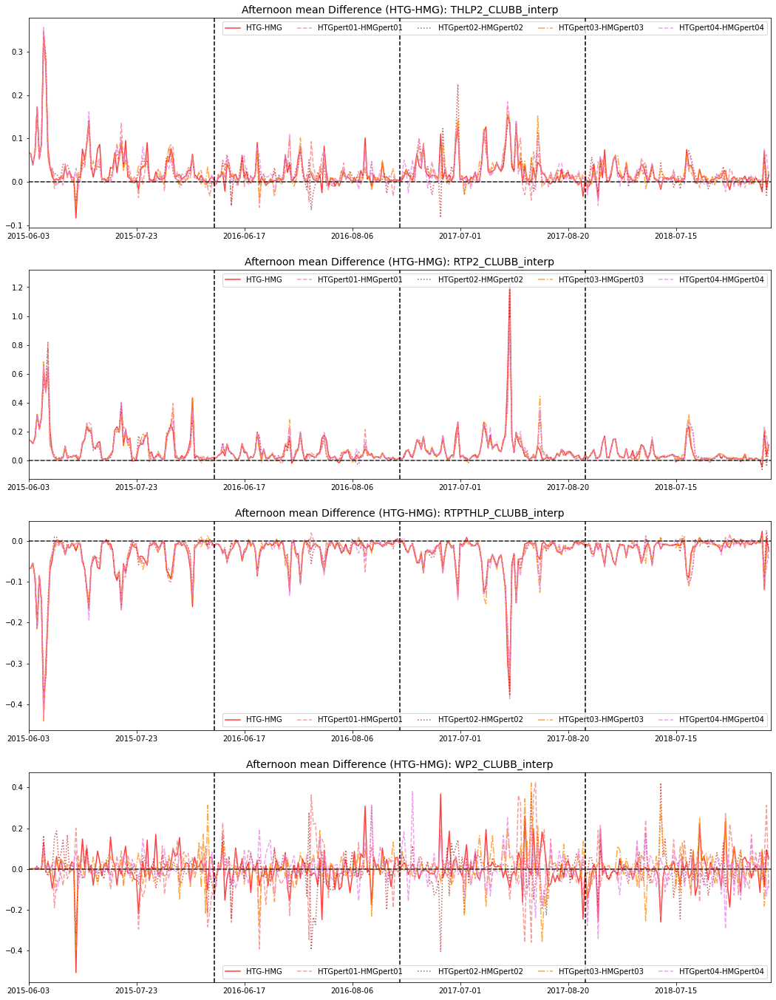

In [34]:
# Plot daily means...
plotVars = np.asarray(['THLP2_CLUBB_interp','RTP2_CLUBB_interp','RTPTHLP_CLUBB_interp','WP2_CLUBB_interp'])
nPlots = len(plotVars)

fig,axs = plt.subplots(nPlots,1, figsize=(18,6*nPlots))
axs     = axs.ravel()

for iPlot in range(nPlots):
    
    real_var         = realSfc_allCases[plotVars[iPlot]]
    ens_var          = ensCases[plotVars[iPlot]]
    iHours_real      = np.where( (real_var['time.hour']>=12) & (real_var['time.hour']<=18) )[0]
    real_var_selTime = real_var.isel(time=iHours_real, levInterp=-1)
    ens_var_selTime  = ens_var.isel(time=iHours_real, levInterp=-1)
    
    
    # For each date, get the mean value over the day
    real_var_dayMean = real_var_selTime.groupby('year_month_day').mean(dim='time')
    ens_var_dayMean  = ens_var_selTime.groupby('year_month_day').mean(dim='time')

    
    diffHTG      = real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HTG')[0]).values-real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG')[0]).values
    diff_p1HTGp1 = real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HTG_pert01')[0]).values-real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert01')[0]).values
    diff_p2HTGp2 = real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HTG_pert02')[0]).values-real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert02')[0]).values
    diff_p3HTGp3 = real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HTG_pert03')[0]).values-real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert03')[0]).values
    diff_p4HTGp4 = real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HTG_pert04')[0]).values-real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert04')[0]).values
    # diff_p5HTGp5 = real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HTG_pert05')[0]).values-real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert05')[0]).values
    # diff_p6HTGp6 = real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HTG_pert06')[0]).values-real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert06')[0]).values
    # diff_p7HTGp7 = real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HTG_pert07')[0]).values-real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert07')[0]).values



    diffHMGp1 = real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert01')[0]).values-real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG')[0]).values
    diffHMGp2 = real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert02')[0]).values-real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG')[0]).values
    diffHMGp3 = real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert03')[0]).values-real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG')[0]).values
    diffHMGp4 = real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert04')[0]).values-real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG')[0]).values
    # diffHMGp5 = real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert05')[0]).values-real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG')[0]).values
    # diffHMGp6 = real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert06')[0]).values-real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG')[0]).values
    # diffHMGp7 = real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert07')[0]).values-real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG')[0]).values
    diffHMGp2p1 = real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert02')[0]).values-real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert01')[0]).values
    diffHMGp3p2 = real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert03')[0]).values-real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert02')[0]).values
    diffHMGp4p3 = real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert04')[0]).values-real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert03')[0]).values
    # diffHMGp5p4 = real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert05')[0]).values-real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert04')[0]).values

    
    diffEns   = ens_var_dayMean.isel(case=np.where(ens_var_dayMean.case.values=='HTGensMean')[0]).values-ens_var_dayMean.isel(case=np.where(ens_var_dayMean.case.values=='HMGensMean')[0]).values
    
    ## Plot lines 
    axs[iPlot].plot(np.arange(len(np.squeeze(diffHTG))), np.squeeze(diffHTG), 
                    color='red', alpha=0.75, label='HTG-HMG')
    axs[iPlot].plot(np.arange(len(np.squeeze(diff_p1HTGp1))), np.squeeze(diff_p1HTGp1), 
                    color='lightcoral',linestyle='--', alpha=0.75, label='HTGpert01-HMGpert01')   # lightcoral
    axs[iPlot].plot(np.arange(len(np.squeeze(diff_p2HTGp2))), np.squeeze(diff_p2HTGp2), 
                    color='firebrick', linestyle=':', alpha=0.75, label='HTGpert02-HMGpert02') # orange
    axs[iPlot].plot(np.arange(len(np.squeeze(diff_p3HTGp3))), np.squeeze(diff_p3HTGp3), 
                    color='darkorange',linestyle='-.', alpha=0.75, label='HTGpert03-HMGpert03')   # lightcoral    
    axs[iPlot].plot(np.arange(len(np.squeeze(diff_p4HTGp4))), np.squeeze(diff_p4HTGp4), 
                    color='violet',linestyle='--', alpha=0.75, label='HTGpert04-HMGpert04')   # lightcoral     
#     axs[iPlot].plot(np.arange(len(np.squeeze(diff_p5HTGp5))), np.squeeze(diff_p5HTGp5), 
#                     color='lightcoral',linestyle=':', alpha=0.75, label='HTGpert05-HMGpert05')   # lightcoral   
#     axs[iPlot].plot(np.arange(len(np.squeeze(diff_p6HTGp6))), np.squeeze(diff_p6HTGp6), 
#                     color='lightcoral',linestyle='-.', alpha=0.75, label='HTGpert06-HMGpert06')   # lightcoral    
#     axs[iPlot].plot(np.arange(len(np.squeeze(diff_p7HTGp7))), np.squeeze(diff_p7HTGp7), 
#                     color='lightcoral',linestyle='-', alpha=0.75, label='HTGpert07-HMGpert07')   # lightcoral 
        
#     axs[iPlot].plot(np.arange(len(np.squeeze(diffHMGp1))), np.squeeze(diffHMGp1), 
#                     color='dodgerblue', alpha=0.75, label='HMGpert01-HMG')      # lightseagreen 
#     axs[iPlot].plot(np.arange(len(np.squeeze(diffHMGp2))), np.squeeze(diffHMGp2), 
#                     color='dodgerblue',linestyle='--', alpha=0.8, label='HMGpert02-HMG')
#     axs[iPlot].plot(np.arange(len(np.squeeze(diffHMGp3))), np.squeeze(diffHMGp3), 
#                     color='dodgerblue',linestyle=':', alpha=0.8, label='HMGpert03-HMG')
#     axs[iPlot].plot(np.arange(len(np.squeeze(diffHMGp4))), np.squeeze(diffHMGp4), 
#                     color='dodgerblue',linestyle='-.', alpha=0.8, label='HMGpert04-HMG')
#     axs[iPlot].plot(np.arange(len(np.squeeze(diffHMGp5))), np.squeeze(diffHMGp5), 
#                     color='lightseagreen',linestyle='--', alpha=0.8, label='HMGpert05-HMG')
#     axs[iPlot].plot(np.arange(len(np.squeeze(diffHMGp6))), np.squeeze(diffHMGp6), 
#                     color='lightseagreen',linestyle=':', alpha=0.8, label='HMGpert06-HMG')
#     axs[iPlot].plot(np.arange(len(np.squeeze(diffHMGp7))), np.squeeze(diffHMGp7), 
#                     color='lightseagreen',linestyle='-.', alpha=0.8, label='HMGpert07-HMG')
#     axs[iPlot].plot(np.arange(len(np.squeeze(diffHMGp2p1))), np.squeeze(diffHMGp2p1), 
#                     color='green',linestyle='-', alpha=0.8, label='HMGpert02-HMGpert01')
#     axs[iPlot].plot(np.arange(len(np.squeeze(diffHMGp3p2))), np.squeeze(diffHMGp3p2), 
#                     color='green',linestyle='--', alpha=0.8, label='HMGpert03-HMGpert02')
#     axs[iPlot].plot(np.arange(len(np.squeeze(diffHMGp4p3))), np.squeeze(diffHMGp4p3), 
#                     color='green',linestyle=':', alpha=0.8, label='HMGpert04-HMGpert03')
#     axs[iPlot].plot(np.arange(len(np.squeeze(diffHMGp5p4))), np.squeeze(diffHMGp5p4), 
#                     color='green',linestyle='-.', alpha=0.8, label='HMGpert05-HMGpert04')
    
    # axs[iPlot].plot(np.arange(len(np.squeeze(diffEns))), np.squeeze(diffEns), 
    #                 'k', label='HTGens-HMGens')
        

    ## Add separating lines for ease of looking at these 
    axs[iPlot].axhline(0,color='k',linestyle='--')
    for iYr in range(len(yrStart)):
        axs[iPlot].axvline(yrStart[iYr], color='k',linestyle='--')


    # # Plot markers for days that qualify as high/low changes
    # axs[iPlot].plot(np.arange(len(np.squeeze(diffEns)))[listHigh_real], np.squeeze(diffEns)[listHigh_real],'k^',markersize=9,alpha=0.6, label='HighDay')
    # axs[iPlot].plot(np.arange(len(np.squeeze(diffEns)))[listLow_real],  np.squeeze(diffEns)[listLow_real],'kv',markersize=9,alpha=0.6, label='LowDay')

    axs[iPlot].legend(ncol=6)
    axs[iPlot].axhline(0,color='grey',alpha=0.5)
    
    # Add labels
    axs[iPlot].set_title('Afternoon mean Difference (HTG-HMG): '+plotVars[iPlot],fontsize=14)
    # axs[iPlot].set_title('Afternoon mean Difference (HMGpert-HMG): '+plotVars[iPlot],fontsize=14)

    ## Set a few axis limits as needed
    # axs[iPlot].set_xlim([0,80])
    # axs[iPlot].set_xlim([60,88])
    # axs[iPlot].set_xlim([0,15])
    
    axs[iPlot].set_xlim([0, len(strDates)])

    
    # Control tick labels
    xTicks       = axs[iPlot].get_xticks()
    dates_xticks = strDates[xTicks.astype(int)[:-1]]
    axs[iPlot].set_xticklabels(dates_xticks)
    
    
    

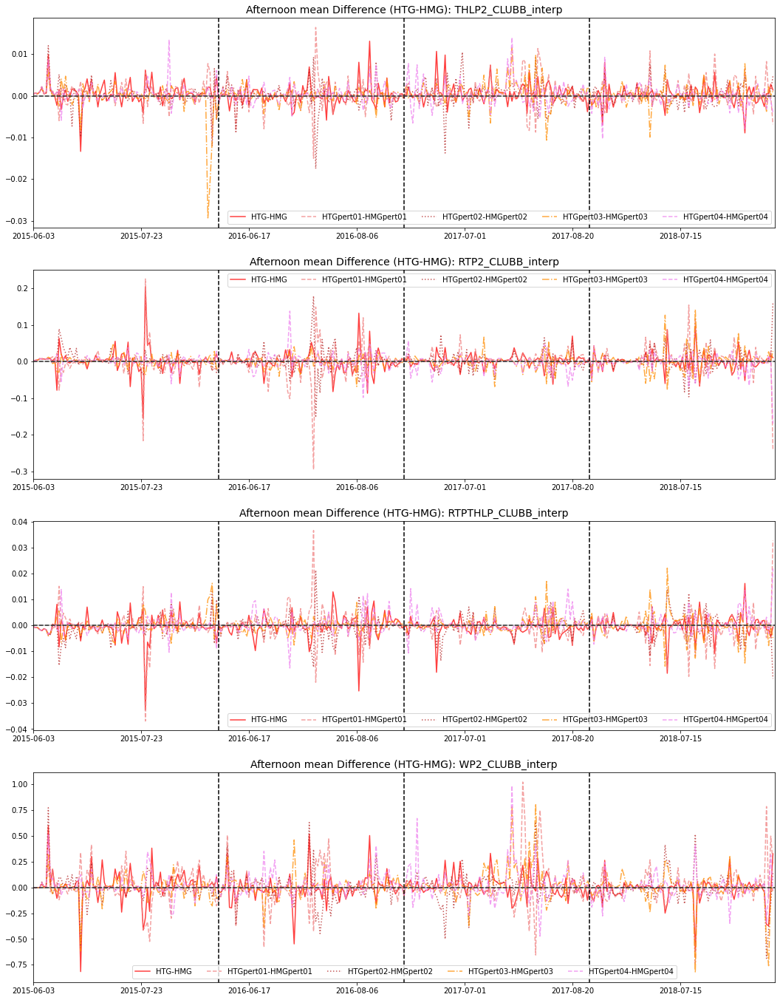

In [38]:
# Plot daily means...
plotVars = np.asarray(['THLP2_CLUBB_interp','RTP2_CLUBB_interp','RTPTHLP_CLUBB_interp','WP2_CLUBB_interp'])
nPlots = len(plotVars)

fig,axs = plt.subplots(nPlots,1, figsize=(18,6*nPlots))
axs     = axs.ravel()

levMeanBottom = 950 
levMeanTop    = 800 

iLevSel       = np.where( (realSfc_allCases.levInterp.values<=levMeanBottom) & (realSfc_allCases.levInterp.values>=levMeanTop) )[0]

for iPlot in range(nPlots):
    
    real_var         = realSfc_allCases[plotVars[iPlot]]
    ens_var          = ensCases[plotVars[iPlot]]
    iHours_real      = np.where( (real_var['time.hour']>=12) & (real_var['time.hour']<=18) )[0]
    real_var_selTime = real_var.isel(time=iHours_real, levInterp=iLevSel).mean(dim='levInterp')
    ens_var_selTime  = ens_var.isel(time=iHours_real, levInterp=iLevSel).mean(dim='levInterp')
    
    
    # For each date, get the mean value over the day
    real_var_dayMean = real_var_selTime.groupby('year_month_day').mean(dim='time')
    ens_var_dayMean  = ens_var_selTime.groupby('year_month_day').mean(dim='time')

    
    diffHTG      = real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HTG')[0]).values-real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG')[0]).values
    diff_p1HTGp1 = real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HTG_pert01')[0]).values-real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert01')[0]).values
    diff_p2HTGp2 = real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HTG_pert02')[0]).values-real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert02')[0]).values
    diff_p3HTGp3 = real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HTG_pert03')[0]).values-real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert03')[0]).values
    diff_p4HTGp4 = real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HTG_pert04')[0]).values-real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert04')[0]).values
    # diff_p5HTGp5 = real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HTG_pert05')[0]).values-real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert05')[0]).values
    # diff_p6HTGp6 = real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HTG_pert06')[0]).values-real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert06')[0]).values
    # diff_p7HTGp7 = real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HTG_pert07')[0]).values-real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert07')[0]).values



    diffHMGp1 = real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert01')[0]).values-real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG')[0]).values
    diffHMGp2 = real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert02')[0]).values-real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG')[0]).values
    diffHMGp3 = real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert03')[0]).values-real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG')[0]).values
    diffHMGp4 = real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert04')[0]).values-real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG')[0]).values
    # diffHMGp5 = real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert05')[0]).values-real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG')[0]).values
    # diffHMGp6 = real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert06')[0]).values-real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG')[0]).values
    # diffHMGp7 = real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert07')[0]).values-real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG')[0]).values
    diffHMGp2p1 = real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert02')[0]).values-real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert01')[0]).values
    diffHMGp3p2 = real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert03')[0]).values-real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert02')[0]).values
    diffHMGp4p3 = real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert04')[0]).values-real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert03')[0]).values
    # diffHMGp5p4 = real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert05')[0]).values-real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert04')[0]).values

    
    diffEns   = ens_var_dayMean.isel(case=np.where(ens_var_dayMean.case.values=='HTGensMean')[0]).values-ens_var_dayMean.isel(case=np.where(ens_var_dayMean.case.values=='HMGensMean')[0]).values
    
    ## Plot lines 
    axs[iPlot].plot(np.arange(len(np.squeeze(diffHTG))), np.squeeze(diffHTG), 
                    color='red', alpha=0.75, label='HTG-HMG')
    axs[iPlot].plot(np.arange(len(np.squeeze(diff_p1HTGp1))), np.squeeze(diff_p1HTGp1), 
                    color='lightcoral',linestyle='--', alpha=0.75, label='HTGpert01-HMGpert01')   # lightcoral
    axs[iPlot].plot(np.arange(len(np.squeeze(diff_p2HTGp2))), np.squeeze(diff_p2HTGp2), 
                    color='firebrick', linestyle=':', alpha=0.75, label='HTGpert02-HMGpert02') # orange
    axs[iPlot].plot(np.arange(len(np.squeeze(diff_p3HTGp3))), np.squeeze(diff_p3HTGp3), 
                    color='darkorange',linestyle='-.', alpha=0.75, label='HTGpert03-HMGpert03')   # lightcoral    
    axs[iPlot].plot(np.arange(len(np.squeeze(diff_p4HTGp4))), np.squeeze(diff_p4HTGp4), 
                    color='violet',linestyle='--', alpha=0.75, label='HTGpert04-HMGpert04')   # lightcoral     
#     axs[iPlot].plot(np.arange(len(np.squeeze(diff_p5HTGp5))), np.squeeze(diff_p5HTGp5), 
#                     color='lightcoral',linestyle=':', alpha=0.75, label='HTGpert05-HMGpert05')   # lightcoral   
#     axs[iPlot].plot(np.arange(len(np.squeeze(diff_p6HTGp6))), np.squeeze(diff_p6HTGp6), 
#                     color='lightcoral',linestyle='-.', alpha=0.75, label='HTGpert06-HMGpert06')   # lightcoral    
#     axs[iPlot].plot(np.arange(len(np.squeeze(diff_p7HTGp7))), np.squeeze(diff_p7HTGp7), 
#                     color='lightcoral',linestyle='-', alpha=0.75, label='HTGpert07-HMGpert07')   # lightcoral 
        
#     axs[iPlot].plot(np.arange(len(np.squeeze(diffHMGp1))), np.squeeze(diffHMGp1), 
#                     color='dodgerblue', alpha=0.75, label='HMGpert01-HMG')      # lightseagreen 
#     axs[iPlot].plot(np.arange(len(np.squeeze(diffHMGp2))), np.squeeze(diffHMGp2), 
#                     color='dodgerblue',linestyle='--', alpha=0.8, label='HMGpert02-HMG')
#     axs[iPlot].plot(np.arange(len(np.squeeze(diffHMGp3))), np.squeeze(diffHMGp3), 
#                     color='dodgerblue',linestyle=':', alpha=0.8, label='HMGpert03-HMG')
#     axs[iPlot].plot(np.arange(len(np.squeeze(diffHMGp4))), np.squeeze(diffHMGp4), 
#                     color='dodgerblue',linestyle='-.', alpha=0.8, label='HMGpert04-HMG')
#     axs[iPlot].plot(np.arange(len(np.squeeze(diffHMGp5))), np.squeeze(diffHMGp5), 
#                     color='lightseagreen',linestyle='--', alpha=0.8, label='HMGpert05-HMG')
#     axs[iPlot].plot(np.arange(len(np.squeeze(diffHMGp6))), np.squeeze(diffHMGp6), 
#                     color='lightseagreen',linestyle=':', alpha=0.8, label='HMGpert06-HMG')
#     axs[iPlot].plot(np.arange(len(np.squeeze(diffHMGp7))), np.squeeze(diffHMGp7), 
#                     color='lightseagreen',linestyle='-.', alpha=0.8, label='HMGpert07-HMG')
#     axs[iPlot].plot(np.arange(len(np.squeeze(diffHMGp2p1))), np.squeeze(diffHMGp2p1), 
#                     color='green',linestyle='-', alpha=0.8, label='HMGpert02-HMGpert01')
#     axs[iPlot].plot(np.arange(len(np.squeeze(diffHMGp3p2))), np.squeeze(diffHMGp3p2), 
#                     color='green',linestyle='--', alpha=0.8, label='HMGpert03-HMGpert02')
#     axs[iPlot].plot(np.arange(len(np.squeeze(diffHMGp4p3))), np.squeeze(diffHMGp4p3), 
#                     color='green',linestyle=':', alpha=0.8, label='HMGpert04-HMGpert03')
#     axs[iPlot].plot(np.arange(len(np.squeeze(diffHMGp5p4))), np.squeeze(diffHMGp5p4), 
#                     color='green',linestyle='-.', alpha=0.8, label='HMGpert05-HMGpert04')
    
    # axs[iPlot].plot(np.arange(len(np.squeeze(diffEns))), np.squeeze(diffEns), 
    #                 'k', label='HTGens-HMGens')
        

    ## Add separating lines for ease of looking at these 
    axs[iPlot].axhline(0,color='k',linestyle='--')
    for iYr in range(len(yrStart)):
        axs[iPlot].axvline(yrStart[iYr], color='k',linestyle='--')


    # # Plot markers for days that qualify as high/low changes
    # axs[iPlot].plot(np.arange(len(np.squeeze(diffEns)))[listHigh_real], np.squeeze(diffEns)[listHigh_real],'k^',markersize=9,alpha=0.6, label='HighDay')
    # axs[iPlot].plot(np.arange(len(np.squeeze(diffEns)))[listLow_real],  np.squeeze(diffEns)[listLow_real],'kv',markersize=9,alpha=0.6, label='LowDay')

    axs[iPlot].legend(ncol=6)
    axs[iPlot].axhline(0,color='grey',alpha=0.5)
    
    # Add labels
    axs[iPlot].set_title('Afternoon mean Difference (HTG-HMG): '+plotVars[iPlot],fontsize=14)
    # axs[iPlot].set_title('Afternoon mean Difference (HMGpert-HMG): '+plotVars[iPlot],fontsize=14)

    ## Set a few axis limits as needed
    # axs[iPlot].set_xlim([0,80])
    # axs[iPlot].set_xlim([60,88])
    # axs[iPlot].set_xlim([0,15])
    
    axs[iPlot].set_xlim([0, len(strDates)])

    
    # Control tick labels
    xTicks       = axs[iPlot].get_xticks()
    dates_xticks = strDates[xTicks.astype(int)[:-1]]
    axs[iPlot].set_xticklabels(dates_xticks)
    
    
    

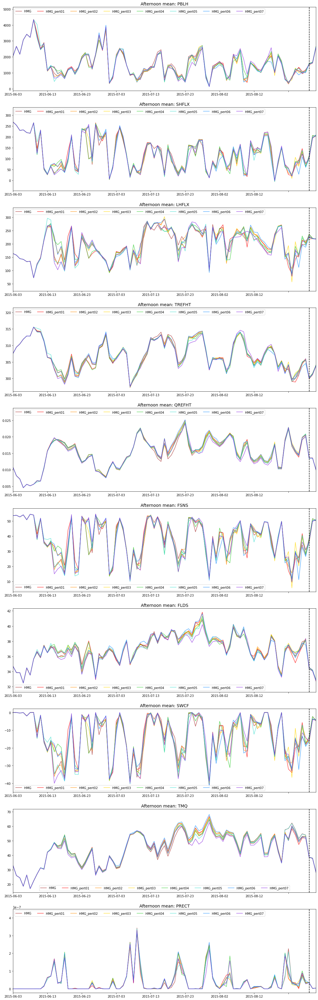

In [27]:
# Plot raw timeseries (based on afternoon mean values, so it's a bit more clear) 
plotVars = np.asarray(['PBLH','SHFLX','LHFLX','TREFHT','QREFHT','FSNS','FLDS','SWCF','TMQ','PRECT'])
nPlots = len(plotVars)

## Plot option for HMG/HTG lines 
pltTimeseries_HMG = True 
pltTimeseries_HTG = False 

fig,axs = plt.subplots(nPlots,1, figsize=(18,6*nPlots))
axs     = axs.ravel()

for iPlot in range(nPlots):
    
    real_var         = realSfc_allCases[plotVars[iPlot]]
    ens_var          = ensCases[plotVars[iPlot]]
    iHours_real      = np.where( (real_var['time.hour']>=12) & (real_var['time.hour']<=18) )[0]
    real_var_selTime = real_var.isel(time=iHours_real)
    ens_var_selTime  = ens_var.isel(time=iHours_real)
    
    
    # For each date, get the mean value over the day
    real_var_dayMean = real_var_selTime.groupby('year_month_day').mean(dim='time')
    ens_var_dayMean  = ens_var_selTime.groupby('year_month_day').mean(dim='time')
    
    nDays = len(real_var_dayMean.year_month_day.values)
        
    ## Plot lines 
    if pltTimeseries_HMG: 
        axs[iPlot].plot(np.arange(nDays), 
                        np.squeeze(real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG')[0]).values), 
                        color='brown', linestyle='-', alpha=0.75, label='HMG')
    if pltTimeseries_HTG:
        axs[iPlot].plot(np.arange(nDays), 
                        np.squeeze(real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HTG')[0]).values), 
                        color='brown', linestyle='--', alpha=0.75, label='HTG')
        
    if pltTimeseries_HMG: 
        axs[iPlot].plot(np.arange(nDays), 
                        np.squeeze(real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert01')[0]).values), 
                        color='red', linestyle='-', alpha=0.75, label='HMG_pert01')
    if pltTimeseries_HTG: 
        axs[iPlot].plot(np.arange(nDays), 
                        np.squeeze(real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HTG_pert01')[0]).values), 
                        color='red', linestyle='--', alpha=0.75, label='HTG_pert01')
        
    if pltTimeseries_HMG: 
        axs[iPlot].plot(np.arange(nDays), 
                        np.squeeze(real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert02')[0]).values), 
                        color='darkorange', linestyle='-', alpha=0.75, label='HMG_pert02')
    if pltTimeseries_HTG: 
        axs[iPlot].plot(np.arange(nDays), 
                        np.squeeze(real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HTG_pert02')[0]).values), 
                        color='darkorange', linestyle='--', alpha=0.75, label='HTG_pert02')
        
    if pltTimeseries_HMG: 
        axs[iPlot].plot(np.arange(nDays), 
                        np.squeeze(real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert03')[0]).values), 
                        color='gold', linestyle='-', alpha=0.75, label='HMG_pert03')
    if pltTimeseries_HTG: 
        axs[iPlot].plot(np.arange(nDays), 
                        np.squeeze(real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HTG_pert03')[0]).values), 
                        color='gold', linestyle='--', alpha=0.75, label='HTG_pert03')

    if pltTimeseries_HMG: 
        axs[iPlot].plot(np.arange(nDays), 
                        np.squeeze(real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert04')[0]).values), 
                        color='limegreen', linestyle='-', alpha=0.75, label='HMG_pert04')
    if pltTimeseries_HTG: 
        axs[iPlot].plot(np.arange(nDays), 
                        np.squeeze(real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HTG_pert04')[0]).values), 
                        color='limegreen', linestyle='--', alpha=0.75, label='HTG_pert04')

    if pltTimeseries_HMG: 
        axs[iPlot].plot(np.arange(nDays), 
                        np.squeeze(real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert05')[0]).values), 
                        color='turquoise', linestyle='-', alpha=0.75, label='HMG_pert05')
    if pltTimeseries_HTG: 
        axs[iPlot].plot(np.arange(nDays), 
                        np.squeeze(real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HTG_pert05')[0]).values), 
                        color='turquoise', linestyle='--', alpha=0.75, label='HTG_pert05')

    if pltTimeseries_HMG: 
        axs[iPlot].plot(np.arange(nDays), 
                        np.squeeze(real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert06')[0]).values), 
                        color='dodgerblue', linestyle='-', alpha=0.75, label='HMG_pert06')
    if pltTimeseries_HTG: 
        axs[iPlot].plot(np.arange(nDays), 
                        np.squeeze(real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HTG_pert06')[0]).values), 
                        color='dodgerblue', linestyle='--', alpha=0.75, label='HTG_pert06')    

    if pltTimeseries_HMG: 
        axs[iPlot].plot(np.arange(nDays), 
                        np.squeeze(real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert07')[0]).values), 
                        color='blueviolet', linestyle='-', alpha=0.75, label='HMG_pert07')
    if pltTimeseries_HTG: 
        axs[iPlot].plot(np.arange(nDays), 
                        np.squeeze(real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HTG_pert07')[0]).values), 
                        color='blueviolet', linestyle='--', alpha=0.75, label='HTG_pert07')
    
    ## Add separating lines for ease of looking at these 
    # axs[iPlot].axhline(0,color='k',linestyle='--')
    for iYr in range(len(yrStart)):
        axs[iPlot].axvline(yrStart[iYr], color='k',linestyle='--')
        
    axs[iPlot].legend(ncol=8)
    
    # Add labels
    # axs[iPlot].set_title('Afternoon mean Difference (HTG-HMG): '+plotVars[iPlot],fontsize=14)
    axs[iPlot].set_title('Afternoon mean: '+plotVars[iPlot],fontsize=14)

    ## Set a few axis limits as needed
    axs[iPlot].set_xlim([0,88])
    # axs[iPlot].set_ylim([-1500, 1500])
    
    # Control tick labels
    xTicks       = axs[iPlot].get_xticks()
    dates_xticks = strDates[xTicks.astype(int)[:-2]]
    axs[iPlot].set_xticklabels(dates_xticks)
    
    
    

(1000.0, 200.0)

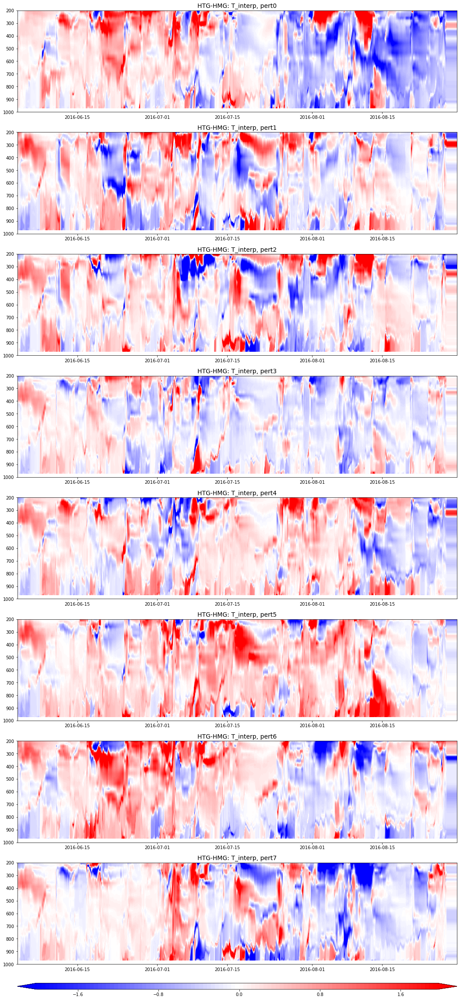

In [26]:
## Plot time-height differences for each ens member (how much is the atm changing too?) 

## Plot raw timeseries (time-hgt)

# Plot timeseries in the vertical

plotVars = 'T_interp'
levsDiff = np.arange(-2, 2, (4)/100.0)

real_var     = realSfc_allCases[plotVars]
timeArr      = real_var.time.values

diffHTG      = real_var.isel(case=np.where(real_var.case.values=='HTG')[0]).values-real_var.isel(case=np.where(real_var.case.values=='HMG')[0]).values
diff_p1HTGp1 = real_var.isel(case=np.where(real_var.case.values=='HTG_pert01')[0]).values-real_var.isel(case=np.where(real_var.case.values=='HMG_pert01')[0]).values
diff_p2HTGp2 = real_var.isel(case=np.where(real_var.case.values=='HTG_pert02')[0]).values-real_var.isel(case=np.where(real_var.case.values=='HMG_pert02')[0]).values
diff_p3HTGp3 = real_var.isel(case=np.where(real_var.case.values=='HTG_pert03')[0]).values-real_var.isel(case=np.where(real_var.case.values=='HMG_pert03')[0]).values
diff_p4HTGp4 = real_var.isel(case=np.where(real_var.case.values=='HTG_pert04')[0]).values-real_var.isel(case=np.where(real_var.case.values=='HMG_pert04')[0]).values
diff_p5HTGp5 = real_var.isel(case=np.where(real_var.case.values=='HTG_pert05')[0]).values-real_var.isel(case=np.where(real_var.case.values=='HMG_pert05')[0]).values
diff_p6HTGp6 = real_var.isel(case=np.where(real_var.case.values=='HTG_pert06')[0]).values-real_var.isel(case=np.where(real_var.case.values=='HMG_pert06')[0]).values
diff_p7HTGp7 = real_var.isel(case=np.where(real_var.case.values=='HTG_pert07')[0]).values-real_var.isel(case=np.where(real_var.case.values=='HMG_pert07')[0]).values

if np.shape(diffHTG)[2]==64:
    levArr = real_var.lev.values 
elif np.shape(diffHTG)[2]==65:
    levArr = real_var.ilev.values 
elif np.shape(diffHTG)[2]==78:
    levArr = real_var.levInterp.values 

# - - - - - - - - - - - plots - - - - - - - - - - - - - 
    
fig,axs = plt.subplots(8,1, figsize=(18,5*8))
axs     = axs.ravel()

axs[0].contourf(timeArr, levArr, np.squeeze(diffHTG).transpose(), levsDiff, cmap='bwr', extend='both')
axs[1].contourf(timeArr, levArr, np.squeeze(diff_p1HTGp1).transpose(), levsDiff, cmap='bwr', extend='both')
axs[2].contourf(timeArr, levArr, np.squeeze(diff_p2HTGp2).transpose(), levsDiff, cmap='bwr', extend='both')
axs[3].contourf(timeArr, levArr, np.squeeze(diff_p3HTGp3).transpose(), levsDiff, cmap='bwr', extend='both')
axs[4].contourf(timeArr, levArr, np.squeeze(diff_p4HTGp4).transpose(), levsDiff, cmap='bwr', extend='both')
axs[5].contourf(timeArr, levArr, np.squeeze(diff_p5HTGp5).transpose(), levsDiff, cmap='bwr', extend='both')
axs[6].contourf(timeArr, levArr, np.squeeze(diff_p6HTGp6).transpose(), levsDiff, cmap='bwr', extend='both')
cplot=axs[7].contourf(timeArr, levArr, np.squeeze(diff_p7HTGp7).transpose(), levsDiff, cmap='bwr', extend='both')

# Add colorbar
ax_position = axs[7].get_position()
cbar_ax = fig.add_axes([ax_position.x0, ax_position.y0-0.02, ax_position.width, 0.005])
cbar = plt.colorbar(cplot, orientation='horizontal',cax=cbar_ax)
tick_locator = ticker.MaxNLocator(nbins=5)
cbar.locator = tick_locator
cbar.update_ticks()

        

## - - - - - - - - - - - - - - - - - - - - - - - - - -   
# Add labels

axs[0].set_title('HTG-HMG: '+plotVars+', pert0',fontsize=14)
axs[1].set_title('HTG-HMG: '+plotVars+', pert1',fontsize=14)
axs[2].set_title('HTG-HMG: '+plotVars+', pert2',fontsize=14)
axs[3].set_title('HTG-HMG: '+plotVars+', pert3',fontsize=14)
axs[4].set_title('HTG-HMG: '+plotVars+', pert4',fontsize=14)
axs[5].set_title('HTG-HMG: '+plotVars+', pert5',fontsize=14)
axs[6].set_title('HTG-HMG: '+plotVars+', pert6',fontsize=14)
axs[7].set_title('HTG-HMG: '+plotVars+', pert7',fontsize=14)

axs[0].set_xlim([datetime.date(2016,6,3), datetime.date(2016,8,30)])
axs[1].set_xlim([datetime.date(2016,6,3), datetime.date(2016,8,30)])
axs[2].set_xlim([datetime.date(2016,6,3), datetime.date(2016,8,30)])
axs[3].set_xlim([datetime.date(2016,6,3), datetime.date(2016,8,30)])
axs[4].set_xlim([datetime.date(2016,6,3), datetime.date(2016,8,30)])
axs[5].set_xlim([datetime.date(2016,6,3), datetime.date(2016,8,30)])
axs[6].set_xlim([datetime.date(2016,6,3), datetime.date(2016,8,30)])
axs[7].set_xlim([datetime.date(2016,6,3), datetime.date(2016,8,30)])

axs[0].invert_yaxis()
axs[1].invert_yaxis()
axs[2].invert_yaxis()
axs[3].invert_yaxis()
axs[4].invert_yaxis()
axs[5].invert_yaxis()
axs[6].invert_yaxis()
axs[7].invert_yaxis()

axs[0].set_ylim([1000,200])
axs[1].set_ylim([1000,200])
axs[2].set_ylim([1000,200])
axs[3].set_ylim([1000,200])
axs[4].set_ylim([1000,200])
axs[5].set_ylim([1000,200])
axs[6].set_ylim([1000,200])
axs[7].set_ylim([1000,200])


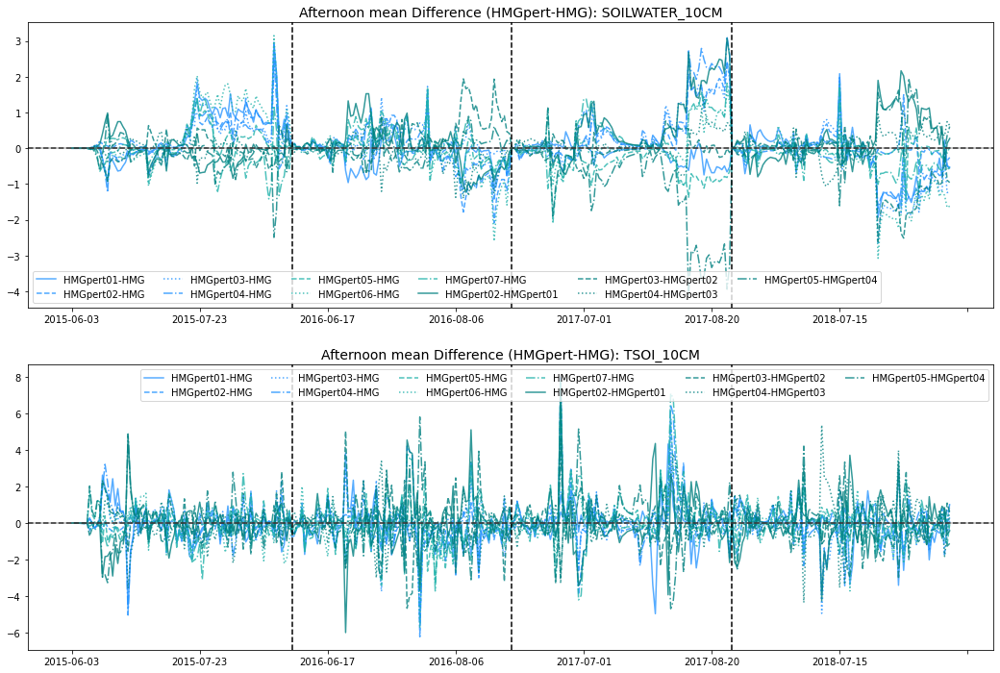

In [24]:
# Plot daily means...
plotVars = np.asarray(['SOILWATER_10CM','TSOI_10CM'])
nPlots = len(plotVars)

fig,axs = plt.subplots(nPlots,1, figsize=(18,6*nPlots))
axs     = axs.ravel()

for iPlot in range(nPlots):
    
    real_var         = realSfcCLM_allCases[plotVars[iPlot]]
    ens_var          = ensCasesCLM[plotVars[iPlot]]
    iHours_real      = np.where( (real_var['time.hour']>=12) & (real_var['time.hour']<=18) )[0]
    real_var_selTime = real_var.isel(time=iHours_real)
    ens_var_selTime  = ens_var.isel(time=iHours_real)
    
    
    # For each date, get the mean value over the day
    real_var_dayMean = real_var_selTime.groupby('year_month_day').mean(dim='time')
    ens_var_dayMean  = ens_var_selTime.groupby('year_month_day').mean(dim='time')

    
    diffHTG      = real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HTG')[0]).values-real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG')[0]).values
    diff_p1HTGp1 = real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HTG_pert01')[0]).values-real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert01')[0]).values
    diff_p2HTGp2 = real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HTG_pert02')[0]).values-real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert02')[0]).values
    diff_p3HTGp3 = real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HTG_pert03')[0]).values-real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert03')[0]).values
    diff_p4HTGp4 = real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HTG_pert04')[0]).values-real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert04')[0]).values
    diff_p5HTGp5 = real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HTG_pert05')[0]).values-real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert05')[0]).values
    diff_p6HTGp6 = real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HTG_pert06')[0]).values-real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert06')[0]).values
    diff_p7HTGp7 = real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HTG_pert07')[0]).values-real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert07')[0]).values

    pctdiffHTG      = (real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HTG')[0]).values-real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG')[0]).values)/real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG')[0]).values
    pctdiff_p1HTGp1 = (real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HTG_pert01')[0]).values-real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert01')[0]).values)/real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert01')[0]).values
    pctdiff_p2HTGp2 = (real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HTG_pert02')[0]).values-real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert02')[0]).values)/real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert02')[0]).values
    pctdiff_p3HTGp3 = (real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HTG_pert03')[0]).values-real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert03')[0]).values)/real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert03')[0]).values
    pctdiff_p4HTGp4 = (real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HTG_pert04')[0]).values-real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert04')[0]).values)/real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert04')[0]).values
    pctdiff_p5HTGp5 = (real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HTG_pert05')[0]).values-real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert05')[0]).values)/real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert05')[0]).values
    pctdiff_p6HTGp6 = (real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HTG_pert06')[0]).values-real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert06')[0]).values)/real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert06')[0]).values
    pctdiff_p7HTGp7 = (real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HTG_pert07')[0]).values-real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert07')[0]).values)/real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert07')[0]).values



    diffHMGp1 = real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert01')[0]).values-real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG')[0]).values
    diffHMGp2 = real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert02')[0]).values-real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG')[0]).values
    diffHMGp3 = real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert03')[0]).values-real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG')[0]).values
    diffHMGp4 = real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert04')[0]).values-real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG')[0]).values
    diffHMGp5 = real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert05')[0]).values-real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG')[0]).values
    diffHMGp6 = real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert06')[0]).values-real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG')[0]).values
    diffHMGp7 = real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert07')[0]).values-real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG')[0]).values
    diffHMGp2p1 = real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert02')[0]).values-real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert01')[0]).values
    diffHMGp3p2 = real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert03')[0]).values-real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert02')[0]).values
    diffHMGp4p3 = real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert04')[0]).values-real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert03')[0]).values
    diffHMGp5p4 = real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert05')[0]).values-real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert04')[0]).values
 
    pctdiffHMGp1 = (real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert01')[0]).values-real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG')[0]).values)/real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG')[0]).values
    pctdiffHMGp2 = (real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert02')[0]).values-real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG')[0]).values)/real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG')[0]).values
    pctdiffHMGp3 = (real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert03')[0]).values-real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG')[0]).values)/real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG')[0]).values
    pctdiffHMGp4 = (real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert04')[0]).values-real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG')[0]).values)/real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG')[0]).values
    pctdiffHMGp5 = (real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert05')[0]).values-real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG')[0]).values)/real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG')[0]).values
    pctdiffHMGp6 = (real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert06')[0]).values-real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG')[0]).values)/real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG')[0]).values
    pctdiffHMGp7 = (real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert07')[0]).values-real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG')[0]).values)/real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG')[0]).values
    pctdiffHMGp2p1 = (real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert02')[0]).values-real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert01')[0]).values)/real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert01')[0]).values
    pctdiffHMGp3p2 = (real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert03')[0]).values-real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert02')[0]).values)/real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert02')[0]).values
    pctdiffHMGp4p3 = (real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert04')[0]).values-real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert03')[0]).values)/real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert03')[0]).values
    pctdiffHMGp5p4 = (real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert05')[0]).values-real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert04')[0]).values)/real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert04')[0]).values

    
    diffEns   = ens_var_dayMean.isel(case=np.where(ens_var_dayMean.case.values=='HTGensMean')[0]).values-ens_var_dayMean.isel(case=np.where(ens_var_dayMean.case.values=='HMGensMean')[0]).values
    
    ## Plot lines 
    # axs[iPlot].plot(np.arange(len(np.squeeze(pctdiffHTG))), np.squeeze(pctdiffHTG*100), 
    #                 color='darkorchid', alpha=0.75, label='HTG-HMG')
    # axs[iPlot].plot(np.arange(len(np.squeeze(pctdiff_p1HTGp1))), np.squeeze(pctdiff_p1HTGp1*100), 
    #                 color='darkorchid',linestyle='--', alpha=0.75, label='HTGpert01-HMGpert01')   # lightcoral
    # axs[iPlot].plot(np.arange(len(np.squeeze(pctdiff_p2HTGp2))), np.squeeze(pctdiff_p2HTGp2*100), 
    #                 color='darkorchid', linestyle=':', alpha=0.75, label='HTGpert02-HMGpert02') # orange
    # axs[iPlot].plot(np.arange(len(np.squeeze(pctdiff_p3HTGp3))), np.squeeze(pctdiff_p3HTGp3*100), 
    #                 color='darkorchid',linestyle='-.', alpha=0.75, label='HTGpert03-HMGpert03')   # lightcoral    
    # axs[iPlot].plot(np.arange(len(np.squeeze(pctdiff_p4HTGp4))), np.squeeze(pctdiff_p4HTGp4*100), 
    #                 color='orchid',linestyle='--', alpha=0.75, label='HTGpert04-HMGpert04')   # lightcoral     
    # axs[iPlot].plot(np.arange(len(np.squeeze(pctdiff_p5HTGp5))), np.squeeze(pctdiff_p5HTGp5*100), 
    #                 color='orchid',linestyle=':', alpha=0.75, label='HTGpert05-HMGpert05')   # lightcoral   
    # axs[iPlot].plot(np.arange(len(np.squeeze(pctdiff_p6HTGp6))), np.squeeze(pctdiff_p6HTGp6*100), 
    #                 color='orchid',linestyle='-.', alpha=0.75, label='HTGpert06-HMGpert06')   # lightcoral    
    # axs[iPlot].plot(np.arange(len(np.squeeze(pctdiff_p7HTGp7))), np.squeeze(pctdiff_p7HTGp7*100), 
    #                 color='orchid',linestyle='-', alpha=0.75, label='HTGpert07-HMGpert07')   # lightcoral 
    
    # axs[iPlot].plot(np.arange(len(np.squeeze(diffHTG))), np.squeeze(diffHTG), 
    #                 color='red', alpha=0.75, label='HTG-HMG')
    # axs[iPlot].plot(np.arange(len(np.squeeze(diff_p1HTGp1))), np.squeeze(diff_p1HTGp1), 
    #                 color='red',linestyle='--', alpha=0.75, label='HTGpert01-HMGpert01')   # lightcoral
    # axs[iPlot].plot(np.arange(len(np.squeeze(diff_p2HTGp2))), np.squeeze(diff_p2HTGp2), 
    #                 color='red', linestyle=':', alpha=0.75, label='HTGpert02-HMGpert02') # orange
    # axs[iPlot].plot(np.arange(len(np.squeeze(diff_p3HTGp3))), np.squeeze(diff_p3HTGp3), 
    #                 color='red',linestyle='-.', alpha=0.75, label='HTGpert03-HMGpert03')   # lightcoral    
    # axs[iPlot].plot(np.arange(len(np.squeeze(diff_p4HTGp4))), np.squeeze(diff_p4HTGp4), 
    #                 color='lightcoral',linestyle='--', alpha=0.75, label='HTGpert04-HMGpert04')   # lightcoral     
    # axs[iPlot].plot(np.arange(len(np.squeeze(diff_p5HTGp5))), np.squeeze(diff_p5HTGp5), 
    #                 color='lightcoral',linestyle=':', alpha=0.75, label='HTGpert05-HMGpert05')   # lightcoral   
    # axs[iPlot].plot(np.arange(len(np.squeeze(diff_p6HTGp6))), np.squeeze(diff_p6HTGp6), 
    #                 color='lightcoral',linestyle='-.', alpha=0.75, label='HTGpert06-HMGpert06')   # lightcoral    
    # axs[iPlot].plot(np.arange(len(np.squeeze(diff_p7HTGp7))), np.squeeze(diff_p7HTGp7), 
    #                 color='lightcoral',linestyle='-', alpha=0.75, label='HTGpert07-HMGpert07')   # lightcoral 
        
    axs[iPlot].plot(np.arange(len(np.squeeze(diffHMGp1))), np.squeeze(diffHMGp1), 
                    color='dodgerblue', alpha=0.75, label='HMGpert01-HMG')      # lightseagreen 
    axs[iPlot].plot(np.arange(len(np.squeeze(diffHMGp2))), np.squeeze(diffHMGp2), 
                    color='dodgerblue',linestyle='--', alpha=0.8, label='HMGpert02-HMG')
    axs[iPlot].plot(np.arange(len(np.squeeze(diffHMGp3))), np.squeeze(diffHMGp3), 
                    color='dodgerblue',linestyle=':', alpha=0.8, label='HMGpert03-HMG')
    axs[iPlot].plot(np.arange(len(np.squeeze(diffHMGp4))), np.squeeze(diffHMGp4), 
                    color='dodgerblue',linestyle='-.', alpha=0.8, label='HMGpert04-HMG')
    axs[iPlot].plot(np.arange(len(np.squeeze(diffHMGp5))), np.squeeze(diffHMGp5), 
                    color='lightseagreen',linestyle='--', alpha=0.8, label='HMGpert05-HMG')
    axs[iPlot].plot(np.arange(len(np.squeeze(diffHMGp6))), np.squeeze(diffHMGp6), 
                    color='lightseagreen',linestyle=':', alpha=0.8, label='HMGpert06-HMG')
    axs[iPlot].plot(np.arange(len(np.squeeze(diffHMGp7))), np.squeeze(diffHMGp7), 
                    color='lightseagreen',linestyle='-.', alpha=0.8, label='HMGpert07-HMG')
    axs[iPlot].plot(np.arange(len(np.squeeze(diffHMGp2p1))), np.squeeze(diffHMGp2p1), 
                    color='teal',linestyle='-', alpha=0.8, label='HMGpert02-HMGpert01')
    axs[iPlot].plot(np.arange(len(np.squeeze(diffHMGp3p2))), np.squeeze(diffHMGp3p2), 
                    color='teal',linestyle='--', alpha=0.8, label='HMGpert03-HMGpert02')
    axs[iPlot].plot(np.arange(len(np.squeeze(diffHMGp4p3))), np.squeeze(diffHMGp4p3), 
                    color='teal',linestyle=':', alpha=0.8, label='HMGpert04-HMGpert03')
    axs[iPlot].plot(np.arange(len(np.squeeze(diffHMGp5p4))), np.squeeze(diffHMGp5p4), 
                    color='teal',linestyle='-.', alpha=0.8, label='HMGpert05-HMGpert04')  


    # axs[iPlot].plot(np.arange(len(np.squeeze(pctdiffHMGp1))), np.squeeze(pctdiffHMGp1*100), 
    #                 color='green', alpha=0.75, label='HMGpert01-HMG')      # lightseagreen 
    # axs[iPlot].plot(np.arange(len(np.squeeze(pctdiffHMGp2))), np.squeeze(pctdiffHMGp2*100), 
    #                 color='green',linestyle='--', alpha=0.8, label='HMGpert02-HMG')
    # axs[iPlot].plot(np.arange(len(np.squeeze(pctdiffHMGp3))), np.squeeze(pctdiffHMGp3*100), 
    #                 color='green',linestyle=':', alpha=0.8, label='HMGpert03-HMG')
    # axs[iPlot].plot(np.arange(len(np.squeeze(pctdiffHMGp4))), np.squeeze(pctdiffHMGp4*100), 
    #                 color='green',linestyle='-.', alpha=0.8, label='HMGpert04-HMG')
    # axs[iPlot].plot(np.arange(len(np.squeeze(pctdiffHMGp5))), np.squeeze(pctdiffHMGp5*100), 
    #                 color='limegreen',linestyle='--', alpha=0.8, label='HMGpert05-HMG')
    # axs[iPlot].plot(np.arange(len(np.squeeze(pctdiffHMGp6))), np.squeeze(pctdiffHMGp6*100), 
    #                 color='limegreen',linestyle=':', alpha=0.8, label='HMGpert06-HMG')
    # axs[iPlot].plot(np.arange(len(np.squeeze(pctdiffHMGp7))), np.squeeze(pctdiffHMGp7*100), 
    #                 color='limegreen',linestyle='-.', alpha=0.8, label='HMGpert07-HMG')
    # axs[iPlot].plot(np.arange(len(np.squeeze(pctdiffHMGp2p1))), np.squeeze(pctdiffHMGp2p1*100), 
    #                 color='olivedrab',linestyle='-', alpha=0.8, label='HMGpert02-HMGpert01')
    # axs[iPlot].plot(np.arange(len(np.squeeze(pctdiffHMGp3p2))), np.squeeze(pctdiffHMGp3p2*100), 
    #                 color='olivedrab',linestyle='--', alpha=0.8, label='HMGpert03-HMGpert02')
    # axs[iPlot].plot(np.arange(len(np.squeeze(pctdiffHMGp4p3))), np.squeeze(pctdiffHMGp4p3*100), 
    #                 color='olivedrab',linestyle=':', alpha=0.8, label='HMGpert04-HMGpert03')
    # axs[iPlot].plot(np.arange(len(np.squeeze(pctdiffHMGp5p4))), np.squeeze(pctdiffHMGp5p4*100), 
    #                 color='olivedrab',linestyle='-.', alpha=0.8, label='HMGpert05-HMGpert04')   

    # axs[iPlot].plot(np.arange(len(np.squeeze(diffEns))), np.squeeze(diffEns), 
    #                 'k', label='HTGens-HMGens')
        

    ## Add separating lines for ease of looking at these 
    axs[iPlot].axhline(0,color='k',linestyle='--')
    for iYr in range(len(yrStart)):
        axs[iPlot].axvline(yrStart[iYr], color='k',linestyle='--')


    # Plot markers for days that qualify as high/low changes
    # axs[iPlot].plot(np.arange(len(np.squeeze(diffEns)))[listHigh_real], np.squeeze(diffEns)[listHigh_real],'k^',markersize=9,alpha=0.6, label='HighDay')
    # axs[iPlot].plot(np.arange(len(np.squeeze(diffEns)))[listLow_real],  np.squeeze(diffEns)[listLow_real],'kv',markersize=9,alpha=0.6, label='LowDay')

    axs[iPlot].legend(ncol=6)
    axs[iPlot].axhline(0,color='grey',alpha=0.5)
    
    # Add labels
    axs[iPlot].set_title('Afternoon mean Difference (HMGpert-HMG): '+plotVars[iPlot],fontsize=14)

    ## Set a few axis limits as needed
    # axs[iPlot].set_xlim([0,88])
    # axs[0].set_ylim([-1500, 1500])
    
    # Control tick labels
    xTicks       = axs[iPlot].get_xticks()
    dates_xticks = strDates[xTicks.astype(int)[:-2]]
    axs[iPlot].set_xticklabels(dates_xticks)
    
    
    

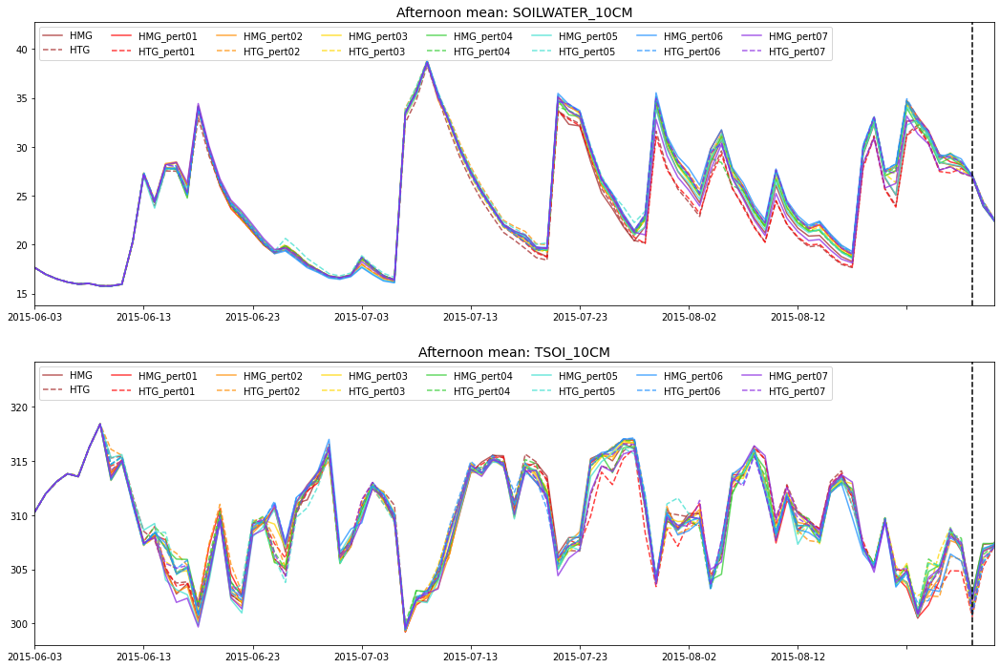

In [14]:
# Plot raw timeseries (based on afternoon mean values, so it's a bit more clear) 
plotVars = np.asarray(['SOILWATER_10CM','TSOI_10CM'])
nPlots = len(plotVars)

## Plot option for HMG/HTG lines 
pltTimeseries_HMG = True 
pltTimeseries_HTG = True 

fig,axs = plt.subplots(nPlots,1, figsize=(18,6*nPlots))
axs     = axs.ravel()

for iPlot in range(nPlots):
    
    real_var         = realSfcCLM_allCases[plotVars[iPlot]]
    ens_var          = ensCasesCLM[plotVars[iPlot]]
    iHours_real      = np.where( (real_var['time.hour']>=12) & (real_var['time.hour']<=18) )[0]
    real_var_selTime = real_var.isel(time=iHours_real)
    ens_var_selTime  = ens_var.isel(time=iHours_real)
    
    
    # For each date, get the mean value over the day
    real_var_dayMean = real_var_selTime.groupby('year_month_day').mean(dim='time')
    ens_var_dayMean  = ens_var_selTime.groupby('year_month_day').mean(dim='time')
    
    nDays = len(real_var_dayMean.year_month_day.values)
        
    ## Plot lines 
    if pltTimeseries_HMG: 
        axs[iPlot].plot(np.arange(nDays), 
                        np.squeeze(real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG')[0]).values), 
                        color='brown', linestyle='-', alpha=0.75, label='HMG')
    if pltTimeseries_HTG:
        axs[iPlot].plot(np.arange(nDays), 
                        np.squeeze(real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HTG')[0]).values), 
                        color='brown', linestyle='--', alpha=0.75, label='HTG')
        
    if pltTimeseries_HMG: 
        axs[iPlot].plot(np.arange(nDays), 
                        np.squeeze(real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert01')[0]).values), 
                        color='red', linestyle='-', alpha=0.75, label='HMG_pert01')
    if pltTimeseries_HTG: 
        axs[iPlot].plot(np.arange(nDays), 
                        np.squeeze(real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HTG_pert01')[0]).values), 
                        color='red', linestyle='--', alpha=0.75, label='HTG_pert01')
        
    if pltTimeseries_HMG: 
        axs[iPlot].plot(np.arange(nDays), 
                        np.squeeze(real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert02')[0]).values), 
                        color='darkorange', linestyle='-', alpha=0.75, label='HMG_pert02')
    if pltTimeseries_HTG: 
        axs[iPlot].plot(np.arange(nDays), 
                        np.squeeze(real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HTG_pert02')[0]).values), 
                        color='darkorange', linestyle='--', alpha=0.75, label='HTG_pert02')
        
    if pltTimeseries_HMG: 
        axs[iPlot].plot(np.arange(nDays), 
                        np.squeeze(real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert03')[0]).values), 
                        color='gold', linestyle='-', alpha=0.75, label='HMG_pert03')
    if pltTimeseries_HTG: 
        axs[iPlot].plot(np.arange(nDays), 
                        np.squeeze(real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HTG_pert03')[0]).values), 
                        color='gold', linestyle='--', alpha=0.75, label='HTG_pert03')

    if pltTimeseries_HMG: 
        axs[iPlot].plot(np.arange(nDays), 
                        np.squeeze(real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert04')[0]).values), 
                        color='limegreen', linestyle='-', alpha=0.75, label='HMG_pert04')
    if pltTimeseries_HTG: 
        axs[iPlot].plot(np.arange(nDays), 
                        np.squeeze(real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HTG_pert04')[0]).values), 
                        color='limegreen', linestyle='--', alpha=0.75, label='HTG_pert04')

    if pltTimeseries_HMG: 
        axs[iPlot].plot(np.arange(nDays), 
                        np.squeeze(real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert05')[0]).values), 
                        color='turquoise', linestyle='-', alpha=0.75, label='HMG_pert05')
    if pltTimeseries_HTG: 
        axs[iPlot].plot(np.arange(nDays), 
                        np.squeeze(real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HTG_pert05')[0]).values), 
                        color='turquoise', linestyle='--', alpha=0.75, label='HTG_pert05')

    if pltTimeseries_HMG: 
        axs[iPlot].plot(np.arange(nDays), 
                        np.squeeze(real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert06')[0]).values), 
                        color='dodgerblue', linestyle='-', alpha=0.75, label='HMG_pert06')
    if pltTimeseries_HTG: 
        axs[iPlot].plot(np.arange(nDays), 
                        np.squeeze(real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HTG_pert06')[0]).values), 
                        color='dodgerblue', linestyle='--', alpha=0.75, label='HTG_pert06')    

    if pltTimeseries_HMG: 
        axs[iPlot].plot(np.arange(nDays), 
                        np.squeeze(real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HMG_pert07')[0]).values), 
                        color='blueviolet', linestyle='-', alpha=0.75, label='HMG_pert07')
    if pltTimeseries_HTG: 
        axs[iPlot].plot(np.arange(nDays), 
                        np.squeeze(real_var_dayMean.isel(case=np.where(real_var_dayMean.case.values=='HTG_pert07')[0]).values), 
                        color='blueviolet', linestyle='--', alpha=0.75, label='HTG_pert07')
    
    ## Add separating lines for ease of looking at these 
    # axs[iPlot].axhline(0,color='k',linestyle='--')
    for iYr in range(len(yrStart)):
        axs[iPlot].axvline(yrStart[iYr], color='k',linestyle='--')
        
    axs[iPlot].legend(ncol=8)
    
    # Add labels
    # axs[iPlot].set_title('Afternoon mean Difference (HTG-HMG): '+plotVars[iPlot],fontsize=14)
    axs[iPlot].set_title('Afternoon mean: '+plotVars[iPlot],fontsize=14)

    ## Set a few axis limits as needed
    axs[iPlot].set_xlim([0,88])
    # axs[iPlot].set_ylim([-1500, 1500])
    
    # Control tick labels
    xTicks       = axs[iPlot].get_xticks()
    dates_xticks = strDates[xTicks.astype(int)[:-2]]
    axs[iPlot].set_xticklabels(dates_xticks)
    
    
    

In [31]:
# # Plot daily max...
# plotVars = np.asarray(['PBLH','PBLdepth'])
# nPlots = len(plotVars)

# fig,axs = plt.subplots(nPlots,1, figsize=(18,6*nPlots))
# axs     = axs.ravel()

# for iPlot in range(nPlots):
    
#     real_var         = realSfc_allCases[plotVars[iPlot]]
#     ens_var          = ensCases[plotVars[iPlot]]
#     # iHours_real      = np.where( (real_var['time.hour']>=12) & (real_var['time.hour']<=18) )[0]
#     # real_var_selTime = real_var.isel(time=iHours_real)
#     # ens_var_selTime  = ens_var.isel(time=iHours_real)
    
    
#     # For each date, get the mean value over the day
#     real_var_dayMean = real_var.groupby('year_month_day').max(dim='time')
#     ens_var_dayMean  = ens_var.groupby('year_month_day').max(dim='time')

#     diffEns   = ens_var_dayMean.isel(case=np.where(ens_var_dayMean.case.values=='HTGensMean')[0]).values-ens_var_dayMean.isel(case=np.where(ens_var_dayMean.case.values=='HMGensMean')[0]).values
    
#     ## Plot lines 
#     axs[iPlot].plot(np.arange(len(np.squeeze(diffEns))), np.squeeze(diffEns), 
#                     'red', label='HTGens-HMGens')
        

#     ## Add separating lines for ease of looking at these 
#     axs[iPlot].axhline(0,color='k',linestyle='--')
#     for iYr in range(len(yrStart)):
#         axs[iPlot].axvline(yrStart[iYr], color='k',linestyle='--')


#     # Plot markers for days that qualify as high/low changes
#     axs[iPlot].plot(np.arange(len(np.squeeze(diffEns)))[listHigh_real], np.squeeze(diffEns)[listHigh_real],'k^',markersize=9,alpha=0.6, label='HighDay')
#     axs[iPlot].plot(np.arange(len(np.squeeze(diffEns)))[listLow_real],  np.squeeze(diffEns)[listLow_real],'kv',markersize=9,alpha=0.6, label='LowDay')

#     axs[iPlot].legend(ncol=6)
#     axs[iPlot].axhline(0,color='grey',alpha=0.5)
    
#     # Add labels
#     axs[iPlot].set_title('Max Daily PBLH Difference (HTG-HMG): '+plotVars[iPlot],fontsize=14)

#     # Control tick labels
#     xTicks       = axs[iPlot].get_xticks()
#     dates_xticks = strDates[xTicks.astype(int)[:-2]]
#     axs[iPlot].set_xticklabels(dates_xticks)
    

In [101]:
# Get indices for all the other days too
allIndicies        = np.arange(0,len(strDates))
restOfIndices_real = list(set(allIndicies) - set(listHigh_real) - set(listLow_real))



In [102]:
## Get full arrays that match low/high percentiles that are consistent across surface definition 
#    ( so one set for real surface cases and one for the artificial surface cases )

# Real surface 
highPct_realSfc  = getTimes_basedOnDates(realSfc_allCases,     
                                         real_var_dayMean.isel(year_month_day=listHigh_real))
lowPct_realSfc   = getTimes_basedOnDates(realSfc_allCases,     
                                         real_var_dayMean.isel(year_month_day=listLow_real))


highPct_ensCases  = getTimes_basedOnDates(ensCases,     
                                         real_var_dayMean.isel(year_month_day=listHigh_real))
lowPct_ensCases  = getTimes_basedOnDates(ensCases,     
                                         real_var_dayMean.isel(year_month_day=listLow_real))

print('Done with real surface cases ')




Done with real surface cases 


In [103]:
highPct_ensHMG    = getTimes_basedOnDates(ensHMG,     
                                         real_var_dayMean.isel(year_month_day=listHigh_real))

highPct_ensHTG    = getTimes_basedOnDates(ensHTG,     
                                         real_var_dayMean.isel(year_month_day=listHigh_real))


lowPct_ensHMG     = getTimes_basedOnDates(ensHMG,     
                                         real_var_dayMean.isel(year_month_day=listLow_real))

lowPct_ensHTG     = getTimes_basedOnDates(ensHTG,     
                                         real_var_dayMean.isel(year_month_day=listLow_real))


In [104]:
## Get arrays with other % of days that don't fall into the category of the extremes 
restOfDays_realSfc          = getTimes_basedOnDates(realSfc_allCases,     
                                                    real_var_dayMean.isel(year_month_day=restOfIndices_real))

restOfDays_ensCases         = getTimes_basedOnDates(ensCases,     
                                                    real_var_dayMean.isel(year_month_day=restOfIndices_real))

print('Done getting datasets with rest of the days')



Done getting datasets with rest of the days


In [105]:
restOfDays_ensHMG           = getTimes_basedOnDates(ensHMG,     
                                                    real_var_dayMean.isel(year_month_day=restOfIndices_real))

restOfDays_ensHTG           = getTimes_basedOnDates(ensHTG,     
                                                    real_var_dayMean.isel(year_month_day=restOfIndices_real))



In [106]:
## Get hourly means in each category 
## - - - - - - - - - - - - - - - - - - 

hourlyMean_highPct_realSfc         = highPct_realSfc.groupby("time.hour").mean(dim="time")
hourlyMean_lowPct_realSfc          = lowPct_realSfc.groupby("time.hour").mean(dim="time")

hourlyMean_highPct_ensCases        = highPct_ensCases.groupby("time.hour").mean(dim="time")
hourlyMean_lowPct_ensCases         = lowPct_ensCases.groupby("time.hour").mean(dim="time")
print('Computed hourly means for all surfaces + cases')


hourlyStd_highPct_realSfc   = highPct_realSfc.groupby("time.hour").std(dim="time")
hourlyStd_lowPct_realSfc    = lowPct_realSfc.groupby("time.hour").std(dim="time")

hourlyStd_highPct_ensCases  = highPct_ensCases.groupby("time.hour").std(dim="time")
hourlyStd_lowPct_ensCases   = lowPct_ensCases.groupby("time.hour").std(dim="time")
print('Computed hourly std for all surfaces + cases')


## Get rest of days too
hourlyMean_restOfDays_realSfc     = restOfDays_realSfc.groupby("time.hour").mean(dim="time")
hourlyMean_restOfDays_ensCases    = restOfDays_ensCases.groupby("time.hour").mean(dim="time")
print('Computed means for rest of days')

hourlyStd_restOfDays_realSfc     = restOfDays_realSfc.groupby("time.hour").std(dim="time")
hourlyStd_restOfDays_ensCases    = restOfDays_ensCases.groupby("time.hour").std(dim="time")
print('Computed std for rest of days')



Computed hourly means for all surfaces + cases
Computed hourly std for all surfaces + cases
Computed means for rest of days
Computed std for rest of days


In [107]:
hourlyMean_highPct_ensHMG       = highPct_ensHMG.groupby("time.hour").mean(dim=["time","case"])
hourlyMean_highPct_ensHTG       = highPct_ensHTG.groupby("time.hour").mean(dim=["time","case"])

hourlyMean_lowPct_ensHMG        = lowPct_ensHMG.groupby("time.hour").mean(dim=["time","case"])
hourlyMean_lowPct_ensHTG        = lowPct_ensHTG.groupby("time.hour").mean(dim=["time","case"])

hourlyMean_restOfDays_ensHMG    = restOfDays_ensHMG.groupby("time.hour").mean(dim=["time","case"])
hourlyMean_restOfDays_ensHTG    = restOfDays_ensHTG.groupby("time.hour").mean(dim=["time","case"])
print('Computed HMG and HTG specific means')


hourlyStd_highPct_ensHMG        = highPct_ensHMG.groupby("time.hour").std(dim=["time","case"])
hourlyStd_highPct_ensHTG        = highPct_ensHTG.groupby("time.hour").std(dim=["time","case"])

hourlyStd_lowPct_ensHMG         = lowPct_ensHMG.groupby("time.hour").std(dim=["time","case"])
hourlyStd_lowPct_ensHTG         = lowPct_ensHTG.groupby("time.hour").std(dim=["time","case"])

hourlyStd_restOfDays_ensHMG     = restOfDays_ensHMG.groupby("time.hour").std(dim=["time","case"])
hourlyStd_restOfDays_ensHTG     = restOfDays_ensHTG.groupby("time.hour").std(dim=["time","case"])
print('Computed HMG and HTG specific std')



Computed HMG and HTG specific means
Computed HMG and HTG specific std


In [108]:
# Get number of obs going into those hourly means (for error bars)
nTimes_highPct_realSfc     = np.full([24], np.nan)
nTimes_lowPct_realSfc      = np.full([24], np.nan)
nTimes_restOfDays_realSfc  = np.full([24], np.nan)

for iHr in range(24): 
    nTimes_highPct_realSfc[iHr]    = len(np.where(highPct_realSfc["time.hour"]==iHr)[0])
    nTimes_lowPct_realSfc[iHr]     = len(np.where(lowPct_realSfc["time.hour"]==iHr)[0])
    nTimes_restOfDays_realSfc[iHr] = len(np.where(restOfDays_realSfc["time.hour"]==iHr)[0])
    
hourlyMean_highPct_realSfc['SampleCount']       = (('hour'), nTimes_highPct_realSfc)
hourlyMean_lowPct_realSfc['SampleCount']        = (('hour'), nTimes_lowPct_realSfc)
hourlyMean_restOfDays_realSfc['SampleCount']    = (('hour'), nTimes_restOfDays_realSfc)


hourlyMean_highPct_ensCases['SampleCount']       = (('hour'), nTimes_highPct_realSfc)
hourlyMean_lowPct_ensCases['SampleCount']        = (('hour'), nTimes_lowPct_realSfc)
hourlyMean_restOfDays_ensCases['SampleCount']    = (('hour'), nTimes_restOfDays_realSfc)


In [109]:
nTimes_highPct_ensHMG    = np.full([24], np.nan)
nTimes_lowPct_ensHMG     = np.full([24], np.nan)
nTimes_restOfDays_ensHMG = np.full([24], np.nan)

for iHr in range(24): 
    nTimes_highPct_ensHMG[iHr]    = len(np.where(highPct_ensHMG["time.hour"]==iHr)[0])*len(highPct_ensHMG['case'].values)
    nTimes_lowPct_ensHMG[iHr]     = len(np.where(lowPct_ensHMG["time.hour"]==iHr)[0])*len(lowPct_ensHMG['case'].values)
    nTimes_restOfDays_ensHMG[iHr] = len(np.where(restOfDays_realSfc["time.hour"]==iHr)[0])*len(restOfDays_realSfc['case'].values)
    
hourlyMean_highPct_ensHMG['SampleCount'] = (('hour'), nTimes_highPct_ensHMG)
hourlyMean_highPct_ensHTG['SampleCount'] = (('hour'), nTimes_highPct_ensHMG)

hourlyMean_lowPct_ensHMG['SampleCount'] = (('hour'), nTimes_lowPct_ensHMG)
hourlyMean_lowPct_ensHTG['SampleCount'] = (('hour'), nTimes_lowPct_ensHMG)

hourlyMean_restOfDays_ensHMG['SampleCount'] = (('hour'), nTimes_restOfDays_ensHMG)
hourlyMean_restOfDays_ensHTG['SampleCount'] = (('hour'), nTimes_restOfDays_ensHMG)


In [52]:
# def plotDiurnalCycle_sensDays(varSelPlot, levSel, yMax, yMin):
    
#     fig,axs = plt.subplots(1,3, figsize=(15,5))
#     axs     = axs.ravel()

#     # colorsList = np.asarray(['black','firebrick','darkorange','dodgerblue','mediumorchid'])
    
#     iCase_HMG = np.where(hourlyMean_highPct_realSfc.case.values=='HMG')[0]
#     iCase_HTG = np.where(hourlyMean_highPct_realSfc.case.values=='HTG')[0]
    
#     iCase_HTGpert01   = np.where(hourlyMean_highPct_realSfc.case.values=='HTG_pert01')[0]
#     iCase_HTGpert02   = np.where(hourlyMean_highPct_realSfc.case.values=='HTG_pert02')[0]
#     iCase_HTGpert03   = np.where(hourlyMean_highPct_realSfc.case.values=='HTG_pert03')[0]
#     iCase_HTGpert04   = np.where(hourlyMean_highPct_realSfc.case.values=='HTG_pert04')[0]

#     iCase_HMGpert01   = np.where(hourlyMean_highPct_realSfc.case.values=='HMG_pert01')[0]
#     iCase_HMGpert02   = np.where(hourlyMean_highPct_realSfc.case.values=='HMG_pert02')[0]
#     iCase_HMGpert03   = np.where(hourlyMean_highPct_realSfc.case.values=='HMG_pert03')[0]
#     iCase_HMGpert04   = np.where(hourlyMean_highPct_realSfc.case.values=='HMG_pert04')[0]

#     iCase_HMGens      = np.where(hourlyMean_highPct_ensCases.case.values=='HMGensMean')[0]
#     iCase_HTGens      = np.where(hourlyMean_highPct_ensCases.case.values=='HTGensMean')[0]

    
#     #  High Pct days
#     axs[0].errorbar(np.arange(24), 
#                     np.squeeze(hourlyMean_highPct_realSfc[varSelPlot].values[:,iCase_HMG,levSel]),
#                     yerr =2*np.squeeze(hourlyStd_highPct_realSfc[varSelPlot].values[:,iCase_HMG,levSel])/np.sqrt(hourlyMean_highPct_realSfc['SampleCount'].values),
#                     fmt='-',color='skyblue',capsize=3,label=hourlyMean_highPct_realSfc.case.values[iCase_HMG][0])
#     axs[0].errorbar(np.arange(24), 
#                     np.squeeze(hourlyMean_highPct_realSfc[varSelPlot].values[:,iCase_HMGpert01,levSel]),
#                     yerr =2*np.squeeze(hourlyStd_highPct_realSfc[varSelPlot].values[:,iCase_HMGpert01,levSel])/np.sqrt(hourlyMean_highPct_realSfc['SampleCount'].values),
#                     fmt='--',color='skyblue',alpha=0.5,capsize=3,label=hourlyMean_highPct_realSfc.case.values[iCase_HMGpert01][0])    
#     axs[0].errorbar(np.arange(24), 
#                     np.squeeze(hourlyMean_highPct_realSfc[varSelPlot].values[:,iCase_HMGpert02,levSel]),
#                     yerr =2*np.squeeze(hourlyStd_highPct_realSfc[varSelPlot].values[:,iCase_HMGpert02,levSel])/np.sqrt(hourlyMean_highPct_realSfc['SampleCount'].values),
#                     fmt='--',color='skyblue',alpha=0.5,capsize=3,label=None)    
#     axs[0].errorbar(np.arange(24), 
#                     np.squeeze(hourlyMean_highPct_realSfc[varSelPlot].values[:,iCase_HMGpert03,levSel]),
#                     yerr =2*np.squeeze(hourlyStd_highPct_realSfc[varSelPlot].values[:,iCase_HMGpert03,levSel])/np.sqrt(hourlyMean_highPct_realSfc['SampleCount'].values),
#                     fmt='--',color='skyblue',alpha=0.5,capsize=3,label=None)    
#     axs[0].errorbar(np.arange(24), 
#                     np.squeeze(hourlyMean_highPct_realSfc[varSelPlot].values[:,iCase_HMGpert04,levSel]),
#                     yerr =2*np.squeeze(hourlyStd_highPct_realSfc[varSelPlot].values[:,iCase_HMGpert04,levSel])/np.sqrt(hourlyMean_highPct_realSfc['SampleCount'].values),
#                     fmt='--',color='skyblue',alpha=0.5,capsize=3,label=None)    

#     axs[0].errorbar(np.arange(24), 
#                     np.squeeze(hourlyMean_highPct_realSfc[varSelPlot].values[:,iCase_HTG,levSel]),
#                     yerr =2*np.squeeze(hourlyStd_highPct_realSfc[varSelPlot].values[:,iCase_HTG,levSel])/np.sqrt(hourlyMean_highPct_realSfc['SampleCount'].values),
#                     fmt='-',color='coral',capsize=3,label=hourlyMean_highPct_realSfc.case.values[iCase_HTG][0])
#     axs[0].errorbar(np.arange(24), 
#                     np.squeeze(hourlyMean_highPct_realSfc[varSelPlot].values[:,iCase_HTGpert01,levSel]),
#                     yerr =2*np.squeeze(hourlyStd_highPct_realSfc[varSelPlot].values[:,iCase_HTGpert01,levSel])/np.sqrt(hourlyMean_highPct_realSfc['SampleCount'].values),
#                     fmt='--',color='coral',alpha=0.5,capsize=3,label=hourlyMean_highPct_realSfc.case.values[iCase_HTGpert01][0])    
#     axs[0].errorbar(np.arange(24), 
#                     np.squeeze(hourlyMean_highPct_realSfc[varSelPlot].values[:,iCase_HTGpert02,levSel]),
#                     yerr =2*np.squeeze(hourlyStd_highPct_realSfc[varSelPlot].values[:,iCase_HTGpert02,levSel])/np.sqrt(hourlyMean_highPct_realSfc['SampleCount'].values),
#                     fmt='--',color='coral',alpha=0.5,capsize=3,label=None)    
#     axs[0].errorbar(np.arange(24), 
#                     np.squeeze(hourlyMean_highPct_realSfc[varSelPlot].values[:,iCase_HTGpert03,levSel]),
#                     yerr =2*np.squeeze(hourlyStd_highPct_realSfc[varSelPlot].values[:,iCase_HTGpert03,levSel])/np.sqrt(hourlyMean_highPct_realSfc['SampleCount'].values),
#                     fmt='--',color='coral',alpha=0.5,capsize=3,label=None)    
#     axs[0].errorbar(np.arange(24), 
#                     np.squeeze(hourlyMean_highPct_realSfc[varSelPlot].values[:,iCase_HTGpert04,levSel]),
#                     yerr =2*np.squeeze(hourlyStd_highPct_realSfc[varSelPlot].values[:,iCase_HTGpert04,levSel])/np.sqrt(hourlyMean_highPct_realSfc['SampleCount'].values),
#                     fmt='--',color='coral',alpha=0.5,capsize=3,label=None)    

#     axs[0].errorbar(np.arange(24), 
#                     np.squeeze(hourlyMean_highPct_ensCases[varSelPlot].values[:,iCase_HMGens,levSel]),
#                     yerr =2*np.squeeze(hourlyStd_highPct_ensCases[varSelPlot].values[:,iCase_HMGens,levSel])/np.sqrt(hourlyMean_highPct_ensCases['SampleCount'].values),
#                     fmt='-',color='dodgerblue',linewidth=3,capsize=3,label=hourlyMean_highPct_ensCases.case.values[iCase_HMGens][0])
#     axs[0].errorbar(np.arange(24), 
#                     np.squeeze(hourlyMean_highPct_ensCases[varSelPlot].values[:,iCase_HTGens,levSel]),
#                     yerr =2*np.squeeze(hourlyStd_highPct_ensCases[varSelPlot].values[:,iCase_HTGens,levSel])/np.sqrt(hourlyMean_highPct_ensCases['SampleCount'].values),
#                     fmt='-',color='firebrick',linewidth=3,capsize=3,label=hourlyMean_highPct_ensCases.case.values[iCase_HTGens][0])

#     axs[0].legend(fontsize=8)


#     #  Low Pct days
#     axs[1].errorbar(np.arange(24), 
#                     np.squeeze(hourlyMean_lowPct_realSfc[varSelPlot].values[:,iCase_HMG,levSel]),
#                     yerr =2*np.squeeze(hourlyStd_lowPct_realSfc[varSelPlot].values[:,iCase_HMG,levSel])/np.sqrt(hourlyMean_lowPct_realSfc['SampleCount'].values),
#                     fmt='-',color='skyblue',capsize=3,label=hourlyMean_lowPct_realSfc.case.values[iCase_HMG][0])
#     axs[1].errorbar(np.arange(24), 
#                     np.squeeze(hourlyMean_lowPct_realSfc[varSelPlot].values[:,iCase_HMGpert01,levSel]),
#                     yerr =2*np.squeeze(hourlyStd_lowPct_realSfc[varSelPlot].values[:,iCase_HMGpert01,levSel])/np.sqrt(hourlyMean_lowPct_realSfc['SampleCount'].values),
#                     fmt='--',color='skyblue',alpha=0.5,capsize=3,label=hourlyMean_lowPct_realSfc.case.values[iCase_HMGpert01][0])    
#     axs[1].errorbar(np.arange(24), 
#                     np.squeeze(hourlyMean_lowPct_realSfc[varSelPlot].values[:,iCase_HMGpert02,levSel]),
#                     yerr =2*np.squeeze(hourlyStd_lowPct_realSfc[varSelPlot].values[:,iCase_HMGpert02,levSel])/np.sqrt(hourlyMean_lowPct_realSfc['SampleCount'].values),
#                     fmt='--',color='skyblue',alpha=0.5,capsize=3,label=None)    
#     axs[1].errorbar(np.arange(24), 
#                     np.squeeze(hourlyMean_lowPct_realSfc[varSelPlot].values[:,iCase_HMGpert03,levSel]),
#                     yerr =2*np.squeeze(hourlyStd_lowPct_realSfc[varSelPlot].values[:,iCase_HMGpert03,levSel])/np.sqrt(hourlyMean_lowPct_realSfc['SampleCount'].values),
#                     fmt='--',color='skyblue',alpha=0.5,capsize=3,label=None)    
#     axs[1].errorbar(np.arange(24), 
#                     np.squeeze(hourlyMean_lowPct_realSfc[varSelPlot].values[:,iCase_HMGpert04,levSel]),
#                     yerr =2*np.squeeze(hourlyStd_lowPct_realSfc[varSelPlot].values[:,iCase_HMGpert04,levSel])/np.sqrt(hourlyMean_lowPct_realSfc['SampleCount'].values),
#                     fmt='--',color='skyblue',alpha=0.5,capsize=3,label=None)    

#     axs[1].errorbar(np.arange(24), 
#                     np.squeeze(hourlyMean_lowPct_realSfc[varSelPlot].values[:,iCase_HTG,levSel]),
#                     yerr =2*np.squeeze(hourlyStd_lowPct_realSfc[varSelPlot].values[:,iCase_HTG,levSel])/np.sqrt(hourlyMean_lowPct_realSfc['SampleCount'].values),
#                     fmt='-',color='coral',capsize=3,label=hourlyMean_lowPct_realSfc.case.values[iCase_HTG][0])
#     axs[1].errorbar(np.arange(24), 
#                     np.squeeze(hourlyMean_lowPct_realSfc[varSelPlot].values[:,iCase_HTGpert01,levSel]),
#                     yerr =2*np.squeeze(hourlyStd_lowPct_realSfc[varSelPlot].values[:,iCase_HTGpert01,levSel])/np.sqrt(hourlyMean_lowPct_realSfc['SampleCount'].values),
#                     fmt='--',color='coral',alpha=0.5,capsize=3,label=hourlyMean_lowPct_realSfc.case.values[iCase_HTGpert01][0])    
#     axs[1].errorbar(np.arange(24), 
#                     np.squeeze(hourlyMean_lowPct_realSfc[varSelPlot].values[:,iCase_HTGpert02,levSel]),
#                     yerr =2*np.squeeze(hourlyStd_lowPct_realSfc[varSelPlot].values[:,iCase_HTGpert02,levSel])/np.sqrt(hourlyMean_lowPct_realSfc['SampleCount'].values),
#                     fmt='--',color='coral',alpha=0.5,capsize=3,label=None)    
#     axs[1].errorbar(np.arange(24), 
#                     np.squeeze(hourlyMean_lowPct_realSfc[varSelPlot].values[:,iCase_HTGpert03,levSel]),
#                     yerr =2*np.squeeze(hourlyStd_lowPct_realSfc[varSelPlot].values[:,iCase_HTGpert03,levSel])/np.sqrt(hourlyMean_lowPct_realSfc['SampleCount'].values),
#                     fmt='--',color='coral',alpha=0.5,capsize=3,label=None)    
#     axs[1].errorbar(np.arange(24), 
#                     np.squeeze(hourlyMean_lowPct_realSfc[varSelPlot].values[:,iCase_HTGpert04,levSel]),
#                     yerr =2*np.squeeze(hourlyStd_lowPct_realSfc[varSelPlot].values[:,iCase_HTGpert04,levSel])/np.sqrt(hourlyMean_lowPct_realSfc['SampleCount'].values),
#                     fmt='--',color='coral',alpha=0.5,capsize=3,label=None)    

#     axs[1].errorbar(np.arange(24), 
#                     np.squeeze(hourlyMean_lowPct_ensCases[varSelPlot].values[:,iCase_HMGens,levSel]),
#                     yerr =2*np.squeeze(hourlyStd_lowPct_ensCases[varSelPlot].values[:,iCase_HMGens,levSel])/np.sqrt(hourlyMean_lowPct_ensCases['SampleCount'].values),
#                     fmt='-',color='dodgerblue',linewidth=3,capsize=3,label=hourlyMean_lowPct_ensCases.case.values[iCase_HMGens][0])
#     axs[1].errorbar(np.arange(24), 
#                     np.squeeze(hourlyMean_lowPct_ensCases[varSelPlot].values[:,iCase_HTGens,levSel]),
#                     yerr =2*np.squeeze(hourlyStd_lowPct_ensCases[varSelPlot].values[:,iCase_HTGens,levSel])/np.sqrt(hourlyMean_lowPct_ensCases['SampleCount'].values),
#                     fmt='-',color='firebrick',linewidth=3,capsize=3,label=hourlyMean_lowPct_ensCases.case.values[iCase_HTGens][0])


#     #  Rest of days 
#     axs[2].errorbar(np.arange(24), 
#                     np.squeeze(hourlyMean_restOfDays_realSfc[varSelPlot].values[:,iCase_HMG,levSel]),
#                     yerr =2*np.squeeze(hourlyStd_restOfDays_realSfc[varSelPlot].values[:,iCase_HMG,levSel])/np.sqrt(hourlyMean_restOfDays_realSfc['SampleCount'].values),
#                     fmt='-',color='skyblue',capsize=3,label=hourlyMean_restOfDays_realSfc.case.values[iCase_HMG][0])
#     axs[2].errorbar(np.arange(24), 
#                     np.squeeze(hourlyMean_restOfDays_realSfc[varSelPlot].values[:,iCase_HMGpert01,levSel]),
#                     yerr =2*np.squeeze(hourlyStd_restOfDays_realSfc[varSelPlot].values[:,iCase_HMGpert01,levSel])/np.sqrt(hourlyMean_restOfDays_realSfc['SampleCount'].values),
#                     fmt='--',color='skyblue',alpha=0.5,capsize=3,label=hourlyMean_restOfDays_realSfc.case.values[iCase_HMGpert01][0])    
#     axs[2].errorbar(np.arange(24), 
#                     np.squeeze(hourlyMean_restOfDays_realSfc[varSelPlot].values[:,iCase_HMGpert02,levSel]),
#                     yerr =2*np.squeeze(hourlyStd_restOfDays_realSfc[varSelPlot].values[:,iCase_HMGpert02,levSel])/np.sqrt(hourlyMean_restOfDays_realSfc['SampleCount'].values),
#                     fmt='--',color='skyblue',alpha=0.5,capsize=3,label=hourlyMean_restOfDays_realSfc.case.values[iCase_HMGpert02][0])    
#     axs[2].errorbar(np.arange(24), 
#                     np.squeeze(hourlyMean_restOfDays_realSfc[varSelPlot].values[:,iCase_HMGpert03,levSel]),
#                     yerr =2*np.squeeze(hourlyStd_restOfDays_realSfc[varSelPlot].values[:,iCase_HMGpert03,levSel])/np.sqrt(hourlyMean_restOfDays_realSfc['SampleCount'].values),
#                     fmt='--',color='skyblue',alpha=0.5,capsize=3,label=hourlyMean_restOfDays_realSfc.case.values[iCase_HMGpert03][0])    
#     axs[2].errorbar(np.arange(24), 
#                     np.squeeze(hourlyMean_restOfDays_realSfc[varSelPlot].values[:,iCase_HMGpert04,levSel]),
#                     yerr =2*np.squeeze(hourlyStd_restOfDays_realSfc[varSelPlot].values[:,iCase_HMGpert04,levSel])/np.sqrt(hourlyMean_restOfDays_realSfc['SampleCount'].values),
#                     fmt='--',color='skyblue',alpha=0.5,capsize=3,label=hourlyMean_restOfDays_realSfc.case.values[iCase_HMGpert04][0])    

#     axs[2].errorbar(np.arange(24), 
#                     np.squeeze(hourlyMean_restOfDays_realSfc[varSelPlot].values[:,iCase_HTG,levSel]),
#                     yerr =2*np.squeeze(hourlyStd_restOfDays_realSfc[varSelPlot].values[:,iCase_HTG,levSel])/np.sqrt(hourlyMean_restOfDays_realSfc['SampleCount'].values),
#                     fmt='-',color='coral',capsize=3,label=hourlyMean_restOfDays_realSfc.case.values[iCase_HTG][0])
#     axs[2].errorbar(np.arange(24), 
#                     np.squeeze(hourlyMean_restOfDays_realSfc[varSelPlot].values[:,iCase_HTGpert01,levSel]),
#                     yerr =2*np.squeeze(hourlyStd_restOfDays_realSfc[varSelPlot].values[:,iCase_HTGpert01,levSel])/np.sqrt(hourlyMean_restOfDays_realSfc['SampleCount'].values),
#                     fmt='--',color='coral',alpha=0.5,capsize=3,label=hourlyMean_restOfDays_realSfc.case.values[iCase_HTGpert01][0])    
#     axs[2].errorbar(np.arange(24), 
#                     np.squeeze(hourlyMean_restOfDays_realSfc[varSelPlot].values[:,iCase_HTGpert02,levSel]),
#                     yerr =2*np.squeeze(hourlyStd_restOfDays_realSfc[varSelPlot].values[:,iCase_HTGpert02,levSel])/np.sqrt(hourlyMean_restOfDays_realSfc['SampleCount'].values),
#                     fmt='--',color='coral',alpha=0.5,capsize=3,label=hourlyMean_restOfDays_realSfc.case.values[iCase_HTGpert02][0])    
#     axs[2].errorbar(np.arange(24), 
#                     np.squeeze(hourlyMean_restOfDays_realSfc[varSelPlot].values[:,iCase_HTGpert03,levSel]),
#                     yerr =2*np.squeeze(hourlyStd_restOfDays_realSfc[varSelPlot].values[:,iCase_HTGpert03,levSel])/np.sqrt(hourlyMean_restOfDays_realSfc['SampleCount'].values),
#                     fmt='--',color='coral',alpha=0.5,capsize=3,label=hourlyMean_restOfDays_realSfc.case.values[iCase_HTGpert03][0])    
#     axs[2].errorbar(np.arange(24), 
#                     np.squeeze(hourlyMean_restOfDays_realSfc[varSelPlot].values[:,iCase_HTGpert04,levSel]),
#                     yerr =2*np.squeeze(hourlyStd_restOfDays_realSfc[varSelPlot].values[:,iCase_HTGpert04,levSel])/np.sqrt(hourlyMean_restOfDays_realSfc['SampleCount'].values),
#                     fmt='--',color='coral',alpha=0.5,capsize=3,label=hourlyMean_restOfDays_realSfc.case.values[iCase_HTGpert04][0])    

#     axs[2].errorbar(np.arange(24), 
#                     np.squeeze(hourlyMean_restOfDays_ensCases[varSelPlot].values[:,iCase_HMGens,levSel]),
#                     yerr =2*np.squeeze(hourlyStd_lowPct_ensCases[varSelPlot].values[:,iCase_HMGens,levSel])/np.sqrt(hourlyMean_restOfDays_ensCases['SampleCount'].values),
#                     fmt='-',color='dodgerblue',linewidth=3,capsize=3,label=hourlyMean_restOfDays_ensCases.case.values[iCase_HMGens][0])
#     axs[2].errorbar(np.arange(24), 
#                     np.squeeze(hourlyMean_restOfDays_ensCases[varSelPlot].values[:,iCase_HTGens,levSel]),
#                     yerr =2*np.squeeze(hourlyStd_lowPct_ensCases[varSelPlot].values[:,iCase_HTGens,levSel])/np.sqrt(hourlyMean_restOfDays_ensCases['SampleCount'].values),
#                     fmt='-',color='firebrick',linewidth=3,capsize=3,label=hourlyMean_restOfDays_ensCases.case.values[iCase_HTGens][0])


    
    
    
#     # Set labels
#     # axs[0].set_title(varSelPlot+'\n High percentiles of '+varSel+' (realSfc)', fontsize=14)
#     axs[0].set_title(varSelPlot+'\n Large increases in '+varSel, fontsize=16)
#     axs[1].set_title('Large decreases in '+varSel, fontsize=16)
#     axs[2].set_title('Remaining days ', fontsize=16)
 
#     if hasattr(realSfc_allCases[varSelPlot], 'units'):
#         axs[0].set_ylabel(realSfc_allCases[varSelPlot].units, fontsize=12)
        
#     axs[0].set_xlabel('Local Hour', fontsize=12)
#     axs[1].set_xlabel('Local Hour', fontsize=12)
#     axs[2].set_xlabel('Local Hour', fontsize=12)

#     axs[0].tick_params(axis='both', labelsize= 12)
#     axs[1].tick_params(axis='both', labelsize= 12)
#     axs[2].tick_params(axis='both', labelsize= 12)

#     # Set axis ranges if desired
#     axs[0].set_ylim([yMin, yMax])
#     axs[1].set_ylim([yMin, yMax])
#     axs[2].set_ylim([yMin, yMax])
    
#     return axs 

In [53]:
# plotDiurnalCycle_sensDays('PBLH', None, 2600, 0)

### Use ens means/std 

In [91]:
def plotDiurnalCycle_sensDays_ens(varSelPlot, levSel, yMax, yMin):
    
    fig,axs = plt.subplots(1,3, figsize=(15,5))
    axs     = axs.ravel()
    
    # CIlevel = 1.960   ## 95% CI
    CIlevel = 1.645   ## 90% CI


    # Real surface 
    axs[0].errorbar(np.arange(24), 
                    np.squeeze(hourlyMean_highPct_ensHMG[varSelPlot].values[:,levSel]),
                    yerr =CIlevel*np.squeeze(hourlyStd_highPct_ensHMG[varSelPlot].values[:,levSel])/np.sqrt(hourlyMean_highPct_ensHMG['SampleCount'].values),
                    fmt='-',color='lightseagreen',capsize=3,label='HMG_ens')
    axs[0].errorbar(np.arange(24), 
                    np.squeeze(hourlyMean_highPct_ensHTG[varSelPlot].values[:,levSel]),
                    yerr =CIlevel*np.squeeze(hourlyStd_highPct_ensHTG[varSelPlot].values[:,levSel])/np.sqrt(hourlyMean_highPct_ensHTG['SampleCount'].values),
                    fmt='-',color='red',capsize=3,label='HTG_ens')
    axs[0].legend(fontsize=12)



    axs[1].errorbar(np.arange(24), 
                    np.squeeze(hourlyMean_lowPct_ensHMG[varSelPlot].values[:,levSel]),
                    yerr =CIlevel*np.squeeze(hourlyStd_lowPct_ensHMG[varSelPlot].values[:,levSel])/np.sqrt(hourlyMean_lowPct_ensHMG['SampleCount'].values),
                    fmt='-',color='lightseagreen',capsize=3)
    axs[1].errorbar(np.arange(24), 
                    np.squeeze(hourlyMean_lowPct_ensHTG[varSelPlot].values[:,levSel]),
                    yerr =CIlevel*np.squeeze(hourlyStd_lowPct_ensHTG[varSelPlot].values[:,levSel])/np.sqrt(hourlyMean_lowPct_ensHTG['SampleCount'].values),
                    fmt='-',color='red',capsize=3)


    axs[2].errorbar(np.arange(24), 
                    np.squeeze(hourlyMean_restOfDays_ensHMG[varSelPlot].values[:,levSel]),
                    yerr =CIlevel*np.squeeze(hourlyStd_restOfDays_ensHMG[varSelPlot].values[:,levSel])/np.sqrt(hourlyMean_restOfDays_ensHMG['SampleCount'].values),
                    color='lightseagreen',capsize=3)
    axs[2].errorbar(np.arange(24), 
                    np.squeeze(hourlyMean_restOfDays_ensHTG[varSelPlot].values[:,levSel]),
                    yerr =CIlevel*np.squeeze(hourlyStd_restOfDays_ensHTG[varSelPlot].values[:,levSel])/np.sqrt(hourlyMean_restOfDays_ensHTG['SampleCount'].values),
                    color='red',capsize=3)



    # Set labels
    # axs[0].set_title(varSelPlot+'\n High percentiles of '+varSel+' (realSfc)', fontsize=14)
    axs[0].set_title(varSelPlot+'\n Large increases in '+varSel, fontsize=16)
    axs[1].set_title('Large decreases in '+varSel, fontsize=16)
    axs[2].set_title('Remaining days ', fontsize=16)
 
    if hasattr(realSfc_allCases[varSelPlot], 'units'):
        axs[0].set_ylabel(realSfc_allCases[varSelPlot].units, fontsize=12)
        
    axs[0].set_xlabel('Local Hour', fontsize=12)
    axs[1].set_xlabel('Local Hour', fontsize=12)
    axs[2].set_xlabel('Local Hour', fontsize=12)

    axs[0].tick_params(axis='both', labelsize= 12)
    axs[1].tick_params(axis='both', labelsize= 12)
    axs[2].tick_params(axis='both', labelsize= 12)

    # Set axis ranges if desired
    axs[0].set_ylim([yMin, yMax])
    axs[1].set_ylim([yMin, yMax])
    axs[2].set_ylim([yMin, yMax])
    
    return axs 

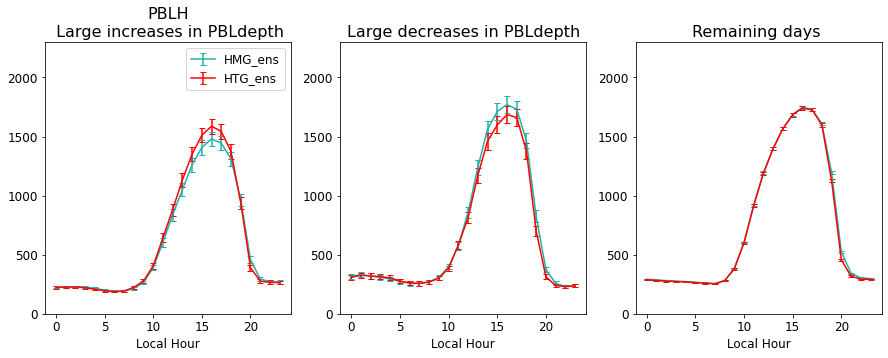

In [110]:
p1 = plotDiurnalCycle_sensDays_ens('PBLH', None, 2300, 0)


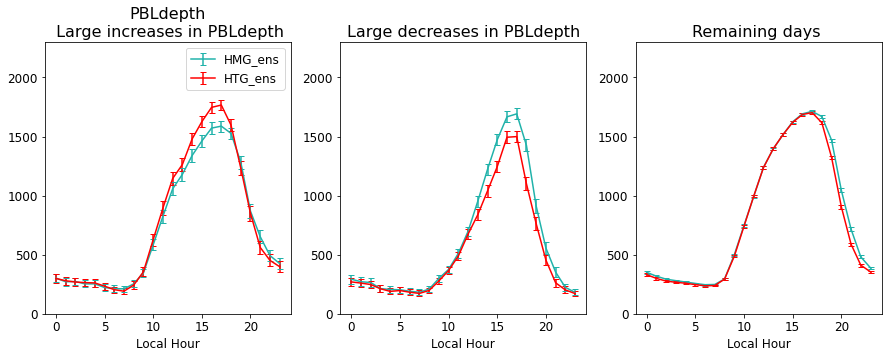

In [111]:
p2 = plotDiurnalCycle_sensDays_ens('PBLdepth', None, 2300, 0)


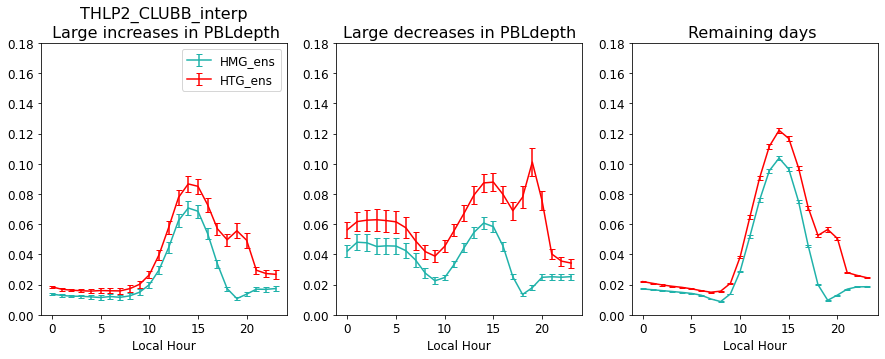

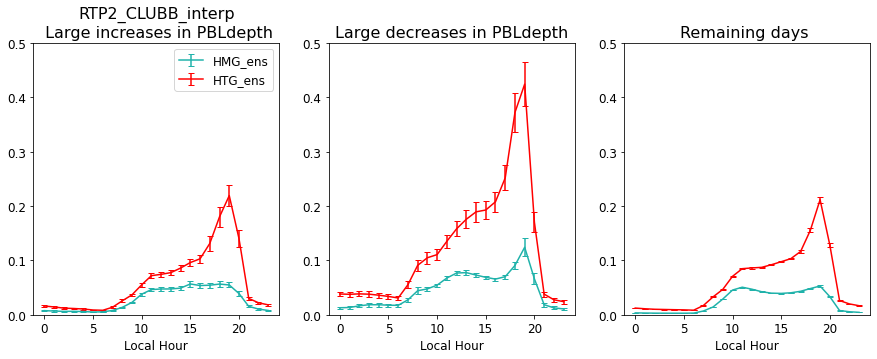

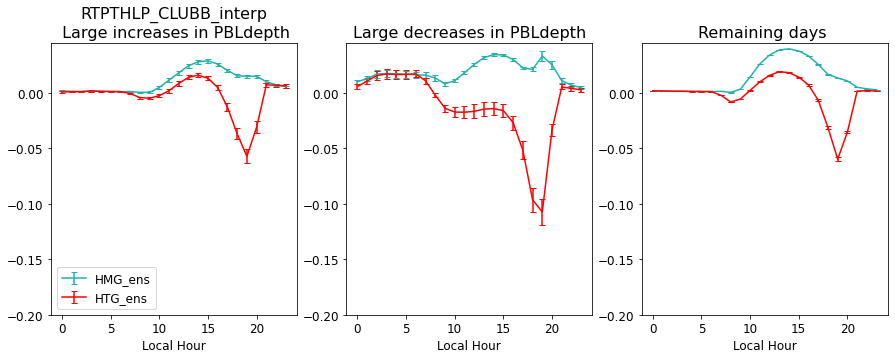

In [112]:
p1 = plotDiurnalCycle_sensDays_ens('THLP2_CLUBB_interp',   -1, 0.18,   0.00)   #level, yMax, yMin are last three inputs
p2 = plotDiurnalCycle_sensDays_ens('RTP2_CLUBB_interp',    -1, 0.5,    0.00)
p3 = plotDiurnalCycle_sensDays_ens('RTPTHLP_CLUBB_interp', -1, 0.045, -0.2)



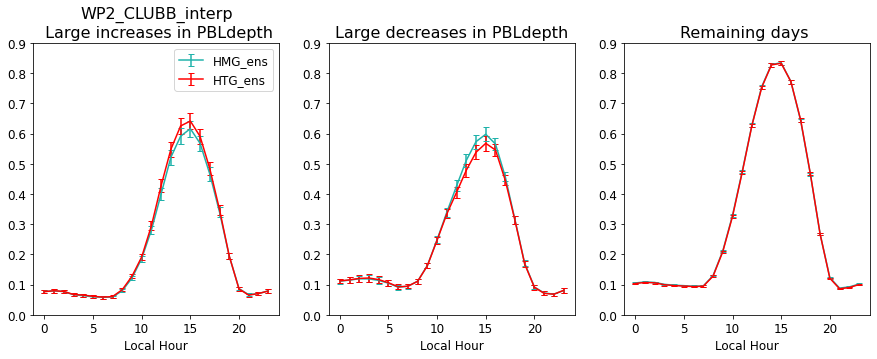

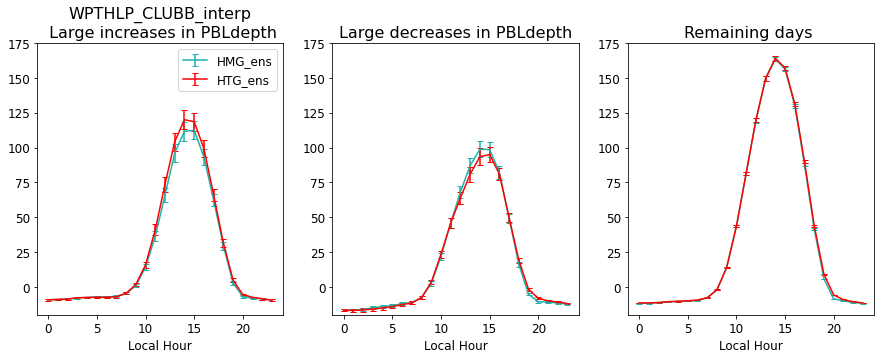

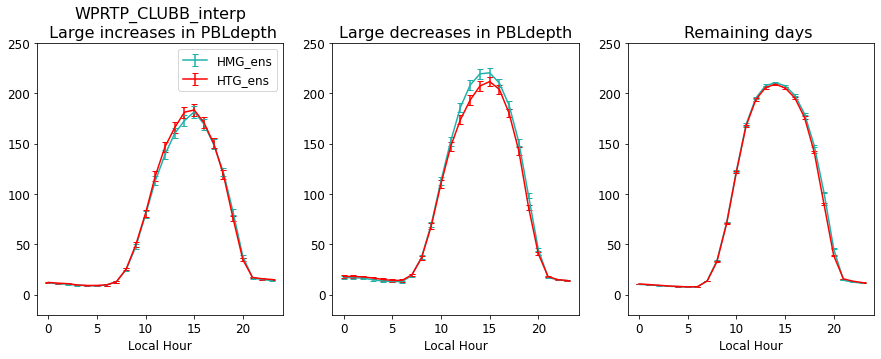

In [113]:
p1=plotDiurnalCycle_sensDays_ens('WP2_CLUBB_interp',    -1, 0.9, 0.0)   #level, yMax, yMin are last three inputs
p2=plotDiurnalCycle_sensDays_ens('WPTHLP_CLUBB_interp', -1, 175, -20)
p3=plotDiurnalCycle_sensDays_ens('WPRTP_CLUBB_interp', -1, 250, -20)


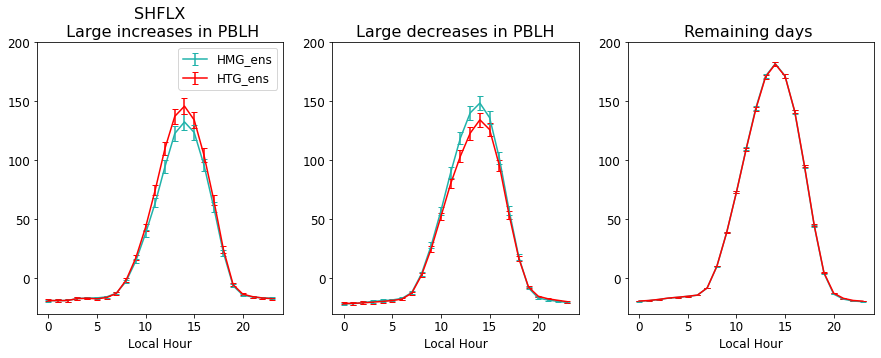

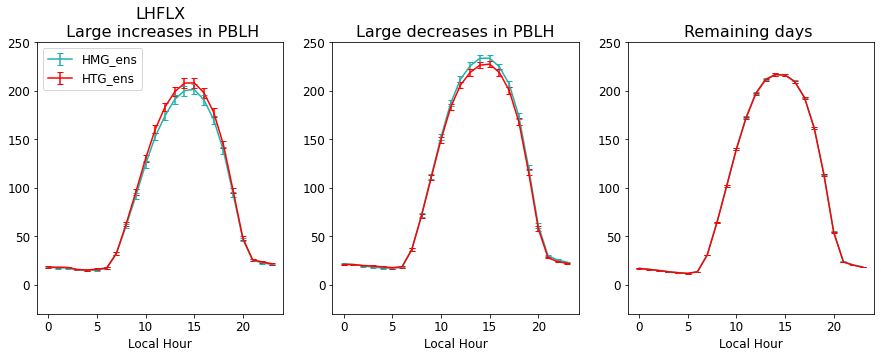

In [67]:
p1 = plotDiurnalCycle_sensDays_ens('SHFLX', None, 200, -30)
p2 = plotDiurnalCycle_sensDays_ens('LHFLX', None, 250, -30)


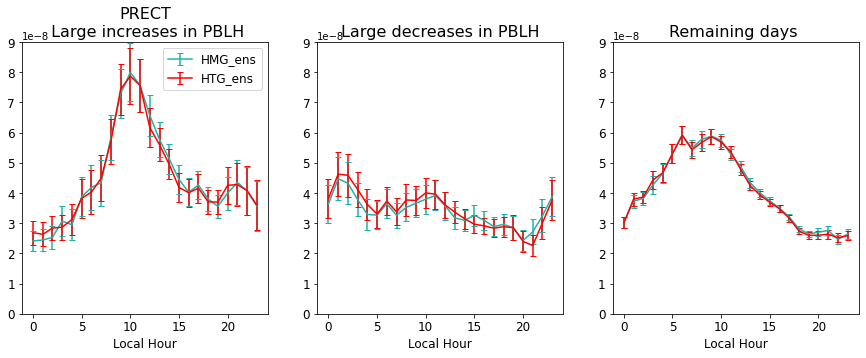

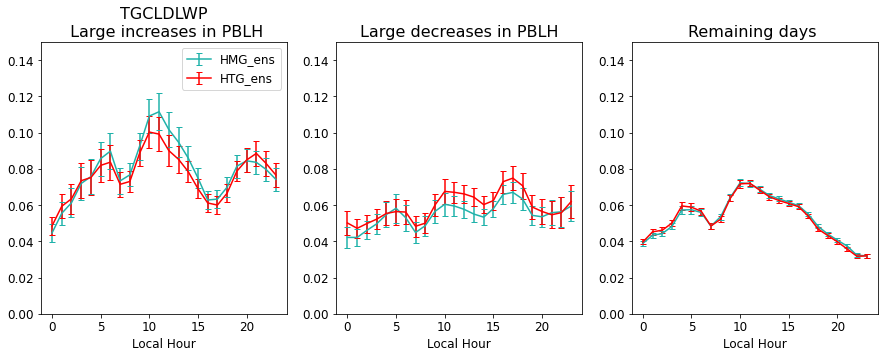

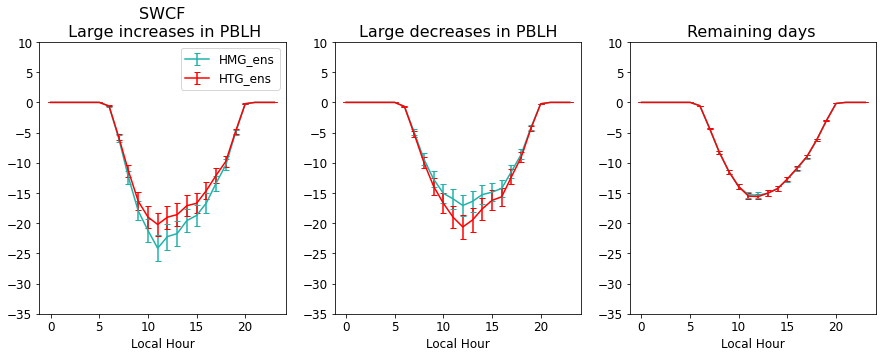

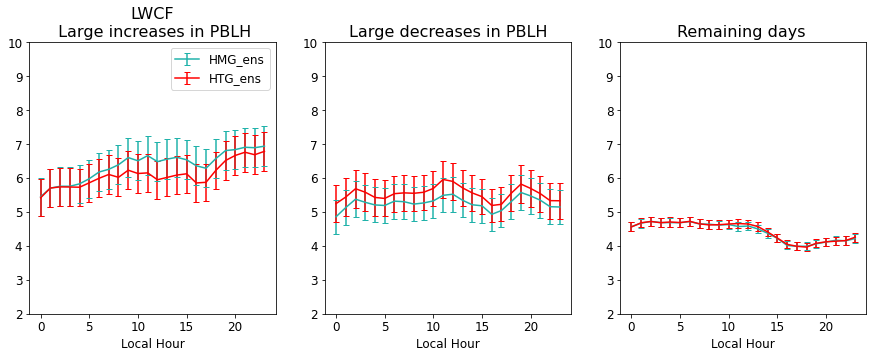

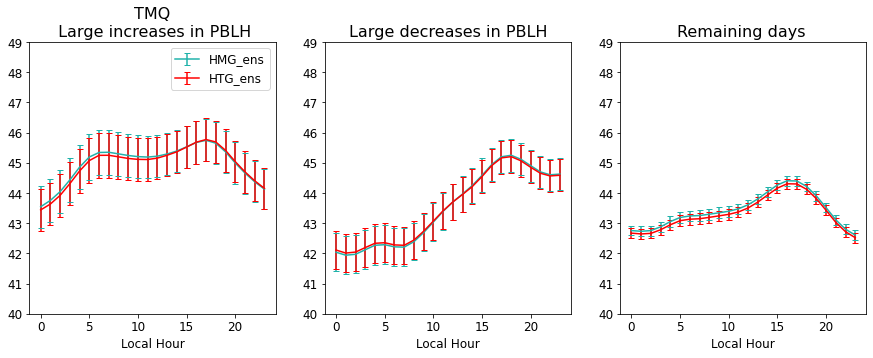

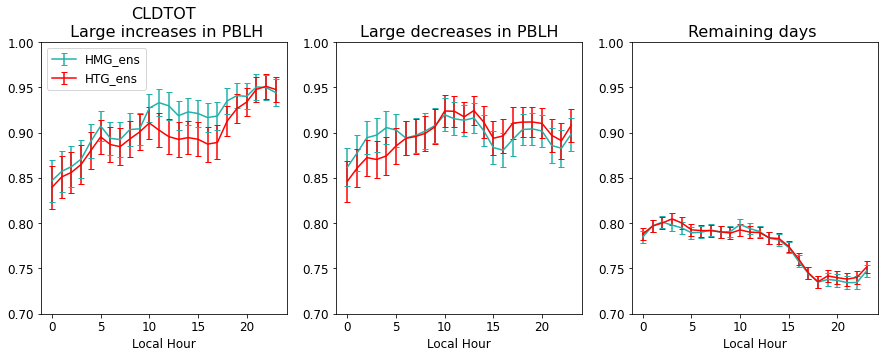

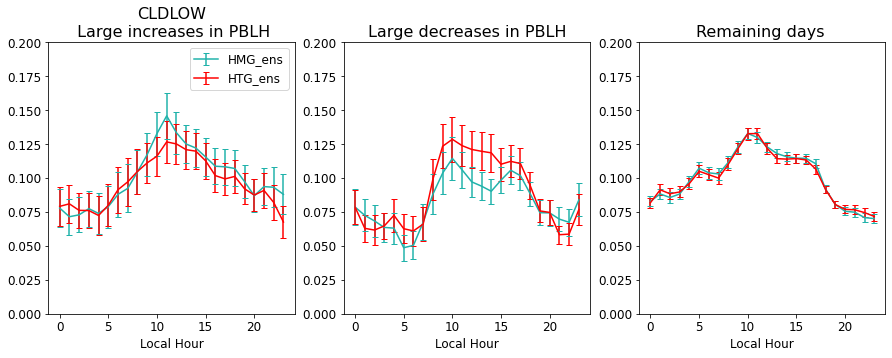

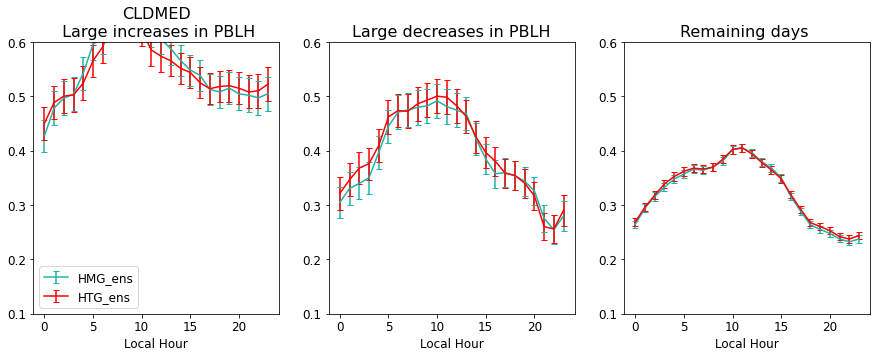

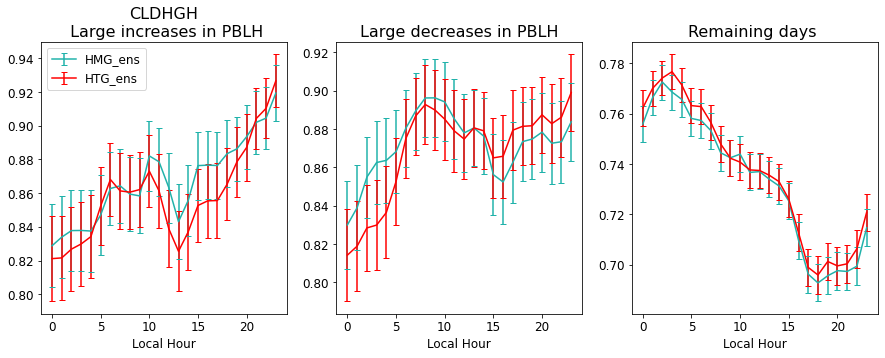

In [68]:
p0=plotDiurnalCycle_sensDays_ens('PRECT', None, 9e-8, 0)

p1=plotDiurnalCycle_sensDays_ens('TGCLDLWP', None, 0.15, 0)
p2=plotDiurnalCycle_sensDays_ens('SWCF', None, 10, -35)
p3=plotDiurnalCycle_sensDays_ens('LWCF', None, 10, 2)
p4=plotDiurnalCycle_sensDays_ens('TMQ',  None, 49, 40)

p5 = plotDiurnalCycle_sensDays_ens('CLDTOT', None, 1.0, 0.7)
p6 = plotDiurnalCycle_sensDays_ens('CLDLOW', None, 0.2, 0)
p7 = plotDiurnalCycle_sensDays_ens('CLDMED', None, 0.6, 0.1)
p8 = plotDiurnalCycle_sensDays_ens('CLDHGH', None, None, None)


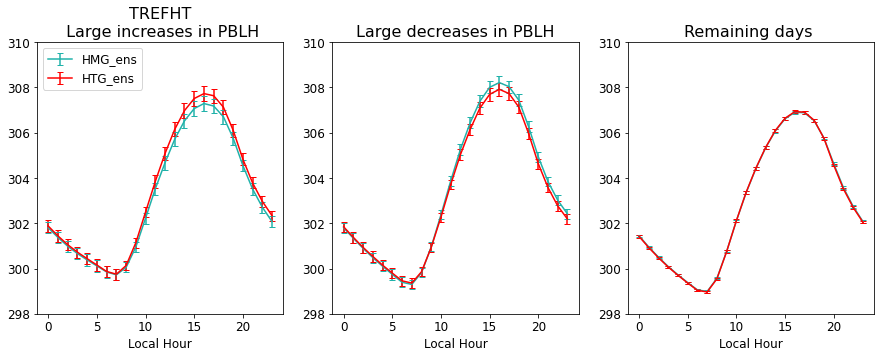

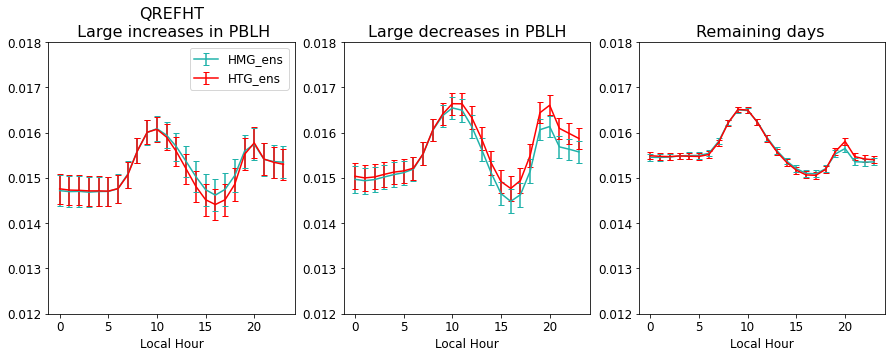

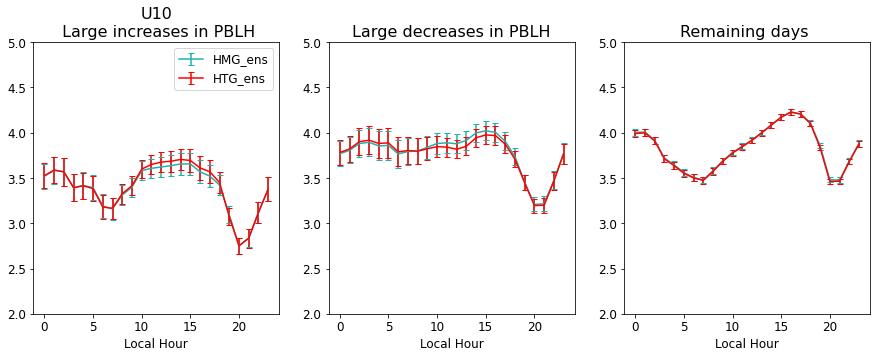

In [69]:
p1=plotDiurnalCycle_sensDays_ens('TREFHT', None, 310, 298)
p2=plotDiurnalCycle_sensDays_ens('QREFHT', None, 0.018, 0.012)
p3=plotDiurnalCycle_sensDays_ens('U10', None, 5, 2)


## Looking in the vertical as well...

In [70]:
## Belated realization that the heights computed are above *sea level* not above ground level. 
#    Need to subtract elevation. 
nateFile = '/glade/work/mdfowler/CLASP/clasp-htg.bdate.nc'
nateDS = xr.open_dataset(nateFile, decode_times=True)

## Convert to local time too 
nateDS_local       = nateDS.copy(deep=True)

# Confirmed that all the times are identical, so using the same local time arrays
localTimes = nateDS_local['time'].values - np.timedelta64(5,'h')

# Replace time dimension with local time
nateDS_local = nateDS_local.assign_coords({"time": localTimes})

# Also round to nearest hour, since some are a few minutes before/after minute 00: 
nateDS_HTG_roundHrs = nateDS_local['time'].dt.round("H")
nateDS_local        = nateDS_local.assign_coords({"time": nateDS_HTG_roundHrs})

# Add month_day index
month_day_idx                         = pd.MultiIndex.from_arrays([nateDS_local['time.year'].values,
                                                                nateDS_local['time.month'].values, 
                                                                nateDS_local['time.day'].values])
nateDS_local.coords['year_month_day'] = ('time', month_day_idx)

# - - - - - - - - - - - - - - - - - - - - - - - - - - - -
## Get high/low pct days in obs too 
highPct_realSfc_obs = getTimes_basedOnDates(nateDS_local,     
                                            real_var_dayMean.isel(year_month_day=listHigh_real))
lowPct_realSfc_obs = getTimes_basedOnDates(nateDS_local,     
                                            real_var_dayMean.isel(year_month_day=listLow_real))
restOfDays_realSfc_obs   = getTimes_basedOnDates(nateDS_local,     
                                             real_var_dayMean.isel(year_month_day=restOfIndices_real))
print('Done selecting obs cases')

## Get large scale/obs information too
hourlyMean_highPct_realSfc_obs    = highPct_realSfc_obs.groupby("time.hour").mean(dim="time")
hourlyMean_lowPct_realSfc_obs     = lowPct_realSfc_obs.groupby("time.hour").mean(dim="time")
hourlyMean_restOfDays_realSfc_obs = restOfDays_realSfc_obs.groupby("time.hour").mean(dim="time")
print('Computed observational means for all cases')



Done selecting obs cases
Computed observational means for all cases


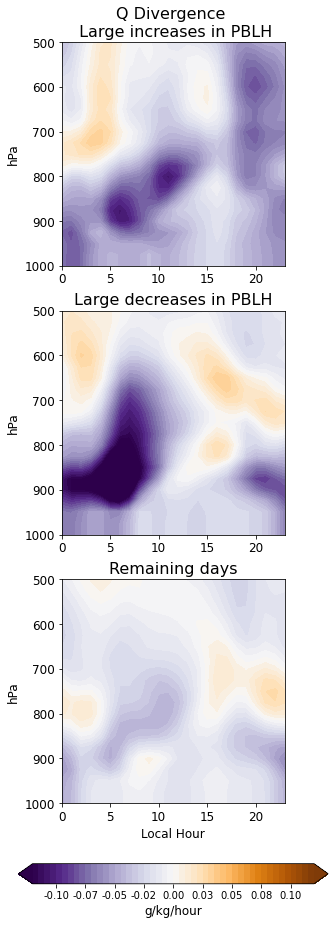

In [71]:
varSelPlot = 'q_adv_h'
levs = np.arange(-0.12, 0.125, 0.005)

# fig,axs = plt.subplots(2,3, figsize=(15,10))
fig,axs = plt.subplots(3,1, figsize=(4,14))
axs     = axs.ravel()

hours   = hourlyMean_highPct_realSfc_obs['hour'].values
levAtm  =  hourlyMean_highPct_realSfc_obs['lev'].values

axs[0].contourf(hours, levAtm, np.squeeze(np.transpose(hourlyMean_highPct_realSfc_obs[varSelPlot].values)), 
                levs, cmap='PuOr_r', extend='both')

axs[1].contourf(hours, levAtm, np.squeeze(np.transpose(hourlyMean_lowPct_realSfc_obs[varSelPlot].values)), 
                levs, cmap='PuOr_r', extend='both')

cp=axs[2].contourf(hours, levAtm, np.squeeze(np.transpose(hourlyMean_restOfDays_realSfc_obs[varSelPlot].values)), 
                levs, cmap='PuOr_r', extend='both')
# Add colorbar
ax_position = axs[2].get_position()
cbar_ax = fig.add_axes([ax_position.x0-0.15, ax_position.y0-0.08, ax_position.width+0.3, 0.02])
cbar = plt.colorbar(cp, orientation='horizontal',cax=cbar_ax, format='%.2f')
cbar.set_label(nateDS_local[varSelPlot].units,fontsize=12)


# Invert axes and set up titles/labels
axs[0].invert_yaxis()
axs[1].invert_yaxis()
axs[2].invert_yaxis()


axs[0].set_ylim([1000,500])
axs[1].set_ylim([1000,500])
axs[2].set_ylim([1000,500])

# Set labels
axs[0].set_title('Q Divergence \n Large increases in '+varSel, fontsize=16)
axs[1].set_title('Large decreases in '+varSel, fontsize=16)
axs[2].set_title('Remaining days', fontsize=16)

axs[0].set_ylabel('hPa', fontsize=12)
axs[1].set_ylabel('hPa', fontsize=12)
axs[2].set_ylabel('hPa', fontsize=12)
axs[2].set_xlabel('Local Hour', fontsize=12)

axs[0].tick_params(axis='both', labelsize= 12)
axs[1].tick_params(axis='both', labelsize= 12)
axs[2].tick_params(axis='both', labelsize= 12)



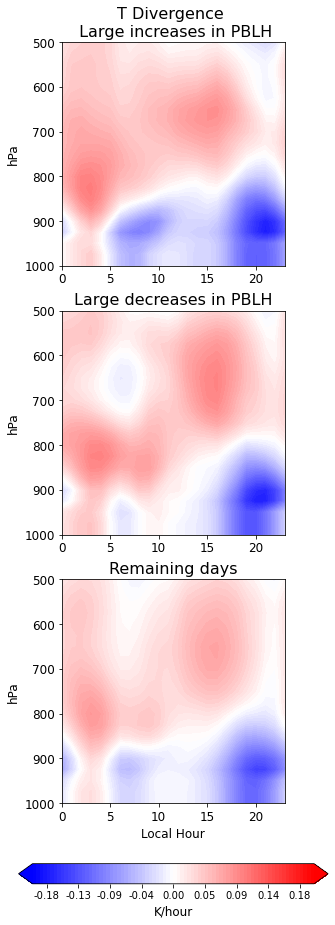

In [150]:
varSelPlot = 'T_adv_h'
levs = np.arange(-0.2, 0.205, 0.005)

# fig,axs = plt.subplots(2,3, figsize=(15,10))
fig,axs = plt.subplots(3,1, figsize=(4,14))
axs     = axs.ravel()

hours   = hourlyMean_highPct_realSfc_obs['hour'].values
levAtm  =  hourlyMean_highPct_realSfc_obs['lev'].values

axs[0].contourf(hours, levAtm, np.squeeze(np.transpose(hourlyMean_highPct_realSfc_obs[varSelPlot].values)), 
                levs, cmap='bwr', extend='both')

axs[1].contourf(hours, levAtm, np.squeeze(np.transpose(hourlyMean_lowPct_realSfc_obs[varSelPlot].values)), 
                levs, cmap='bwr', extend='both')

cp=axs[2].contourf(hours, levAtm, np.squeeze(np.transpose(hourlyMean_restOfDays_realSfc_obs[varSelPlot].values)), 
                levs, cmap='bwr', extend='both')
# Add colorbar
ax_position = axs[2].get_position()
cbar_ax = fig.add_axes([ax_position.x0-0.15, ax_position.y0-0.08, ax_position.width+0.3, 0.02])
cbar = plt.colorbar(cp, orientation='horizontal',cax=cbar_ax, format='%.2f')
cbar.set_label(nateDS_local[varSelPlot].units,fontsize=12)


# Invert axes and set up titles/labels
axs[0].invert_yaxis()
axs[1].invert_yaxis()
axs[2].invert_yaxis()


axs[0].set_ylim([1000,500])
axs[1].set_ylim([1000,500])
axs[2].set_ylim([1000,500])

# Set labels
axs[0].set_title('T Divergence \n Large increases in '+varSel, fontsize=16)
axs[1].set_title('Large decreases in '+varSel, fontsize=16)
axs[2].set_title('Remaining days', fontsize=16)

axs[0].set_ylabel('hPa', fontsize=12)
axs[1].set_ylabel('hPa', fontsize=12)
axs[2].set_ylabel('hPa', fontsize=12)
axs[2].set_xlabel('Local Hour', fontsize=12)

axs[0].tick_params(axis='both', labelsize= 12)
axs[1].tick_params(axis='both', labelsize= 12)
axs[2].tick_params(axis='both', labelsize= 12)


In [151]:
'''
Give this plotting routine the hourly mean DS' of high/low percentile filtering
'''

def plotTimeHeightDifference_meanDiurnalCycle_contourf(highPctDS_HMG, highPctDS_HTG,
                                                       lowPctDS_HMG, lowPctDS_HTG, 
                                                       restOfDaysDS_HMG, restOfDaysDS_HTG,
                                                       varSelPlot,
                                                       levsRaw, levsDiff, maxLev,
                                                       cmapRaw):

    ## Select which levels array to use
    if np.shape(highPctDS_HMG[varSelPlot].values)[1]==len(highPctDS_HMG.ilev.values):
        levSel = 'ilev'
    elif np.shape(highPctDS_HMG[varSelPlot].values)[1]==len(highPctDS_HMG.lev.values):
        levSel = 'lev'
    elif np.shape(highPctDS_HMG[varSelPlot].values)[1]==len(highPctDS_HMG.levInterp.values):
        levSel = 'levInterp'

    HMGvar_high   = np.squeeze(highPctDS_HMG[varSelPlot].values)
    HMGvar_low    = np.squeeze(lowPctDS_HMG[varSelPlot].values)
    HMGvar_rest   = np.squeeze(restOfDaysDS_HMG[varSelPlot].values)

    HTGvar_high   = np.squeeze(highPctDS_HTG[varSelPlot].values)
    HTGvar_low    = np.squeeze(lowPctDS_HTG[varSelPlot].values)
    HTGvar_rest   = np.squeeze(restOfDaysDS_HTG[varSelPlot].values)    
    
    diffHTG_high   = HTGvar_high    - HMGvar_high
    diffHTG_low    = HTGvar_low     - HMGvar_low
    diffHTG_rest   = HTGvar_rest    - HMGvar_rest

    
    ## Set up figure
    fig,axs = plt.subplots(3,2, figsize=(10,14))
    axs     = axs.ravel()
    fig.subplots_adjust(hspace=0.2)

    hours   = highPctDS_HMG.hour.values
    atmLevs = highPctDS_HMG[levSel].values


    ## - - - - - - - - - - - - - - - - - - - - - - - - - - -
    
    ## Plot raw HMG values
    contour_plot = axs[0].contourf(hours, atmLevs,
                                 np.squeeze(HMGvar_high).transpose(),
                                 levels=levsRaw, cmap=cmapRaw,extend='both')
    contour_plot = axs[2].contourf(hours, atmLevs,
                                 np.squeeze(HMGvar_low).transpose(),
                                 levels=levsRaw, cmap=cmapRaw,extend='both')
    contour_plot = axs[4].contourf(hours, atmLevs,
                                 np.squeeze(HMGvar_rest).transpose(),
                                 levels=levsRaw, cmap=cmapRaw,extend='both')
    
    
    # Add colorbar
    ax_position = axs[4].get_position()
    cbar_ax = fig.add_axes([ax_position.x0, ax_position.y0-0.08, ax_position.width, 0.02])
    if ((varSelPlot=='Q') | (varSelPlot=='Q_interp')):
        cbar = plt.colorbar(contour_plot, orientation='horizontal',cax=cbar_ax,format='%.1e')
        tick_locator = ticker.MaxNLocator(nbins=5)
        cbar.locator = tick_locator
        cbar.update_ticks()
    else:
        cbar = plt.colorbar(contour_plot, orientation='horizontal',cax=cbar_ax)
        
    cbar.ax.tick_params(labelsize=12)
    if hasattr(realSfc_allCases[varSelPlot], 'units'):
        cbar.set_label(realSfc_allCases[varSelPlot].units,fontsize=12)


    ## - - - - - - - - - - - - - - - - - - - - - - - - - - -    
    
    ## Plot HTG differences
    contour_plot = axs[1].contourf(hours, atmLevs, diffHTG_high.transpose(),
                                   levels=levsDiff, cmap='bwr',extend='both')
    contour_plot = axs[3].contourf(hours, atmLevs, diffHTG_low.transpose(),
                                   levels=levsDiff, cmap='bwr',extend='both')
    contour_plot = axs[5].contourf(hours, atmLevs, diffHTG_rest.transpose(),
                                   levels=levsDiff, cmap='bwr',extend='both')

    # Add colorbar
    ax_position = axs[5].get_position()
    cbar_ax = fig.add_axes([ax_position.x0-0.05, ax_position.y0-0.08, ax_position.width+0.095, 0.02])
    if ((varSelPlot=='Q') | (varSelPlot=='Q_interp')):
        cbar = plt.colorbar(contour_plot, orientation='horizontal',cax=cbar_ax,format='%0.1e')
        tick_locator = ticker.MaxNLocator(nbins=5)
        cbar.locator = tick_locator
        cbar.update_ticks()
    else:
        cbar = plt.colorbar(contour_plot, orientation='horizontal',cax=cbar_ax)
        
    cbar.ax.tick_params(labelsize=12)
    if hasattr(realSfc_allCases[varSelPlot], 'units'):
        cbar.set_label(realSfc_allCases[varSelPlot].units,fontsize=12)
        

    axs[4].set_xlabel('Local Hour', fontsize=14)
    axs[5].set_xlabel('Local Hour', fontsize=14)

    
    axs[0].invert_yaxis()
    axs[1].invert_yaxis()
    axs[2].invert_yaxis()
    axs[3].invert_yaxis()
    axs[4].invert_yaxis()
    axs[5].invert_yaxis()

    axs[0].set_ylim([1000, maxLev])
    axs[1].set_ylim([1000, maxLev])
    axs[2].set_ylim([1000, maxLev])
    axs[3].set_ylim([1000, maxLev])
    axs[4].set_ylim([1000, maxLev])
    axs[5].set_ylim([1000, maxLev])  
   
    axs[0].axes.xaxis.set_ticklabels([])
    axs[1].axes.xaxis.set_ticklabels([])
    axs[2].axes.xaxis.set_ticklabels([])
    axs[3].axes.xaxis.set_ticklabels([])
    
    axs[1].axes.yaxis.set_ticklabels([])
    axs[2].axes.yaxis.set_ticklabels([])
    axs[3].axes.yaxis.set_ticklabels([])
   
    axs[0].set_title(varSelPlot+' (HMG)\n Large increases in '+varSel, fontsize=16)
    axs[1].set_title('HTG - HMG', fontsize=16)
    
    axs[2].set_title('Large decreases in '+varSel, fontsize=16)
    
    axs[4].set_title('Remaining days', fontsize=16)

    if varSelPlot.endswith('_interp'):
        axs[0].set_ylabel('hPa', fontsize=12)
        axs[2].set_ylabel('hPa', fontsize=12)
        axs[4].set_ylabel('hPa', fontsize=12)
    else:
        axs[0].set_ylabel('hPa (model hybrid coord)', fontsize=12)
        axs[2].set_ylabel('hPa (model hybrid coord)', fontsize=12)
        axs[4].set_ylabel('hPa (model hybrid coord)', fontsize=12)

    axs[0].tick_params(axis='both', labelsize= 12)
    axs[1].tick_params(axis='both', labelsize= 12)
    axs[2].tick_params(axis='both', labelsize= 12)
    axs[3].tick_params(axis='both', labelsize= 12)
    axs[4].tick_params(axis='both', labelsize= 12)
    axs[5].tick_params(axis='both', labelsize= 12)
     

    ## - - - - - - - - - - - - - - - - - - - - - - - - - - -
    ## Add markers of significant differences
    
    # CIlevel = 1.960   ## 95% CI
    CIlevel = 1.645   ## 90% CI

    ## Real surface significance 
    for il in range(len(hourlyMean_highPct_realSfc[levSel].values)):
        
        ## High pct
        stdErr_highPct_HMG  = np.squeeze(hourlyStd_highPct_ensHMG[varSelPlot].values[:,il])/np.sqrt(hourlyMean_highPct_ensHMG['SampleCount'].values)
        stdErr_highPct_HTG  = np.squeeze(hourlyStd_highPct_ensHTG[varSelPlot].values[:,il])/np.sqrt(hourlyMean_highPct_ensHTG['SampleCount'].values)
 
        xmax1_highPct = np.squeeze(HMGvar_high)[:,il] + (CIlevel*stdErr_highPct_HMG)
        xmin1_highPct = np.squeeze(HMGvar_high)[:,il] - (CIlevel*stdErr_highPct_HMG)
        xmax2_highPct = np.squeeze(HTGvar_high)[:,il] + (CIlevel*stdErr_highPct_HTG)
        xmin2_highPct = np.squeeze(HTGvar_high)[:,il] - (CIlevel*stdErr_highPct_HTG)


        ## Low pct
        stdErr_lowPct_HMG  = np.squeeze(hourlyStd_lowPct_ensHMG[varSelPlot].values[:,il])/np.sqrt(hourlyMean_lowPct_ensHMG['SampleCount'].values)
        stdErr_lowPct_HTG  = np.squeeze(hourlyStd_lowPct_ensHTG[varSelPlot].values[:,il])/np.sqrt(hourlyMean_lowPct_ensHTG['SampleCount'].values)

        xmax1_lowPct = np.squeeze(HMGvar_low)[:,il] + (CIlevel*stdErr_lowPct_HMG)
        xmin1_lowPct = np.squeeze(HMGvar_low)[:,il] - (CIlevel*stdErr_lowPct_HMG)
        xmax2_lowPct = np.squeeze(HTGvar_low)[:,il] + (CIlevel*stdErr_lowPct_HTG)
        xmin2_lowPct = np.squeeze(HTGvar_low)[:,il] - (CIlevel*stdErr_lowPct_HTG)
      

        ## Rest of days
        stdErr_restOfDays_HMG  = np.squeeze(hourlyStd_restOfDays_ensHMG[varSelPlot].values[:,il])/np.sqrt(hourlyMean_restOfDays_ensHMG['SampleCount'].values)
        stdErr_restOfDays_HTG  = np.squeeze(hourlyStd_restOfDays_ensHTG[varSelPlot].values[:,il])/np.sqrt(hourlyMean_restOfDays_ensHTG['SampleCount'].values)

        xmax1_restOfDays = np.squeeze(HMGvar_rest)[:,il] + (CIlevel*stdErr_restOfDays_HMG)
        xmin1_restOfDays = np.squeeze(HMGvar_rest)[:,il] - (CIlevel*stdErr_restOfDays_HMG)
        xmax2_restOfDays = np.squeeze(HTGvar_rest)[:,il] + (CIlevel*stdErr_restOfDays_HTG)
        xmin2_restOfDays = np.squeeze(HTGvar_rest)[:,il] - (CIlevel*stdErr_restOfDays_HTG)


        # Check significance and plot 
        levSig_highPct    = np.ones([24])
        levSig_lowPct     = np.ones([24])
        levSig_restOfDays = np.ones([24])

        
        for iHr in range(24):
            ## High Pct                 
            # HTG
            if ((abs(xmin1_highPct[iHr])>=abs(xmin2_highPct[iHr])) & (abs(xmin1_highPct[iHr])<=abs(xmax2_highPct[iHr]))):
                levSig_highPct[iHr] = 0
            elif ((abs(xmin2_highPct[iHr])>=abs(xmin1_highPct[iHr])) & (abs(xmin2_highPct[iHr])<=abs(xmax1_highPct[iHr]))):
                levSig_highPct[iHr] = 0

            if levSig_highPct[iHr]==1:
                axs[1].plot(hourlyMean_highPct_realSfc['hour'].values[iHr],
                            hourlyMean_highPct_realSfc[levSel].values[il],
                            'ko',alpha=0.3,markersize=1)

                
            ## Low percent                
            # HTG
            if ((abs(xmin1_lowPct[iHr])>=abs(xmin2_lowPct[iHr])) & (abs(xmin1_lowPct[iHr])<=abs(xmax2_lowPct[iHr]))):
                levSig_lowPct[iHr] = 0
            elif ((abs(xmin2_lowPct[iHr])>=abs(xmin1_lowPct[iHr])) & (abs(xmin2_lowPct[iHr])<=abs(xmax1_lowPct[iHr]))):
                levSig_lowPct[iHr] = 0

            if levSig_lowPct[iHr]==1:
                axs[3].plot(hourlyMean_lowPct_realSfc['hour'].values[iHr],
                            hourlyMean_lowPct_realSfc[levSel].values[il],
                            'ko',alpha=0.3,markersize=1)
                                
                
            ## Rest of days
            # HTG
            if ((abs(xmin1_restOfDays[iHr])>=abs(xmin2_restOfDays[iHr])) & (abs(xmin1_restOfDays[iHr])<=abs(xmax2_restOfDays[iHr]))):
                levSig_restOfDays[iHr] = 0
            elif ((abs(xmin2_restOfDays[iHr])>=abs(xmin1_restOfDays[iHr])) & (abs(xmin2_restOfDays[iHr])<=abs(xmax1_restOfDays[iHr]))):
                levSig_restOfDays[iHr] = 0

            if levSig_restOfDays[iHr]==1:
                axs[5].plot(hourlyMean_restOfDays_realSfc['hour'].values[iHr],
                            hourlyMean_restOfDays_realSfc[levSel].values[il],
                            'ko',alpha=0.3,markersize=1)


    return

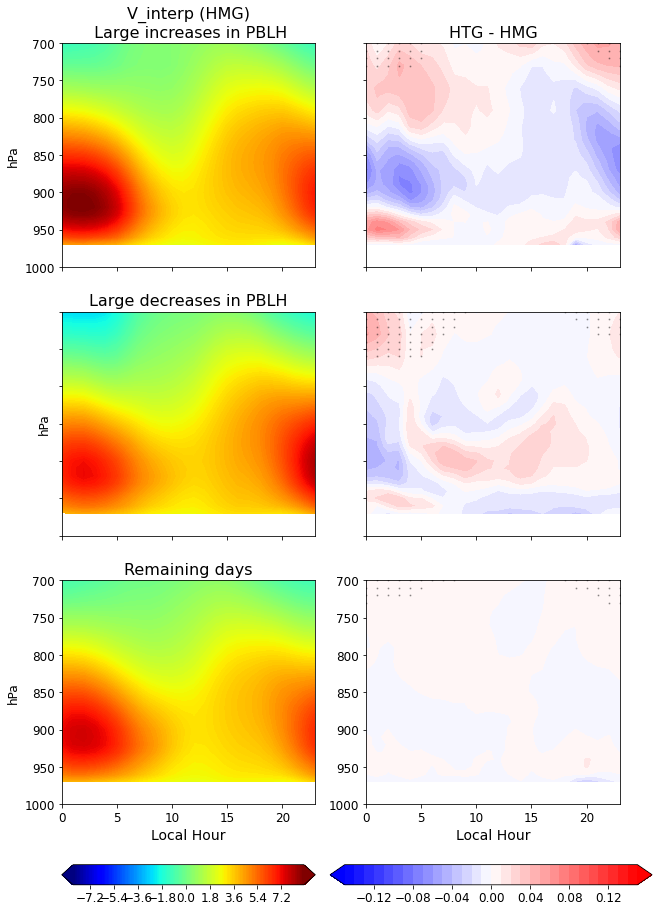

In [152]:
varSelPlot = 'V_interp'
levsDiff   = np.arange(-0.15, 0.16, 0.01)
levsRaw    = np.arange(-8.5,9.0,0.1)
# levsRaw    = np.arange(-3,15,0.02)
    
plotTimeHeightDifference_meanDiurnalCycle_contourf(hourlyMean_highPct_ensHMG,    hourlyMean_highPct_ensHTG,
                                                   hourlyMean_lowPct_ensHMG,     hourlyMean_lowPct_ensHTG,
                                                   hourlyMean_restOfDays_ensHMG, hourlyMean_restOfDays_ensHTG, 
                                                   varSelPlot,
                                                   levsRaw,
                                                   levsDiff,
                                                   700, # Highest level to plot to
                                                   'jet') #cmap to use for raw values


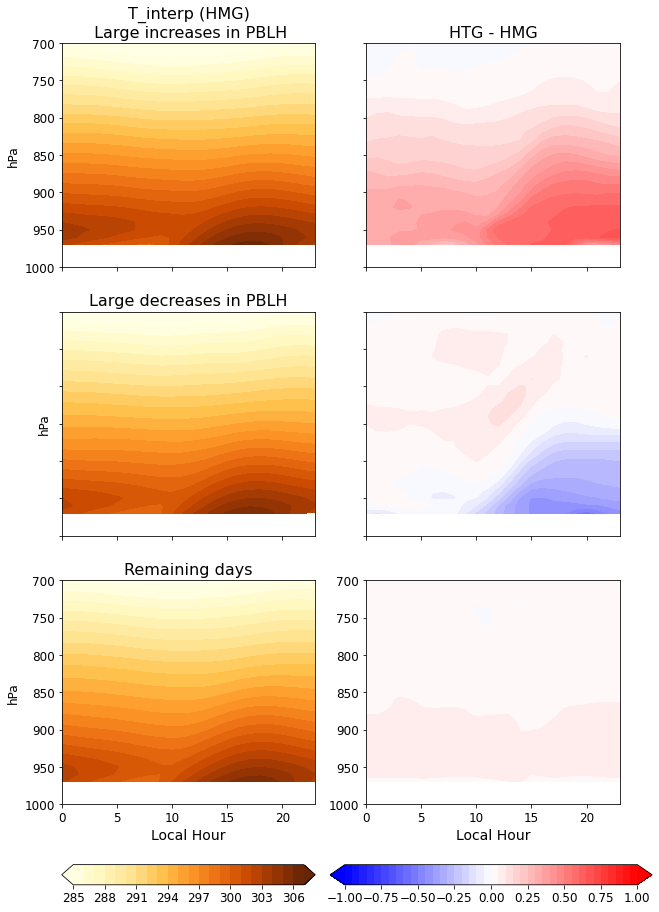

In [153]:
levsRaw  = np.arange(285,308,1)
levsDiff = np.arange(-1.0,1.05,0.05)
varSelPlot = 'T_interp'

plotTimeHeightDifference_meanDiurnalCycle_contourf(hourlyMean_highPct_ensHMG,    hourlyMean_highPct_ensHTG,
                                                   hourlyMean_lowPct_ensHMG,     hourlyMean_lowPct_ensHTG,
                                                   hourlyMean_restOfDays_ensHMG, hourlyMean_restOfDays_ensHTG, 
                                                   varSelPlot,
                                                   levsRaw,
                                                   levsDiff,
                                                   700, # Highest level to plot to
                                                   'YlOrBr') #cmap to use for raw values

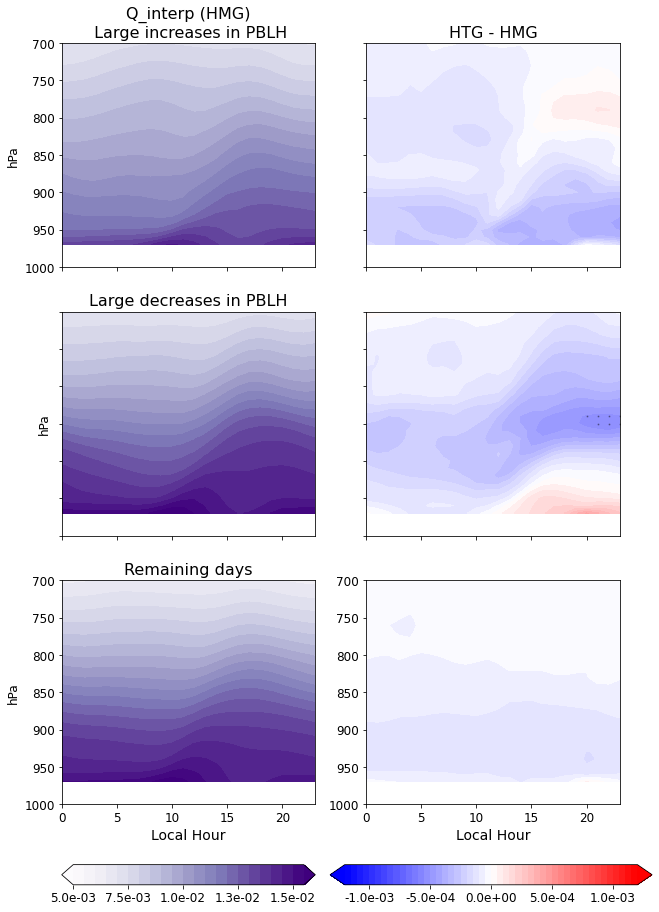

In [154]:
levsDiff = np.arange(-1.2e-3, 1.25e-3, 0.05e-3)
levsRaw  = np.arange(0.0050, 0.016, 0.0005)
varSelPlot = 'Q_interp'
plotTimeHeightDifference_meanDiurnalCycle_contourf(hourlyMean_highPct_ensHMG,    hourlyMean_highPct_ensHTG,
                                                   hourlyMean_lowPct_ensHMG,     hourlyMean_lowPct_ensHTG,
                                                   hourlyMean_restOfDays_ensHMG, hourlyMean_restOfDays_ensHTG, 
                                                   varSelPlot,
                                                   levsRaw,
                                                   levsDiff,
                                                   700, # Highest level to plot to
                                                   'Purples') #cmap to use for raw values


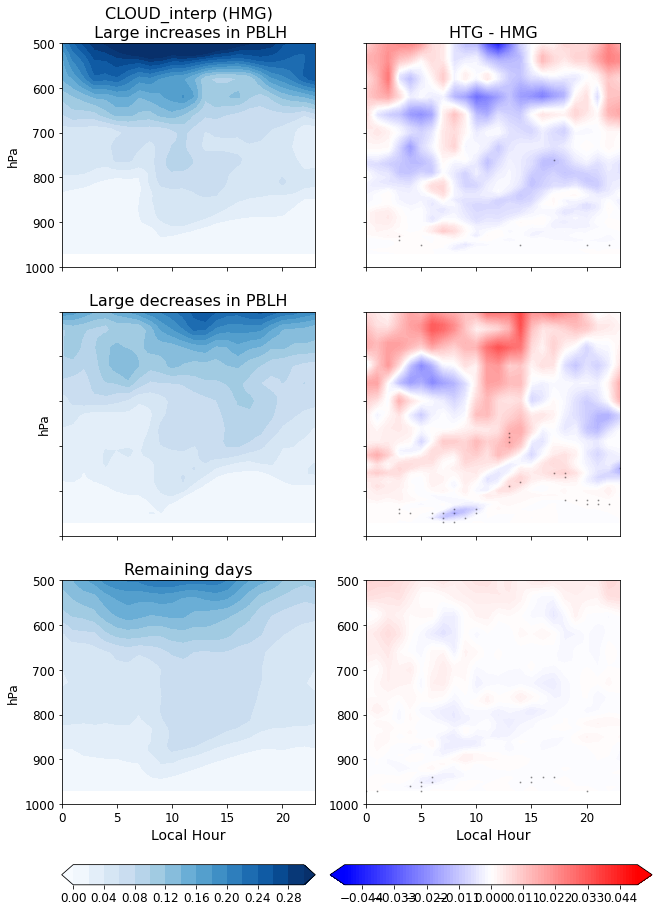

In [155]:
levsDiff = np.arange(-0.05,0.051,0.001)
levsRaw  = np.arange(0,0.32,0.02)
varSelPlot = 'CLOUD_interp'

plotTimeHeightDifference_meanDiurnalCycle_contourf(hourlyMean_highPct_ensHMG,    hourlyMean_highPct_ensHTG,
                                                   hourlyMean_lowPct_ensHMG,     hourlyMean_lowPct_ensHTG,
                                                   hourlyMean_restOfDays_ensHMG, hourlyMean_restOfDays_ensHTG, 
                                                   varSelPlot,
                                                   levsRaw,
                                                   levsDiff,
                                                   500, # Highest level to plot to
                                                   'Blues') #cmap to use for raw values


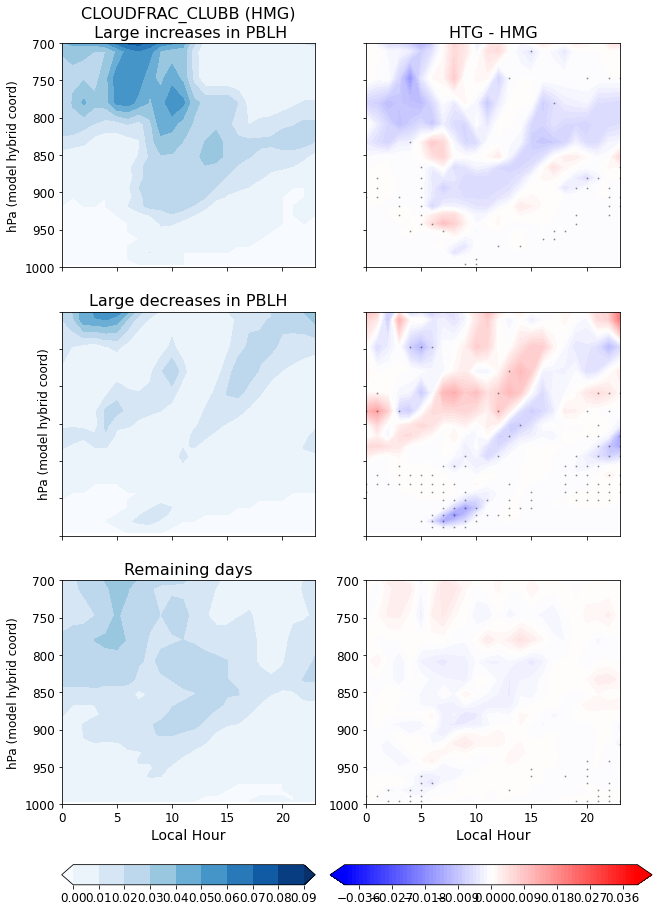

In [156]:
levsDiff = np.arange(-0.04,0.041,0.001)
levsRaw  = np.arange(0,0.1,0.01)
varSelPlot = 'CLOUDFRAC_CLUBB'

plotTimeHeightDifference_meanDiurnalCycle_contourf(hourlyMean_highPct_ensHMG,    hourlyMean_highPct_ensHTG,
                                                   hourlyMean_lowPct_ensHMG,     hourlyMean_lowPct_ensHTG,
                                                   hourlyMean_restOfDays_ensHMG, hourlyMean_restOfDays_ensHTG, 
                                                   varSelPlot,
                                                   levsRaw,
                                                   levsDiff,
                                                   700, # Highest level to plot to
                                                   'Blues') #cmap to use for raw values


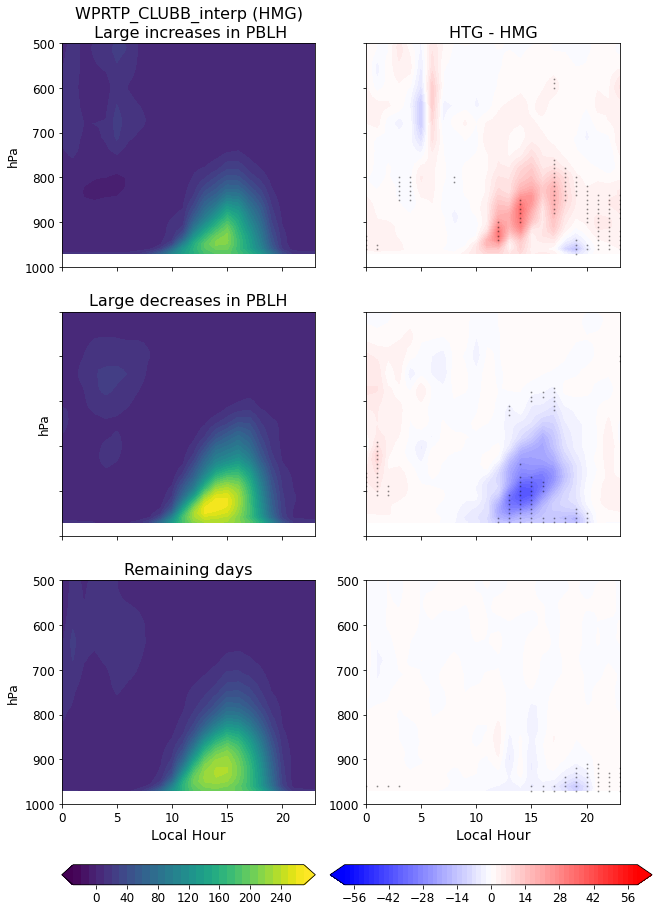

In [157]:
levsDiff = np.arange(-60,62,2)
levsRaw  = np.arange(-30,280,10)
varSelPlot = 'WPRTP_CLUBB_interp'

plotTimeHeightDifference_meanDiurnalCycle_contourf(hourlyMean_highPct_ensHMG,    hourlyMean_highPct_ensHTG,
                                                   hourlyMean_lowPct_ensHMG,     hourlyMean_lowPct_ensHTG,
                                                   hourlyMean_restOfDays_ensHMG, hourlyMean_restOfDays_ensHTG, 
                                                   varSelPlot,
                                                   levsRaw,
                                                   levsDiff,
                                                   500, # Highest level to plot to
                                                   'viridis') #cmap to use for raw values




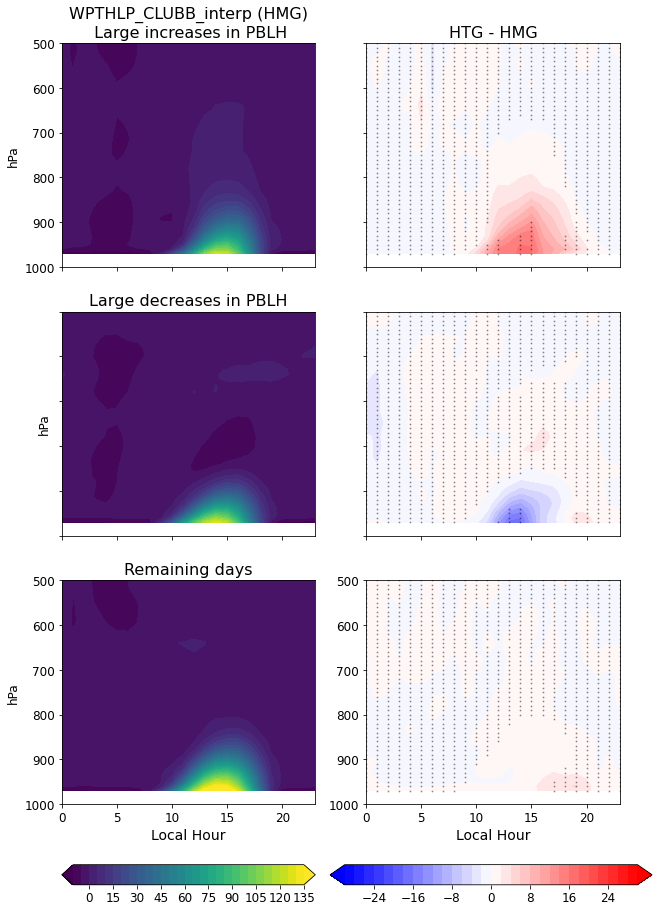

In [158]:
levsDiff = np.arange(-30,32,2)
levsRaw  = np.arange(-10,140,5)
varSelPlot = 'WPTHLP_CLUBB_interp'
    
plotTimeHeightDifference_meanDiurnalCycle_contourf(hourlyMean_highPct_ensHMG,    hourlyMean_highPct_ensHTG,
                                                   hourlyMean_lowPct_ensHMG,     hourlyMean_lowPct_ensHTG,
                                                   hourlyMean_restOfDays_ensHMG, hourlyMean_restOfDays_ensHTG, 
                                                   varSelPlot,
                                                   levsRaw,
                                                   levsDiff,
                                                   500, # Highest level to plot to
                                                   'viridis') #cmap to use for raw values


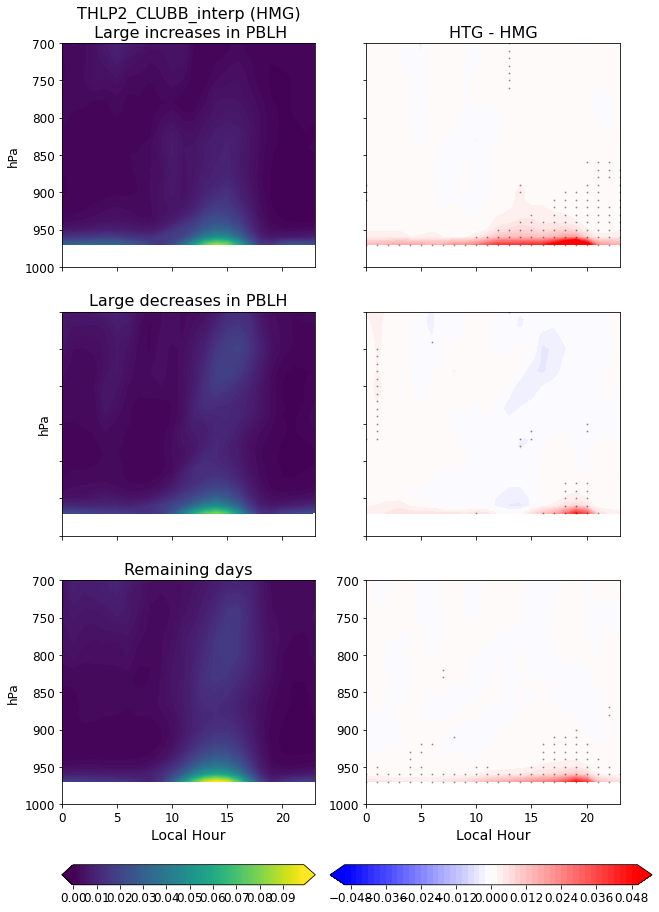

In [159]:
varSelPlot = 'THLP2_CLUBB_interp'
levsDiff   = np.arange(-0.05, 0.052, 0.002)
levsRaw    = np.arange(0,0.10,0.001)
    
plotTimeHeightDifference_meanDiurnalCycle_contourf(hourlyMean_highPct_ensHMG,    hourlyMean_highPct_ensHTG,
                                                   hourlyMean_lowPct_ensHMG,     hourlyMean_lowPct_ensHTG,
                                                   hourlyMean_restOfDays_ensHMG, hourlyMean_restOfDays_ensHTG, 
                                                   varSelPlot,
                                                   levsRaw,
                                                   levsDiff,
                                                   700, # Highest level to plot to
                                                   'viridis') #cmap to use for raw values


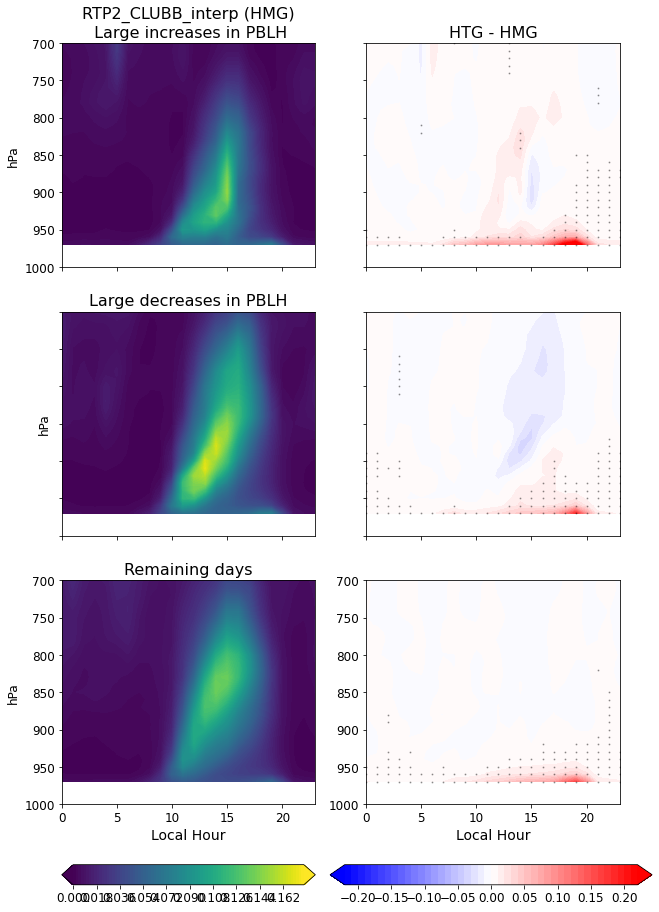

In [160]:
varSelPlot = 'RTP2_CLUBB_interp'
levsDiff   = np.arange(-0.22, 0.23, 0.01)
levsRaw    = np.arange(0,0.18,0.002)

plotTimeHeightDifference_meanDiurnalCycle_contourf(hourlyMean_highPct_ensHMG,    hourlyMean_highPct_ensHTG,
                                                   hourlyMean_lowPct_ensHMG,     hourlyMean_lowPct_ensHTG,
                                                   hourlyMean_restOfDays_ensHMG, hourlyMean_restOfDays_ensHTG, 
                                                   varSelPlot,
                                                   levsRaw,
                                                   levsDiff,
                                                   700, # Highest level to plot to
                                                   'viridis') #cmap to use for raw values


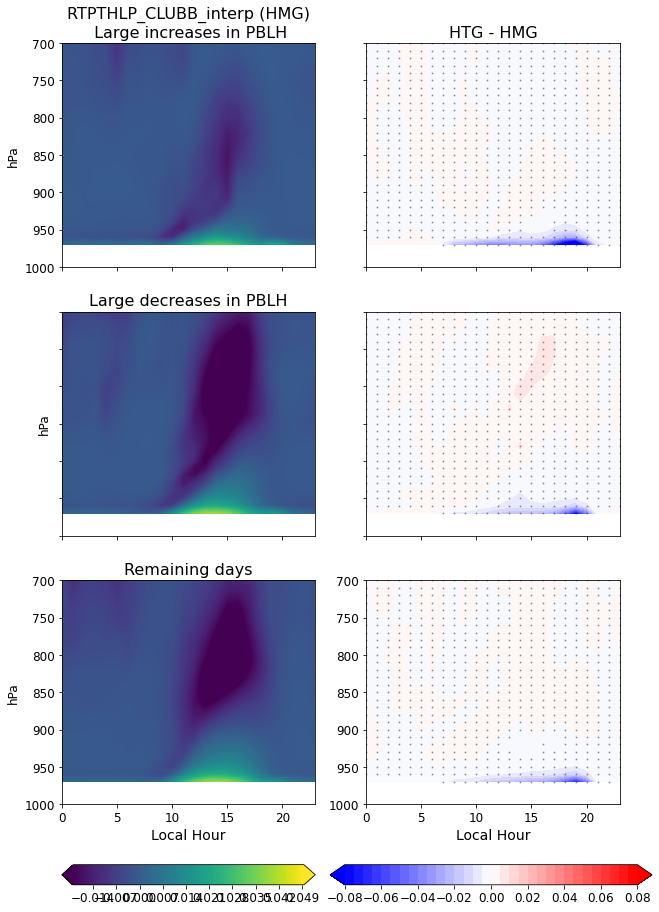

In [161]:
varSelPlot = 'RTPTHLP_CLUBB_interp'
levsDiff   = np.arange(-0.08, 0.085, 0.005)
levsRaw    = np.arange(-0.02,0.05,0.0005)

plotTimeHeightDifference_meanDiurnalCycle_contourf(hourlyMean_highPct_ensHMG,    hourlyMean_highPct_ensHTG,
                                                   hourlyMean_lowPct_ensHMG,     hourlyMean_lowPct_ensHTG,
                                                   hourlyMean_restOfDays_ensHMG, hourlyMean_restOfDays_ensHTG, 
                                                   varSelPlot,
                                                   levsRaw,
                                                   levsDiff,
                                                   700, # Highest level to plot to
                                                   'viridis') #cmap to use for raw values


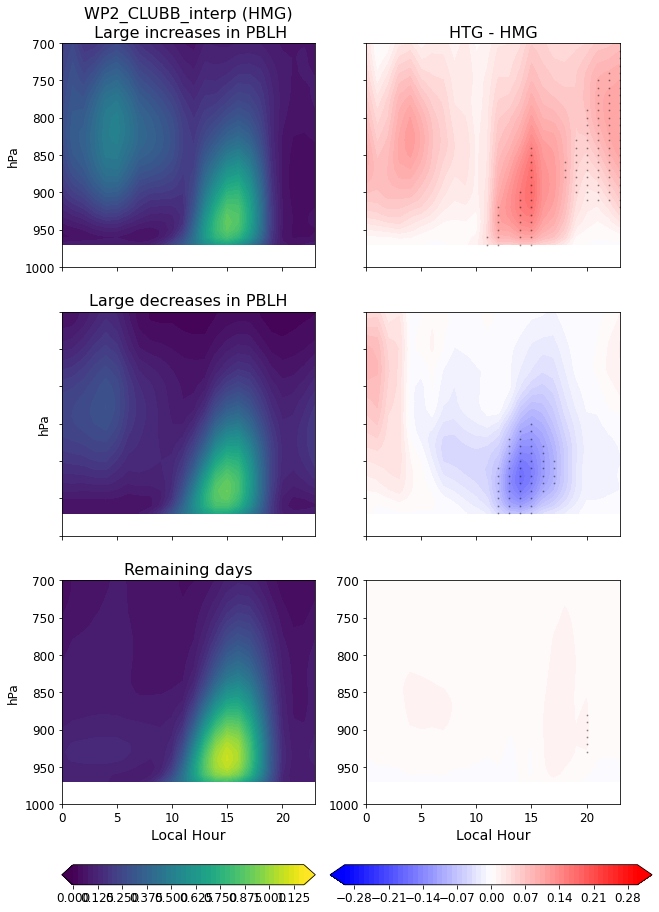

In [162]:
varSelPlot = 'WP2_CLUBB_interp'
levsDiff   = np.arange(-0.3, 0.31, 0.01)
levsRaw    = np.arange(0,1.2,0.025)

plotTimeHeightDifference_meanDiurnalCycle_contourf(hourlyMean_highPct_ensHMG,    hourlyMean_highPct_ensHTG,
                                                   hourlyMean_lowPct_ensHMG,     hourlyMean_lowPct_ensHTG,
                                                   hourlyMean_restOfDays_ensHMG, hourlyMean_restOfDays_ensHTG, 
                                                   varSelPlot,
                                                   levsRaw,
                                                   levsDiff,
                                                   700, # Highest level to plot to
                                                   'viridis') #cmap to use for raw values


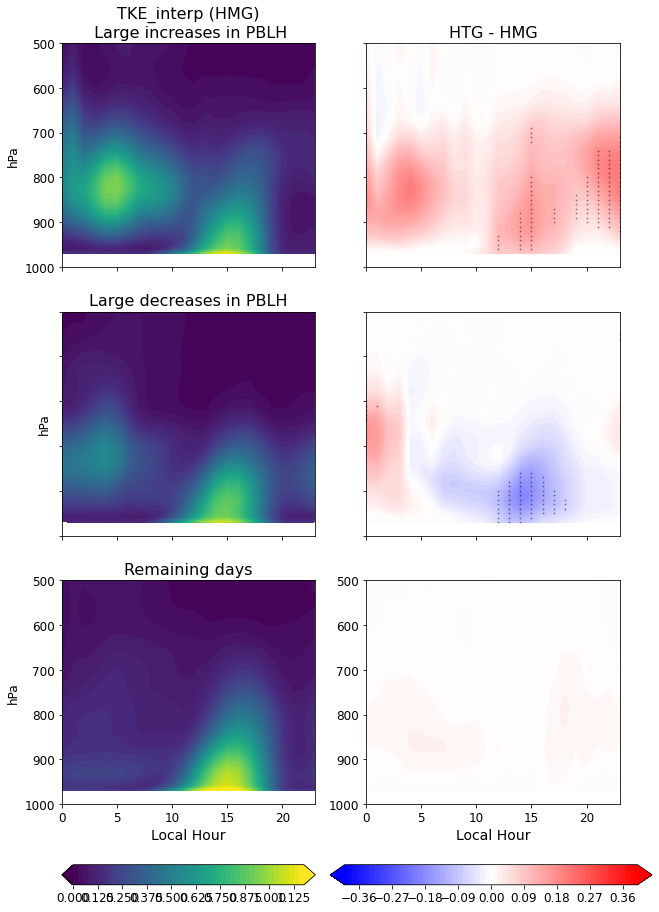

In [163]:
varSelPlot = 'TKE_interp'
levsDiff   = np.arange(-0.4, 0.41, 0.01)
levsRaw    = np.arange(0,1.2,0.025)

plotTimeHeightDifference_meanDiurnalCycle_contourf(hourlyMean_highPct_ensHMG,    hourlyMean_highPct_ensHTG,
                                                   hourlyMean_lowPct_ensHMG,     hourlyMean_lowPct_ensHTG,
                                                   hourlyMean_restOfDays_ensHMG, hourlyMean_restOfDays_ensHTG, 
                                                   varSelPlot,
                                                   levsRaw,
                                                   levsDiff,
                                                   500, # Highest level to plot to
                                                   'viridis') #cmap to use for raw values




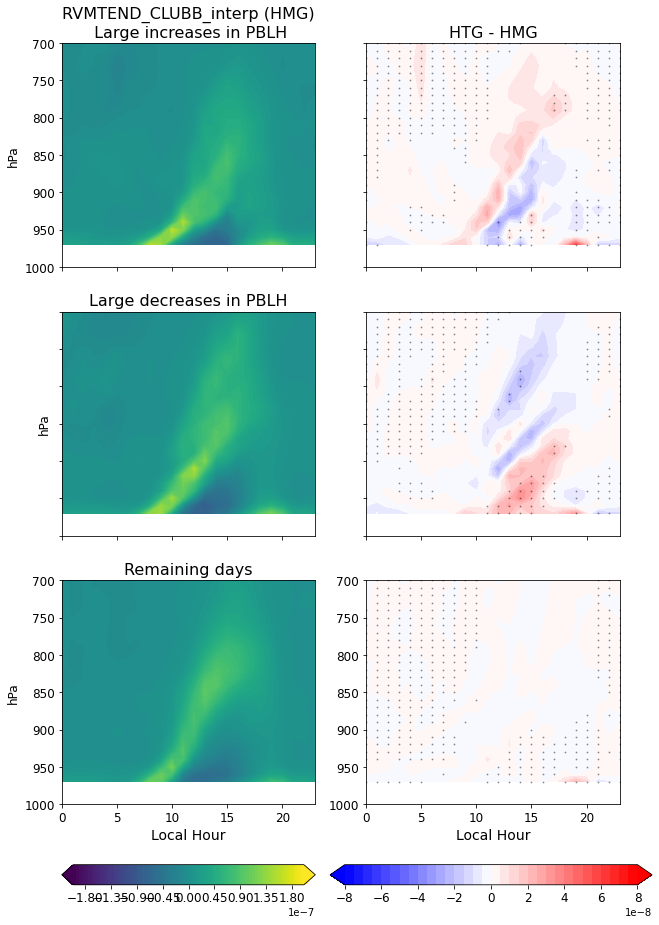

In [164]:
varSelPlot = 'RVMTEND_CLUBB_interp'
levsDiff   = np.arange(-0.8e-7, 0.85e-7, 0.05e-7)
levsRaw    = np.arange(-2e-7, 2.05e-7, 0.05e-7)

plotTimeHeightDifference_meanDiurnalCycle_contourf(hourlyMean_highPct_ensHMG,    hourlyMean_highPct_ensHTG,
                                                   hourlyMean_lowPct_ensHMG,     hourlyMean_lowPct_ensHTG,
                                                   hourlyMean_restOfDays_ensHMG, hourlyMean_restOfDays_ensHTG, 
                                                   varSelPlot,
                                                   levsRaw,
                                                   levsDiff,
                                                   700, # Highest level to plot to
                                                   'viridis') #cmap to use for raw values


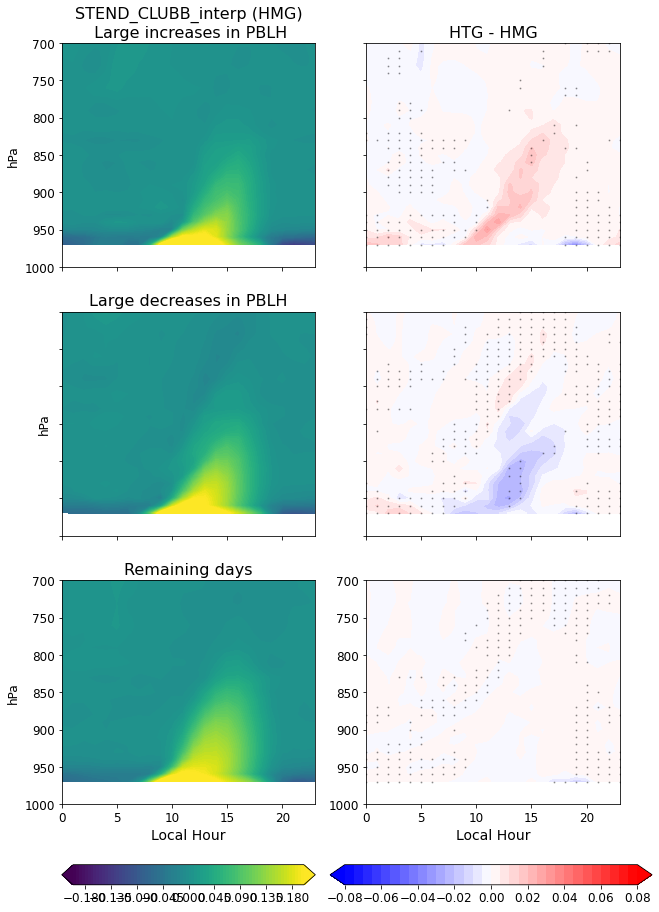

In [165]:
varSelPlot = 'STEND_CLUBB_interp'
levsDiff   = np.arange(-0.8e-1, 0.85e-1, 0.05e-1)
levsRaw    = np.arange(-2e-1, 2.05e-1, 0.05e-1)

plotTimeHeightDifference_meanDiurnalCycle_contourf(hourlyMean_highPct_ensHMG,    hourlyMean_highPct_ensHTG,
                                                   hourlyMean_lowPct_ensHMG,     hourlyMean_lowPct_ensHTG,
                                                   hourlyMean_restOfDays_ensHMG, hourlyMean_restOfDays_ensHTG, 
                                                   varSelPlot,
                                                   levsRaw,
                                                   levsDiff,
                                                   700, # Highest level to plot to
                                                   'viridis') #cmap to use for raw values


## Vertical profiles 

In [167]:
'''
Give this plotting routine the hourly mean DS' of high/low percentile filtering
'''
## Read in one file that has units on it (once you upsample, they disappear)

saveDir    = '/glade/work/mdfowler/CLASP/histData/processedData/'
realSfcHMG = pickle.load( open( saveDir+"realSfc_HMG_rtpthlponly_relaxTlongTau_freeSfcT.p" , "rb") )

def plotProfiles_meanOverHours(highPctDS_HMG, highPctDS_HTG,
                               lowPctDS_HMG, lowPctDS_HTG,
                               restOfDaysDS_HMG, restOfDaysDS_HTG,
                               varSelPlot,
                               startHr,endHr,
                               xMin, xMax, maxLev):
    
    caseNames = np.asarray(['HMG','HTG'])
    colorList = np.asarray(['lightseagreen','red'])

    ## Select which levels array to use
    if np.shape(highPctDS_HMG[varSelPlot].values)[2]==len(highPctDS_HMG.ilev.values):
        levSel = 'ilev'
    elif np.shape(highPctDS_HMG[varSelPlot].values)[2]==len(highPctDS_HMG.lev.values):
        levSel = 'lev'
    elif np.shape(highPctDS_HMG[varSelPlot].values)[2]==len(highPctDS_HMG.levInterp.values):
        levSel = 'levInterp'
        
                            
    ## First, get means (& std) over the selected hours and ens cases
    iTimeSel_high = np.where((highPctDS_HMG["time.hour"].values>=startHr) & 
                             (highPctDS_HMG["time.hour"].values<=endHr))[0]
    iTimeSel_low  = np.where((lowPctDS_HMG["time.hour"].values>=startHr) & 
                             (lowPctDS_HMG["time.hour"].values<=endHr))[0]
    iTimeSel_rest = np.where((restOfDaysDS_HMG["time.hour"].values>=startHr) & 
                             (restOfDaysDS_HMG["time.hour"].values<=endHr))[0]
    
    
    hourlyMean_highTimeSel_HMG   = highPctDS_HMG.isel(time=iTimeSel_high).mean(dim=["time","case"])
    hourlyMean_lowTimeSel_HMG    = lowPctDS_HMG.isel(time=iTimeSel_low).mean(dim=["time","case"])
    hourlyMean_restTimeSel_HMG   = restOfDaysDS_HMG.isel(time=iTimeSel_rest).mean(dim=["time","case"])
    
    hourlyStd_highTimeSel_HMG   = highPctDS_HMG.isel(time=iTimeSel_high).std(dim=["time","case"])
    hourlyStd_lowTimeSel_HMG    = lowPctDS_HMG.isel(time=iTimeSel_low).std(dim=["time","case"])
    hourlyStd_restTimeSel_HMG   = restOfDaysDS_HMG.isel(time=iTimeSel_rest).std(dim=["time","case"])
    
    
    hourlyMean_highTimeSel_HTG   = highPctDS_HTG.isel(time=iTimeSel_high).mean(dim=["time","case"])
    hourlyMean_lowTimeSel_HTG    = lowPctDS_HTG.isel(time=iTimeSel_low).mean(dim=["time","case"])
    hourlyMean_restTimeSel_HTG   = restOfDaysDS_HTG.isel(time=iTimeSel_rest).mean(dim=["time","case"])
    
    hourlyStd_highTimeSel_HTG   = highPctDS_HTG.isel(time=iTimeSel_high).std(dim=["time","case"])
    hourlyStd_lowTimeSel_HTG    = lowPctDS_HTG.isel(time=iTimeSel_low).std(dim=["time","case"])
    hourlyStd_restTimeSel_HTG   = restOfDaysDS_HTG.isel(time=iTimeSel_rest).std(dim=["time","case"])
    
    
    # Select the requested variable
    HMGvar_high   = np.squeeze(hourlyMean_highTimeSel_HMG[varSelPlot].values)
    HMGvar_low    = np.squeeze(hourlyMean_lowTimeSel_HMG[varSelPlot].values)
    HMGvar_rest   = np.squeeze(hourlyMean_restTimeSel_HMG[varSelPlot].values)

    HTGvar_high   = np.squeeze(hourlyMean_highTimeSel_HTG[varSelPlot].values)
    HTGvar_low    = np.squeeze(hourlyMean_lowTimeSel_HTG[varSelPlot].values)
    HTGvar_rest   = np.squeeze(hourlyMean_restTimeSel_HTG[varSelPlot].values)


    # Also get the std of that variable... 
    HMGvarStd_high   = np.squeeze(hourlyStd_highTimeSel_HMG[varSelPlot].values)
    HMGvarStd_low    = np.squeeze(hourlyStd_lowTimeSel_HMG[varSelPlot].values)
    HMGvarStd_rest   = np.squeeze(hourlyStd_restTimeSel_HMG[varSelPlot].values)

    HTGvarStd_high   = np.squeeze(hourlyStd_highTimeSel_HTG[varSelPlot].values)
    HTGvarStd_low    = np.squeeze(hourlyStd_lowTimeSel_HTG[varSelPlot].values)
    HTGvarStd_rest   = np.squeeze(hourlyStd_restTimeSel_HTG[varSelPlot].values)
    
 
    ## Set up figure
    fig,axs = plt.subplots(1,3, figsize=(15,5))
    axs     = axs.ravel()
    fig.subplots_adjust(hspace=0.2)

    atmLevs = highPctDS_HMG[levSel].values

    ## Define confidence level to rely on
    # CIlevel = 1.960   ## 95% CI
    CIlevel = 1.645   ## 90% CI

    ## - - - - - - - - - - - - - - - - - - - - - - - - - - -
    ## Plot profiles
    axs[0].errorbar(HMGvar_high,   atmLevs,
                    xerr=CIlevel*(HMGvarStd_high/np.sqrt(len(iTimeSel_high))),
                    capsize=3, color=colorList[0], label=caseNames[0])
    axs[0].errorbar(HTGvar_high,   atmLevs, 
                    xerr=CIlevel*(HTGvarStd_high/np.sqrt(len(iTimeSel_high))),
                    capsize=3, color=colorList[1], label=caseNames[1])
    axs[0].legend(fontsize=12)

    
    axs[1].errorbar(HMGvar_low,   atmLevs, 
                    xerr=CIlevel*(HMGvarStd_low/np.sqrt(len(iTimeSel_low))),
                    capsize=3, color=colorList[0], label=caseNames[0])
    axs[1].errorbar(HTGvar_low,   atmLevs,
                    xerr=CIlevel*(HTGvarStd_low/np.sqrt(len(iTimeSel_low))),
                    capsize=3, color=colorList[1], label=caseNames[1])

                     
                     
    axs[2].errorbar(HMGvar_rest,   atmLevs,
                    xerr=CIlevel*(HMGvarStd_rest/np.sqrt(len(iTimeSel_rest))),
                    capsize=3, color=colorList[0], label=caseNames[0])
    axs[2].errorbar(HTGvar_rest,   atmLevs, 
                    xerr=CIlevel*(HTGvarStd_rest/np.sqrt(len(iTimeSel_rest))),
                    capsize=3, color=colorList[1], label=caseNames[1])

    

    ## - - - - - - - - - - - - - - - - - - - - - - - - - - -
    # Other plot options
    axs[0].invert_yaxis()
    axs[1].invert_yaxis()
    axs[2].invert_yaxis()

    axs[0].set_ylim([980, maxLev])
    axs[1].set_ylim([980, maxLev])
    axs[2].set_ylim([980, maxLev])
    
    axs[0].set_xlim([xMin, xMax])
    axs[1].set_xlim([xMin, xMax])
    axs[2].set_xlim([xMin, xMax])
    
    axs[1].axes.yaxis.set_ticklabels([])
    axs[2].axes.yaxis.set_ticklabels([])   

    axs[0].set_title(varSelPlot+'\n Large increases in '+varSel, fontsize=16)       
    axs[1].set_title('Large decreases in '+varSel, fontsize=16)
    axs[2].set_title('Remaining days', fontsize=16)

    axs[0].set_xlabel(realSfcHMG[varSelPlot].units, fontsize=12)
    axs[1].set_xlabel(realSfcHMG[varSelPlot].units, fontsize=12)
    axs[2].set_xlabel(realSfcHMG[varSelPlot].units, fontsize=12)
    
    if varSelPlot.endswith('_interp'):
        axs[0].set_ylabel('hPa', fontsize=12)
    else:
        axs[0].set_ylabel('hPa (model hybrid coord)', fontsize=12)

    axs[0].tick_params(axis='both', labelsize= 12)
    axs[1].tick_params(axis='both', labelsize= 12)
    axs[2].tick_params(axis='both', labelsize= 12)

    return

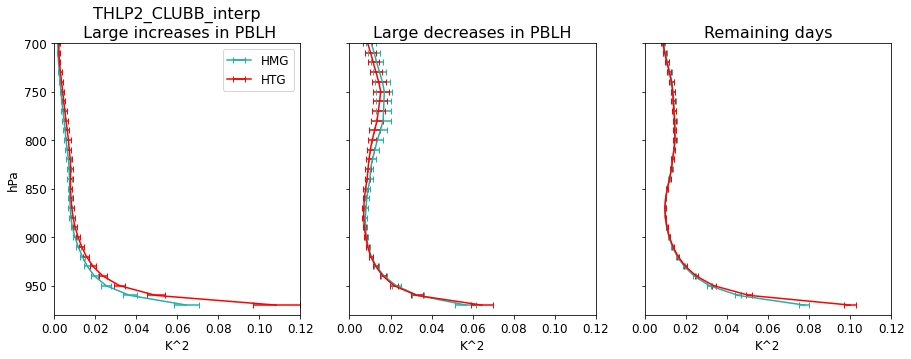

In [168]:
plotProfiles_meanOverHours(highPct_ensHMG, highPct_ensHTG, 
                           lowPct_ensHMG,  lowPct_ensHTG,
                           restOfDays_ensHMG, restOfDays_ensHTG,
                          'THLP2_CLUBB_interp',
                           # 12, 18,  # Start hr, end hr
                           14, 17,
                           0,       # Min x value
                           0.12,     # Max x value
                           700)     # Max level 


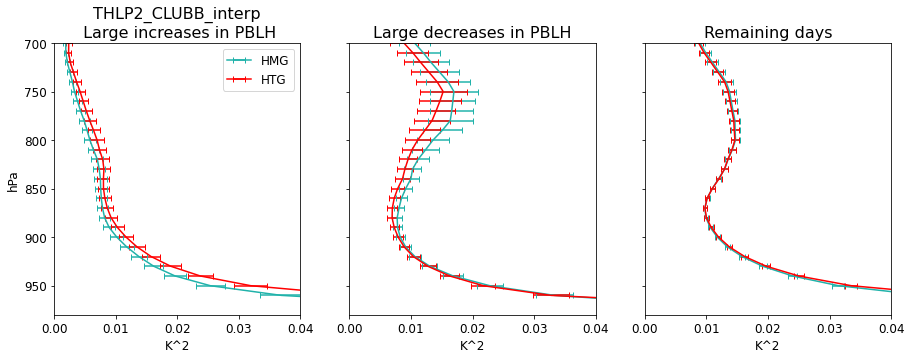

In [169]:
plotProfiles_meanOverHours(highPct_ensHMG, highPct_ensHTG, 
                           lowPct_ensHMG,  lowPct_ensHTG,
                           restOfDays_ensHMG, restOfDays_ensHTG,
                          'THLP2_CLUBB_interp',
                           # 12, 18,  # Start hr, end hr
                           14, 17,
                           0,       # Min x value
                           0.04,    # Max x value
                           700)     # Max level 


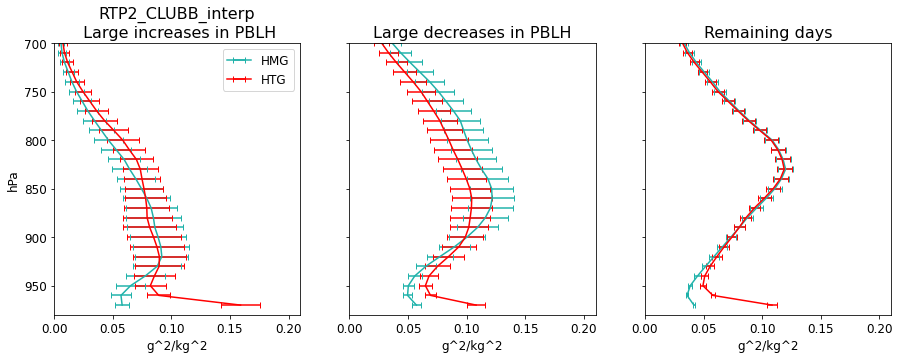

In [170]:
plotProfiles_meanOverHours(highPct_ensHMG, highPct_ensHTG, 
                           lowPct_ensHMG,  lowPct_ensHTG,
                           restOfDays_ensHMG, restOfDays_ensHTG,
                          'RTP2_CLUBB_interp',
                           # 12, 18,  # Start hr, end hr
                           14, 17,                           
                           0,       # Min x value
                           0.21,     # Max x value
                           700)     # Max level 


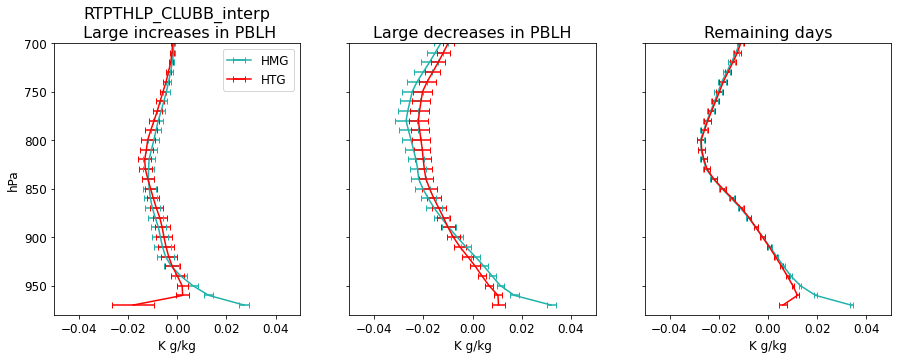

In [171]:
plotProfiles_meanOverHours(highPct_ensHMG, highPct_ensHTG, 
                           lowPct_ensHMG,  lowPct_ensHTG,
                           restOfDays_ensHMG, restOfDays_ensHTG,
                          'RTPTHLP_CLUBB_interp',
                           # 12, 18,  # Start hr, end hr
                           14, 17,
                           -0.05,       # Min x value
                           0.05,     # Max x value
                           700)     # Max level 


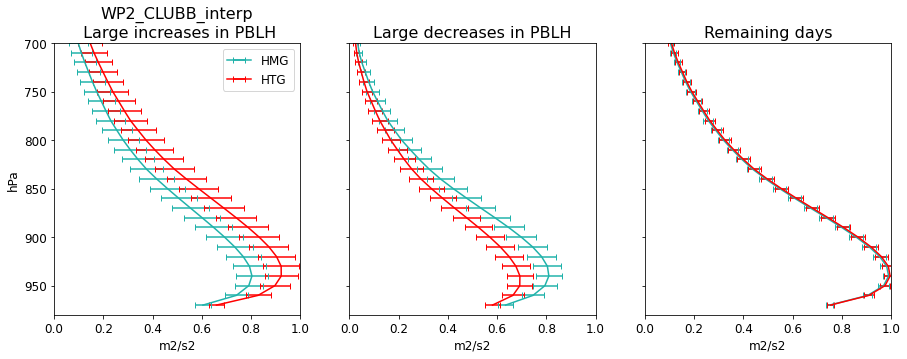

In [172]:
plotProfiles_meanOverHours(highPct_ensHMG, highPct_ensHTG, 
                           lowPct_ensHMG,  lowPct_ensHTG,
                           restOfDays_ensHMG, restOfDays_ensHTG,
                          'WP2_CLUBB_interp',
                           # 12, 18,  # Start hr, end hr
                           14, 17,                           
                           0,       # Min x value
                           1.0,     # Max x value
                           700)     # Max level


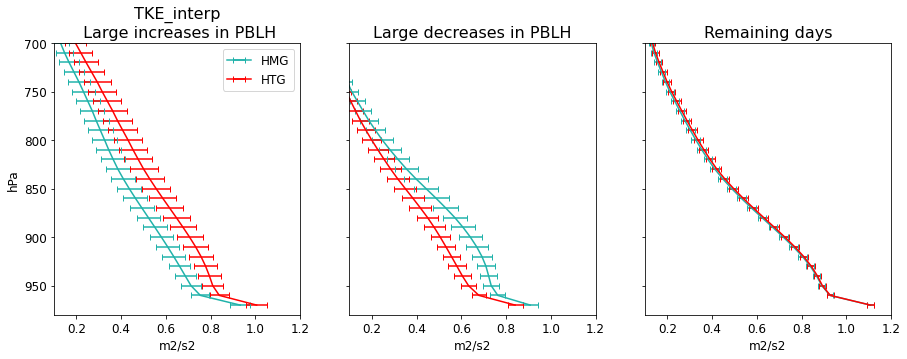

In [173]:
plotProfiles_meanOverHours(highPct_ensHMG, highPct_ensHTG, 
                           lowPct_ensHMG,  lowPct_ensHTG,
                           restOfDays_ensHMG, restOfDays_ensHTG,
                          'TKE_interp',
                           12, 18,  # Start hr, end hr
                           0.1,       # Min x value
                           1.2,     # Max x value
                           700)     # Max level



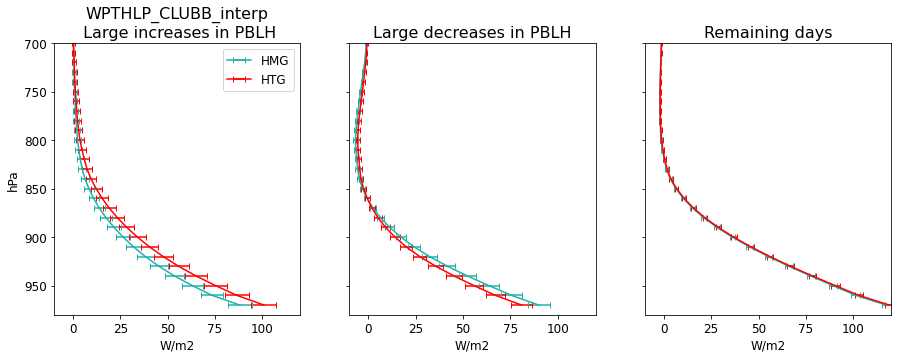

In [174]:
plotProfiles_meanOverHours(highPct_ensHMG, highPct_ensHTG, 
                           lowPct_ensHMG,  lowPct_ensHTG,
                           restOfDays_ensHMG, restOfDays_ensHTG,
                          'WPTHLP_CLUBB_interp',
                           12, 18,  # Start hr, end hr
                           -10,       # Min x value
                           120,     # Max x value
                           700)     # Max level 

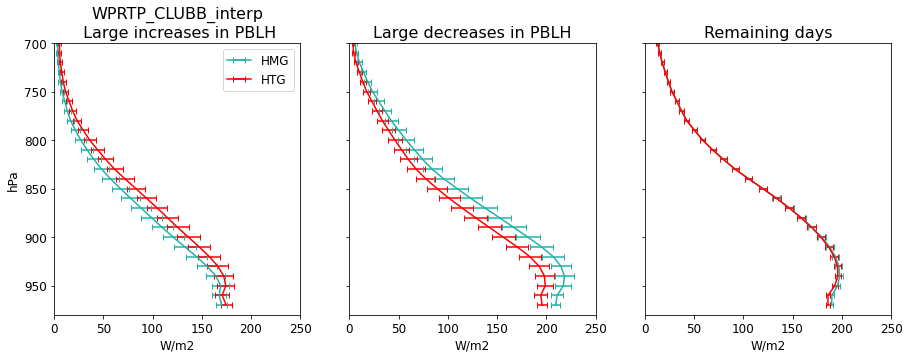

In [175]:
plotProfiles_meanOverHours(highPct_ensHMG, highPct_ensHTG, 
                           lowPct_ensHMG,  lowPct_ensHTG,
                           restOfDays_ensHMG, restOfDays_ensHTG,
                          'WPRTP_CLUBB_interp',
                           12, 18,  # Start hr, end hr
                           0,       # Min x value
                           250,     # Max x value
                           700)     # Max level 


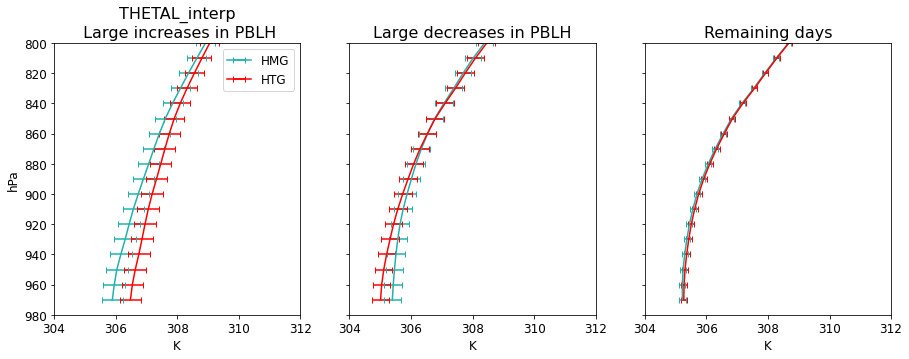

In [176]:
plotProfiles_meanOverHours(highPct_ensHMG, highPct_ensHTG, 
                           lowPct_ensHMG,  lowPct_ensHTG,
                           restOfDays_ensHMG, restOfDays_ensHTG,
                          'THETAL_interp',
                           12, 18,  # Start hr, end hr
                           304,     # Min x value
                           312,     # Max x value
                           800)     # Max level 


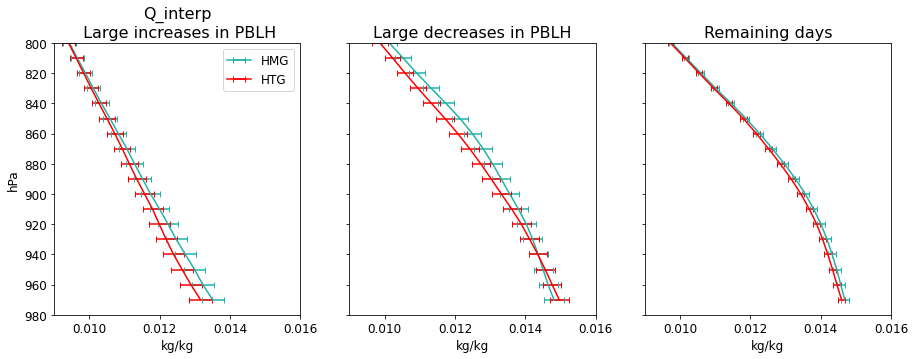

In [177]:
plotProfiles_meanOverHours(highPct_ensHMG, highPct_ensHTG, 
                           lowPct_ensHMG,  lowPct_ensHTG,
                           restOfDays_ensHMG, restOfDays_ensHTG,
                          'Q_interp',
                           12, 18,  # Start hr, end hr
                           0.009,     # Min x value
                           0.016,     # Max x value
                           800)     # Max level 


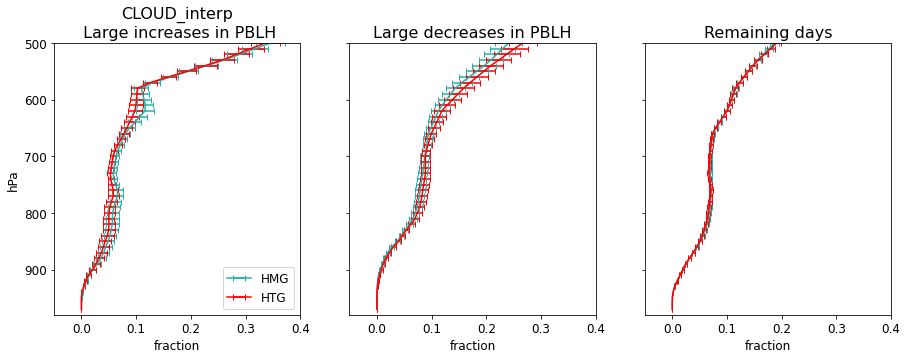

In [178]:
plotProfiles_meanOverHours(highPct_ensHMG, highPct_ensHTG, 
                           lowPct_ensHMG,  lowPct_ensHTG,
                           restOfDays_ensHMG, restOfDays_ensHTG,
                          'CLOUD_interp',
                           12, 18,  # Start hr, end hr
                           -0.05,     # Min x value
                           0.4,     # Max x value
                           500)     # Max level 


## New way of isolating response (per ensemble member, option to use a vertical avg)

In [8]:
botLev = 960
topLev = 800

startHr = 12 
endHr   = 18 

iHours = np.where( (ensHMG['time.hour']>=startHr) & (ensHMG['time.hour']<=endHr) )[0]
iLevs  = np.where( (ensHMG['levInterp']<=botLev)  & (ensHMG['levInterp']>=topLev))[0]

# For each date, get the mean value over the selected time period 
# ensHMG_sel = ensHMG.isel(time=iHours, levInterp=iLevs)
# ensHTG_sel = ensHTG.isel(time=iHours, levInterp=iLevs)

ensHMG_sel = ensHMG.isel(time=iHours)
ensHTG_sel = ensHTG.isel(time=iHours)

## Get mean over each day at these levels
ensHMG_sel_dayMean    = ensHMG_sel.groupby('year_month_day').mean(dim=['time','levInterp'])
ensHTG_sel_dayMean    = ensHTG_sel.groupby('year_month_day').mean(dim=['time','levInterp'])




In [9]:
## Get ens mean
ensHMG_sel_ensMean = ensHMG_sel_dayMean.groupby('year_month_day').mean(dim=['case'])
ensHTG_sel_ensMean = ensHTG_sel_dayMean.groupby('year_month_day').mean(dim=['case'])


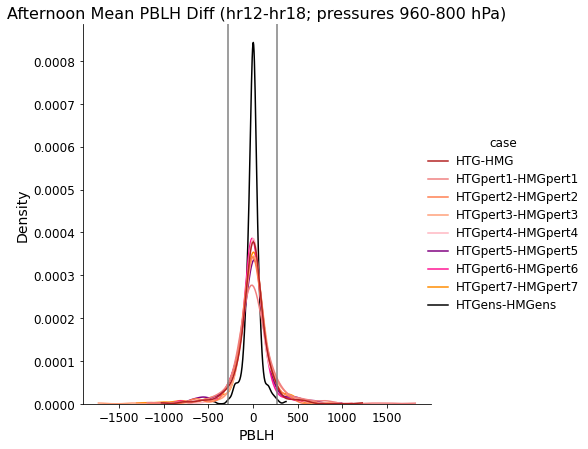

In [10]:
# varSel = 'THLP2_CLUBB_interp'
varSel = 'PBLH'

diffHTG_mean = ensHTG_sel_ensMean[varSel] - ensHMG_sel_ensMean[varSel]


## Get differences per ensemble 
ensHMG_var = ensHMG_sel_dayMean[varSel]
ensHTG_var = ensHTG_sel_dayMean[varSel]

diffHTG_pert00 = ensHTG_var.isel(case=np.where(ensHTG_var.case.values=='HTG')[0]).values-ensHMG_var.isel(case=np.where(ensHMG_var.case.values=='HMG')[0]).values
diffHTG_pert01 = ensHTG_var.isel(case=np.where(ensHTG_var.case.values=='HTG_pert01')[0]).values-ensHMG_var.isel(case=np.where(ensHMG_var.case.values=='HMG_pert01')[0]).values
diffHTG_pert02 = ensHTG_var.isel(case=np.where(ensHTG_var.case.values=='HTG_pert02')[0]).values-ensHMG_var.isel(case=np.where(ensHMG_var.case.values=='HMG_pert02')[0]).values
diffHTG_pert03 = ensHTG_var.isel(case=np.where(ensHTG_var.case.values=='HTG_pert03')[0]).values-ensHMG_var.isel(case=np.where(ensHMG_var.case.values=='HMG_pert03')[0]).values
diffHTG_pert04 = ensHTG_var.isel(case=np.where(ensHTG_var.case.values=='HTG_pert04')[0]).values-ensHMG_var.isel(case=np.where(ensHMG_var.case.values=='HMG_pert04')[0]).values
diffHTG_pert05 = ensHTG_var.isel(case=np.where(ensHTG_var.case.values=='HTG_pert05')[0]).values-ensHMG_var.isel(case=np.where(ensHMG_var.case.values=='HMG_pert05')[0]).values
diffHTG_pert06 = ensHTG_var.isel(case=np.where(ensHTG_var.case.values=='HTG_pert06')[0]).values-ensHMG_var.isel(case=np.where(ensHMG_var.case.values=='HMG_pert06')[0]).values
diffHTG_pert07 = ensHTG_var.isel(case=np.where(ensHTG_var.case.values=='HTG_pert07')[0]).values-ensHMG_var.isel(case=np.where(ensHMG_var.case.values=='HMG_pert07')[0]).values


# Define dataframe
dfReal = pd.concat(axis=0, ignore_index=True, objs=[
     pd.DataFrame.from_dict({varSel: np.squeeze(diffHTG_pert00),          'case': 'HTG-HMG'}), 
     pd.DataFrame.from_dict({varSel: np.squeeze(diffHTG_pert01),          'case': 'HTGpert1-HMGpert1'}),
     pd.DataFrame.from_dict({varSel: np.squeeze(diffHTG_pert02),          'case': 'HTGpert2-HMGpert2'}),
     pd.DataFrame.from_dict({varSel: np.squeeze(diffHTG_pert03),          'case': 'HTGpert3-HMGpert3'}),
     pd.DataFrame.from_dict({varSel: np.squeeze(diffHTG_pert04),          'case': 'HTGpert4-HMGpert4'}),
     pd.DataFrame.from_dict({varSel: np.squeeze(diffHTG_pert05),          'case': 'HTGpert5-HMGpert5'}), 
     pd.DataFrame.from_dict({varSel: np.squeeze(diffHTG_pert06),          'case': 'HTGpert6-HMGpert6'}),
     pd.DataFrame.from_dict({varSel: np.squeeze(diffHTG_pert07),          'case': 'HTGpert7-HMGpert7'}),
     pd.DataFrame.from_dict({varSel: np.squeeze(diffHTG_mean),            'case': 'HTGens-HMGens'}), 
])

# Make plot 
g = sns.displot(dfReal, x=varSel, hue='case', kind='kde', height=6, cut=0, 
                palette=['firebrick','lightcoral','coral','lightsalmon','lightpink','purple','deeppink','darkorange','k'])

g.ax.set_title("Afternoon Mean "+varSel+" Diff (hr"+str(startHr)+"-hr"+str(endHr)+"; pressures "+str(botLev)+"-"+str(topLev)+" hPa)", fontsize=16 ) 
g.ax.set_xlabel(varSel,fontsize=14)
g.ax.set_ylabel('Density',fontsize=14)
g.ax.tick_params(axis='both', labelsize= 12)
plt.setp(g._legend.get_title(), fontsize=12)
plt.setp(g._legend.get_texts(), fontsize=12)

upperLim = np.nanpercentile(dfReal[varSel].values, 95)
lowerLim = np.nanpercentile(dfReal[varSel].values, 5)
plt.axvline(lowerLim,color='grey')
plt.axvline(upperLim,color='grey')

plt.show()


In [67]:
## Get list of dates in string form
strDates = []

for iDate in range(len(ensHMG_sel_dayMean.year_month_day.values)):
    yr_sel  = ensHMG_sel_dayMean.year_month_day_level_0[iDate]
    mon_sel = ensHMG_sel_dayMean.year_month_day_level_1[iDate]
    day_sel = ensHMG_sel_dayMean.year_month_day_level_2[iDate]
    
    strDates = np.append(strDates, datetime.date(yr_sel,mon_sel,day_sel))

    
# Get year delineation 
yrStart =[]

for iDate in range(len(strDates)-1):
    if strDates[iDate].year==(strDates[iDate+1].year)-1:
        
        yrStart = np.append(yrStart, iDate+1)


In [11]:
upperLim = np.nanpercentile(dfReal[varSel].values, 95)
lowerLim = np.nanpercentile(dfReal[varSel].values, 5)

print('Top percentile: ', upperLim)
print('Bottom percentile: ', lowerLim)

iHigh_realHTG00  = np.where(diffHTG_pert00   >= upperLim)[0]
iLow_realHTG00   = np.where(diffHTG_pert00   <= lowerLim)[0]
print('\nNumber of dates in high threshold for HTG-HMG: %i' % len(iHigh_realHTG00))
print('Number of dates in low  threshold for HTG-HMG: %i' % len(iLow_realHTG00))

iHigh_realHTG01  = np.where(diffHTG_pert01   >= upperLim)[0]
iLow_realHTG01   = np.where(diffHTG_pert01   <= lowerLim)[0]
print('\nNumber of dates in high threshold for HTG-HMG pert01: %i' % len(iHigh_realHTG01))
print('Number of dates in low  threshold for HTG-HMG pert01: %i' % len(iLow_realHTG01))

iHigh_realHTG02  = np.where(diffHTG_pert02   >= upperLim)[0]
iLow_realHTG02   = np.where(diffHTG_pert02   <= lowerLim)[0]
print('\nNumber of dates in high threshold for HTG-HMG pert02: %i' % len(iHigh_realHTG02))
print('Number of dates in low  threshold for HTG-HMG pert02: %i' % len(iLow_realHTG02))

iHigh_realHTG03  = np.where(diffHTG_pert03   >= upperLim)[0]
iLow_realHTG03   = np.where(diffHTG_pert03   <= lowerLim)[0]
print('\nNumber of dates in high threshold for HTG-HMG pert03: %i' % len(iHigh_realHTG03))
print('Number of dates in low  threshold for HTG-HMG pert03: %i' % len(iLow_realHTG03))

iHigh_realHTG04  = np.where(diffHTG_pert04   >= upperLim)[0]
iLow_realHTG04   = np.where(diffHTG_pert04   <= lowerLim)[0]
print('\nNumber of dates in high threshold for HTG-HMG pert04: %i' % len(iHigh_realHTG04))
print('Number of dates in low  threshold for HTG-HMG pert04: %i' % len(iLow_realHTG04))

iHigh_realHTG05  = np.where(diffHTG_pert05   >= upperLim)[0]
iLow_realHTG05   = np.where(diffHTG_pert05   <= lowerLim)[0]
print('\nNumber of dates in high threshold for HTG-HMG pert05: %i' % len(iHigh_realHTG05))
print('Number of dates in low  threshold for HTG-HMG pert05: %i' % len(iLow_realHTG05))

iHigh_realHTG06  = np.where(diffHTG_pert06   >= upperLim)[0]
iLow_realHTG06   = np.where(diffHTG_pert06   <= lowerLim)[0]
print('\nNumber of dates in high threshold for HTG-HMG pert06: %i' % len(iHigh_realHTG06))
print('Number of dates in low  threshold for HTG-HMG pert06: %i' % len(iLow_realHTG06))


iHigh_realHTG07  = np.where(diffHTG_pert07   >= upperLim)[0]
iLow_realHTG07   = np.where(diffHTG_pert07   <= lowerLim)[0]
print('\nNumber of dates in high threshold for HTG-HMG pert07: %i' % len(iHigh_realHTG07))
print('Number of dates in low  threshold for HTG-HMG pert07: %i' % len(iLow_realHTG07))




Top percentile:  270.4004669189453
Bottom percentile:  -275.1286926269531

Number of dates in high threshold for HTG-HMG: 12
Number of dates in low  threshold for HTG-HMG: 21

Number of dates in high threshold for HTG-HMG pert01: 29
Number of dates in low  threshold for HTG-HMG pert01: 24

Number of dates in high threshold for HTG-HMG pert02: 15
Number of dates in low  threshold for HTG-HMG pert02: 18

Number of dates in high threshold for HTG-HMG pert03: 24
Number of dates in low  threshold for HTG-HMG pert03: 14

Number of dates in high threshold for HTG-HMG pert04: 25
Number of dates in low  threshold for HTG-HMG pert04: 11

Number of dates in high threshold for HTG-HMG pert05: 19
Number of dates in low  threshold for HTG-HMG pert05: 23

Number of dates in high threshold for HTG-HMG pert06: 12
Number of dates in low  threshold for HTG-HMG pert06: 18

Number of dates in high threshold for HTG-HMG pert07: 17
Number of dates in low  threshold for HTG-HMG pert07: 25


In [62]:
ensHMG_sel_dayMean.isel(year_month_day=iHigh_realHTG00)

<xarray.Dataset>
Dimensions:                 (case: 8, ilev: 65, lat: 1, lat,: 1, lev: 64, lon: 1, year_month_day: 12)
Coordinates:
  * case                    (case) object 'HMG' 'HMG_pert01' ... 'HMG_pert07'
  * lat                     (lat) float64 36.61
  * lon                     (lon) float64 262.5
  * lev                     (lev) float64 2.949 4.338 6.313 ... 988.8 996.3
  * ilev                    (ilev) float64 2.255 3.643 5.032 ... 992.6 1e+03
  * year_month_day          (year_month_day) MultiIndex
  - year_month_day_level_0  (year_month_day) int64 2015 2015 2015 ... 2018 2018
  - year_month_day_level_1  (year_month_day) int64 6 7 8 7 7 8 6 8 8 8 8 8
  - year_month_day_level_2  (year_month_day) int64 10 5 9 4 25 12 22 4 8 20 7 27
Dimensions without coordinates: lat,
Data variables:
    ntrk                    (year_month_day, case) float64 1.0 1.0 ... 1.0 1.0
    ntrn                    (year_month_day, case) float64 1.0 1.0 ... 1.0 1.0
    ntrm                    (year_month_day, case) float64 1.0 1.0 ... 1.0 1.0
    gw                      (year_month_day, case, lat) float64 2.0 2.0 ... 2.0
    hyam                    (year_month_day, case, lev) float64 0.002949 ... 0.0
    hybm                    (year_month_day, case, lev) float64 0.0 ... 0.9963
    P0                      (year_month_day, case) float64 1e+05 1e+05 ... 1e+05
    hyai                    (year_month_day, case, ilev) float64 0.002255 ......
    hybi                    (year_month_day, case, ilev) float64 0.0 0.0 ... 1.0
    date                    (year_month_day, case) float64 2.015e+07 ... 2.01...
    datesec                 (year_month_day, case) float64 7.394e+04 ... 7.39...
    ndbase                  (year_month_day, case) float64 0.0 0.0 ... 0.0 0.0
    nsbase                  (year_month_day, case) float64 0.0 0.0 ... 0.0 0.0
    nbdate                  (year_month_day, case) float64 2.015e+07 ... 2.01...
    nbsec                   (year_month_day, case) float64 8.458e+04 ... 8.45...
    mdt                     (year_month_day, case) float64 300.0 300.0 ... 300.0
    ndcur                   (year_month_day, case) float64 9.083 9.083 ... 87.08
    nscur                   (year_month_day, case) float64 6.855e+04 ... 6.85...
    co2vmr                  (year_month_day, case) float64 0.0003719 ... 0.00...
    ch4vmr                  (year_month_day, case) float64 1.84e-06 ... 1.838...
    n2ovmr                  (year_month_day, case) float64 3.159e-07 ... 3.15...
    f11vmr                  (year_month_day, case) float64 7.085e-10 ... 7.07...
    f12vmr                  (year_month_day, case) float64 5.413e-10 ... 5.41...
    sol_tsi                 (year_month_day, case) float64 -1.0 -1.0 ... -1.0
    nsteph                  (year_month_day, case) float64 2.844e+03 ... 2.53...
    CAPE                    (year_month_day, case, lat, lon) float32 0.0 ... 0.0
    CDNUMC                  (year_month_day, case, lat, lon) float32 9.789e+0...
    CLDBOT                  (year_month_day, case, lat, lon) float32 1.0 ... 1.0
    CLDLOW                  (year_month_day, case, lat, lon) float32 6.612e-0...
    CLDMED                  (year_month_day, case, lat, lon) float32 0.000102...
    CLDTOP                  (year_month_day, case, lat, lon) float32 64.0 ......
    CLDTOT                  (year_month_day, case, lat, lon) float32 0.999 .....
    CLOUDCOVER_CLUBB        (year_month_day, case, ilev, lat, lon) float32 0....
    CLOUDFRAC_CLUBB         (year_month_day, case, lev, lat, lon) float32 0.0...
    GCLDLWP                 (year_month_day, case, lev, lat, lon) float32 0.0...
    LHFLX                   (year_month_day, case, lat, lon) float32 124.6 .....
    OMEGA                   (year_month_day, case, lev, lat, lon) float32 0.0...
    PBLH                    (year_month_day, case, lat, lon) float32 3.446e+0...
    PHIS                    (year_month_day, case, lat, lon) float32 0.0 ... 0.0
    PRECC                   (year_month_day, case, la

In [68]:
strDates

array([datetime.date(2015, 6, 3), datetime.date(2015, 6, 4),
       datetime.date(2015, 6, 5), datetime.date(2015, 6, 6),
       datetime.date(2015, 6, 7), datetime.date(2015, 6, 8),
       datetime.date(2015, 6, 9), datetime.date(2015, 6, 10),
       datetime.date(2015, 6, 11), datetime.date(2015, 6, 12),
       datetime.date(2015, 6, 13), datetime.date(2015, 6, 14),
       datetime.date(2015, 6, 15), datetime.date(2015, 6, 16),
       datetime.date(2015, 6, 17), datetime.date(2015, 6, 18),
       datetime.date(2015, 6, 19), datetime.date(2015, 6, 20),
       datetime.date(2015, 6, 21), datetime.date(2015, 6, 22),
       datetime.date(2015, 6, 23), datetime.date(2015, 6, 24),
       datetime.date(2015, 6, 25), datetime.date(2015, 6, 26),
       datetime.date(2015, 6, 27), datetime.date(2015, 6, 28),
       datetime.date(2015, 6, 29), datetime.date(2015, 6, 30),
       datetime.date(2015, 7, 1), datetime.date(2015, 7, 2),
       datetime.date(2015, 7, 3), datetime.date(2015, 7, 4),
   

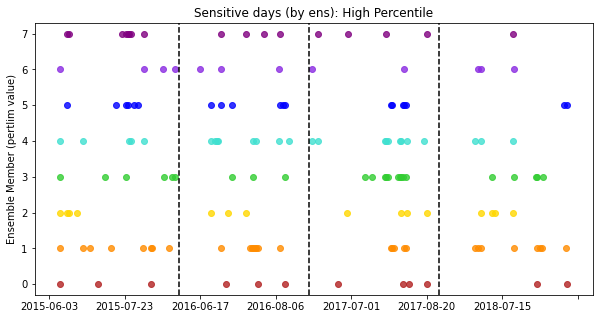

In [85]:
fig,axs  = plt.subplots(1,1, figsize=(10,5))

# axs.plot(strDates, np.zeros(len(strDates)),'k-')
axs.plot(np.arange(len(strDates))[iHigh_realHTG00], np.zeros(len(strDates[iHigh_realHTG00])),'o',color='firebrick',alpha=0.8, label='HTG')
axs.plot(np.arange(len(strDates))[iHigh_realHTG01], np.ones(len(strDates[iHigh_realHTG01])),'o',color='darkorange',alpha=0.8, label='HTGpert1')
axs.plot(np.arange(len(strDates))[iHigh_realHTG02], np.ones(len(strDates[iHigh_realHTG02]))*2,'o',color='gold',alpha=0.8, label='HTGpert2')
axs.plot(np.arange(len(strDates))[iHigh_realHTG03], np.ones(len(strDates[iHigh_realHTG03]))*3,'o',color='limegreen',alpha=0.8, label='HTGpert3')
axs.plot(np.arange(len(strDates))[iHigh_realHTG04], np.ones(len(strDates[iHigh_realHTG04]))*4,'o',color='turquoise',alpha=0.8, label='HTGpert4')
axs.plot(np.arange(len(strDates))[iHigh_realHTG05], np.ones(len(strDates[iHigh_realHTG05]))*5,'o',color='blue',alpha=0.8, label='HTGpert5')
axs.plot(np.arange(len(strDates))[iHigh_realHTG06], np.ones(len(strDates[iHigh_realHTG06]))*6,'o',color='blueviolet',alpha=0.8, label='HTGpert6')
axs.plot(np.arange(len(strDates))[iHigh_realHTG07], np.ones(len(strDates[iHigh_realHTG07]))*7,'o',color='purple',alpha=0.8, label='HTGpert7')

for iYr in range(len(yrStart)):
    axs.axvline(yrStart[iYr], color='k',linestyle='--')

axs.set_title('Sensitive days (by ens): High Percentile')
axs.set_ylabel('Ensemble Member (pertlim value)')
axs.set_ylim([-0.3, 7.3])

# Control tick labels
xTicks       = axs.get_xticks()
dates_xticks = strDates[xTicks.astype(int)[:-2]]
axs.set_xticklabels(dates_xticks)

plt.show()

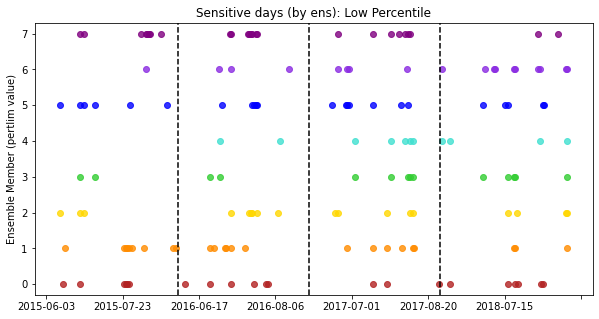

In [86]:
fig,axs  = plt.subplots(1,1, figsize=(10,5))

# axs.plot(strDates, np.zeros(len(strDates)),'k-')
axs.plot(np.arange(len(strDates))[iLow_realHTG00], np.zeros(len(strDates[iLow_realHTG00])),'o',color='firebrick',alpha=0.8, label='HTG')
axs.plot(np.arange(len(strDates))[iLow_realHTG01], np.ones(len(strDates[iLow_realHTG01])),'o',color='darkorange',alpha=0.8, label='HTGpert1')
axs.plot(np.arange(len(strDates))[iLow_realHTG02], np.ones(len(strDates[iLow_realHTG02]))*2,'o',color='gold',alpha=0.8, label='HTGpert2')
axs.plot(np.arange(len(strDates))[iLow_realHTG03], np.ones(len(strDates[iLow_realHTG03]))*3,'o',color='limegreen',alpha=0.8, label='HTGpert3')
axs.plot(np.arange(len(strDates))[iLow_realHTG04], np.ones(len(strDates[iLow_realHTG04]))*4,'o',color='turquoise',alpha=0.8, label='HTGpert4')
axs.plot(np.arange(len(strDates))[iLow_realHTG05], np.ones(len(strDates[iLow_realHTG05]))*5,'o',color='blue',alpha=0.8, label='HTGpert5')
axs.plot(np.arange(len(strDates))[iLow_realHTG06], np.ones(len(strDates[iLow_realHTG06]))*6,'o',color='blueviolet',alpha=0.8, label='HTGpert6')
axs.plot(np.arange(len(strDates))[iLow_realHTG07], np.ones(len(strDates[iLow_realHTG07]))*7,'o',color='purple',alpha=0.8, label='HTGpert7')

for iYr in range(len(yrStart)):
    axs.axvline(yrStart[iYr], color='k',linestyle='--')

axs.set_title('Sensitive days (by ens): Low Percentile')
axs.set_ylabel('Ensemble Member (pertlim value)')
axs.set_ylim([-0.3, 7.3])

# Control tick labels
xTicks       = axs.get_xticks()
dates_xticks = strDates[xTicks.astype(int)[:-2]]
axs.set_xticklabels(dates_xticks)

plt.show()

In [84]:
## Get indices of dates that are consistent...

listHigh_real = list(set(iHigh_realHTG00) & set(iHigh_realHTG01) & set(iHigh_realHTG02) & set(iHigh_realHTG03) & set(iHigh_realHTG04) & set(iHigh_realHTG05) & set(iHigh_realHTG06) & set(iHigh_realHTG07) )
listLow_real = list(set(iLow_realHTG00) & set(iLow_realHTG01) & set(iLow_realHTG02) & set(iLow_realHTG03) & set(iLow_realHTG04) & set(iLow_realHTG05) & set(iLow_realHTG06) & set(iLow_realHTG07) )


print('Num days consistent for high percentile (real sfc): ', len(listHigh_real))
print('Num days consistent for low  percentile (real sfc): ', len(listLow_real))





Num days consistent for high percentile (real sfc):  0
Num days consistent for low  percentile (real sfc):  0


In [12]:
highPct_ensHMGpert00    = getTimes_basedOnDates(ensHMG.isel(case=np.where(ensHMG.case.values=='HMG')[0]),     
                                                ensHMG_sel_dayMean.isel(year_month_day=iHigh_realHTG00))

highPct_ensHTGpert00    = getTimes_basedOnDates(ensHTG.isel(case=np.where(ensHTG.case.values=='HTG')[0]),     
                                                ensHTG_sel_dayMean.isel(year_month_day=iHigh_realHTG00))


lowPct_ensHMGpert00    = getTimes_basedOnDates(ensHMG.isel(case=np.where(ensHMG.case.values=='HMG')[0]),     
                                                ensHMG_sel_dayMean.isel(year_month_day=iLow_realHTG00))

lowPct_ensHTGpert00    = getTimes_basedOnDates(ensHTG.isel(case=np.where(ensHTG.case.values=='HTG')[0]),     
                                                ensHTG_sel_dayMean.isel(year_month_day=iLow_realHTG00))


# - - - - - - - - - - - - pert01  - - - - - - - - - - - - 
highPct_ensHMGpert01    = getTimes_basedOnDates(ensHMG.isel(case=np.where(ensHMG.case.values=='HMG_pert01')[0]),     
                                                ensHMG_sel_dayMean.isel(year_month_day=iHigh_realHTG01))

highPct_ensHTGpert01    = getTimes_basedOnDates(ensHTG.isel(case=np.where(ensHTG.case.values=='HTG_pert01')[0]),     
                                                ensHTG_sel_dayMean.isel(year_month_day=iHigh_realHTG01))


lowPct_ensHMGpert01    = getTimes_basedOnDates(ensHMG.isel(case=np.where(ensHMG.case.values=='HMG_pert01')[0]),     
                                                ensHMG_sel_dayMean.isel(year_month_day=iLow_realHTG01))

lowPct_ensHTGpert01    = getTimes_basedOnDates(ensHTG.isel(case=np.where(ensHTG.case.values=='HTG_pert01')[0]),     
                                                ensHTG_sel_dayMean.isel(year_month_day=iLow_realHTG01))


# - - - - - - - - - - - - pert02  - - - - - - - - - - - - 
highPct_ensHMGpert02    = getTimes_basedOnDates(ensHMG.isel(case=np.where(ensHMG.case.values=='HMG_pert02')[0]),     
                                                ensHMG_sel_dayMean.isel(year_month_day=iHigh_realHTG02))

highPct_ensHTGpert02    = getTimes_basedOnDates(ensHTG.isel(case=np.where(ensHTG.case.values=='HTG_pert02')[0]),     
                                                ensHTG_sel_dayMean.isel(year_month_day=iHigh_realHTG02))


lowPct_ensHMGpert02    = getTimes_basedOnDates(ensHMG.isel(case=np.where(ensHMG.case.values=='HMG_pert02')[0]),     
                                                ensHMG_sel_dayMean.isel(year_month_day=iLow_realHTG02))

lowPct_ensHTGpert02    = getTimes_basedOnDates(ensHTG.isel(case=np.where(ensHTG.case.values=='HTG_pert02')[0]),     
                                                ensHTG_sel_dayMean.isel(year_month_day=iLow_realHTG02))


# - - - - - - - - - - - - pert03  - - - - - - - - - - - - 
highPct_ensHMGpert03    = getTimes_basedOnDates(ensHMG.isel(case=np.where(ensHMG.case.values=='HMG_pert03')[0]),     
                                                ensHMG_sel_dayMean.isel(year_month_day=iHigh_realHTG03))

highPct_ensHTGpert03    = getTimes_basedOnDates(ensHTG.isel(case=np.where(ensHTG.case.values=='HTG_pert03')[0]),     
                                                ensHTG_sel_dayMean.isel(year_month_day=iHigh_realHTG03))


lowPct_ensHMGpert03    = getTimes_basedOnDates(ensHMG.isel(case=np.where(ensHMG.case.values=='HMG_pert03')[0]),     
                                                ensHMG_sel_dayMean.isel(year_month_day=iLow_realHTG03))

lowPct_ensHTGpert03    = getTimes_basedOnDates(ensHTG.isel(case=np.where(ensHTG.case.values=='HTG_pert03')[0]),     
                                                ensHTG_sel_dayMean.isel(year_month_day=iLow_realHTG03))


# - - - - - - - - - - - - pert04  - - - - - - - - - - - - 
highPct_ensHMGpert04    = getTimes_basedOnDates(ensHMG.isel(case=np.where(ensHMG.case.values=='HMG_pert04')[0]),     
                                                ensHMG_sel_dayMean.isel(year_month_day=iHigh_realHTG04))

highPct_ensHTGpert04    = getTimes_basedOnDates(ensHTG.isel(case=np.where(ensHTG.case.values=='HTG_pert04')[0]),     
                                                ensHTG_sel_dayMean.isel(year_month_day=iHigh_realHTG04))


lowPct_ensHMGpert04    = getTimes_basedOnDates(ensHMG.isel(case=np.where(ensHMG.case.values=='HMG_pert04')[0]),     
                                                ensHMG_sel_dayMean.isel(year_month_day=iLow_realHTG04))

lowPct_ensHTGpert04    = getTimes_basedOnDates(ensHTG.isel(case=np.where(ensHTG.case.values=='HTG_pert04')[0]),     
                                                ensHTG_sel_dayMean.isel(year_month_day=iLow_realHTG04))


# - - - - - - - - - - - - pert05  - - - - - - - - - - - - 
highPct_ensHMGpert05    = getTimes_basedOnDates(ensHMG.isel(case=np.where(ensHMG.case.values=='HMG_pert05')[0]),     
                                                ensHMG_sel_dayMean.isel(year_month_day=iHigh_realHTG05))

highPct_ensHTGpert05    = getTimes_basedOnDates(ensHTG.isel(case=np.where(ensHTG.case.values=='HTG_pert05')[0]),     
                                                ensHTG_sel_dayMean.isel(year_month_day=iHigh_realHTG05))


lowPct_ensHMGpert05    = getTimes_basedOnDates(ensHMG.isel(case=np.where(ensHMG.case.values=='HMG_pert05')[0]),     
                                                ensHMG_sel_dayMean.isel(year_month_day=iLow_realHTG05))

lowPct_ensHTGpert05    = getTimes_basedOnDates(ensHTG.isel(case=np.where(ensHTG.case.values=='HTG_pert05')[0]),     
                                                ensHTG_sel_dayMean.isel(year_month_day=iLow_realHTG05))


# - - - - - - - - - - - - pert06  - - - - - - - - - - - - 
highPct_ensHMGpert06    = getTimes_basedOnDates(ensHMG.isel(case=np.where(ensHMG.case.values=='HMG_pert06')[0]),     
                                                ensHMG_sel_dayMean.isel(year_month_day=iHigh_realHTG06))

highPct_ensHTGpert06    = getTimes_basedOnDates(ensHTG.isel(case=np.where(ensHTG.case.values=='HTG_pert06')[0]),     
                                                ensHTG_sel_dayMean.isel(year_month_day=iHigh_realHTG06))


lowPct_ensHMGpert06    = getTimes_basedOnDates(ensHMG.isel(case=np.where(ensHMG.case.values=='HMG_pert06')[0]),     
                                                ensHMG_sel_dayMean.isel(year_month_day=iLow_realHTG06))

lowPct_ensHTGpert06    = getTimes_basedOnDates(ensHTG.isel(case=np.where(ensHTG.case.values=='HTG_pert06')[0]),     
                                                ensHTG_sel_dayMean.isel(year_month_day=iLow_realHTG06))


# - - - - - - - - - - - - pert07  - - - - - - - - - - - - 
highPct_ensHMGpert07    = getTimes_basedOnDates(ensHMG.isel(case=np.where(ensHMG.case.values=='HMG_pert07')[0]),     
                                                ensHMG_sel_dayMean.isel(year_month_day=iHigh_realHTG07))

highPct_ensHTGpert07    = getTimes_basedOnDates(ensHTG.isel(case=np.where(ensHTG.case.values=='HTG_pert07')[0]),     
                                                ensHTG_sel_dayMean.isel(year_month_day=iHigh_realHTG07))


lowPct_ensHMGpert07    = getTimes_basedOnDates(ensHMG.isel(case=np.where(ensHMG.case.values=='HMG_pert07')[0]),     
                                                ensHMG_sel_dayMean.isel(year_month_day=iLow_realHTG07))

lowPct_ensHTGpert07    = getTimes_basedOnDates(ensHTG.isel(case=np.where(ensHTG.case.values=='HTG_pert07')[0]),     
                                                ensHTG_sel_dayMean.isel(year_month_day=iLow_realHTG07))


In [13]:
## Get hourly means 
hourlyMean_highPct_ensHMGpert00       = highPct_ensHMGpert00.groupby("time.hour").mean(dim=["time"])
hourlyMean_highPct_ensHTGpert00       = highPct_ensHTGpert00.groupby("time.hour").mean(dim=["time"])
hourlyMean_lowPct_ensHMGpert00        = lowPct_ensHMGpert00.groupby("time.hour").mean(dim=["time"])
hourlyMean_lowPct_ensHTGpert00        = lowPct_ensHTGpert00.groupby("time.hour").mean(dim=["time"])

hourlyMean_highPct_ensHMGpert01       = highPct_ensHMGpert01.groupby("time.hour").mean(dim=["time"])
hourlyMean_highPct_ensHTGpert01       = highPct_ensHTGpert01.groupby("time.hour").mean(dim=["time"])
hourlyMean_lowPct_ensHMGpert01        = lowPct_ensHMGpert01.groupby("time.hour").mean(dim=["time"])
hourlyMean_lowPct_ensHTGpert01        = lowPct_ensHTGpert01.groupby("time.hour").mean(dim=["time"])

hourlyMean_highPct_ensHMGpert02       = highPct_ensHMGpert02.groupby("time.hour").mean(dim=["time"])
hourlyMean_highPct_ensHTGpert02       = highPct_ensHTGpert02.groupby("time.hour").mean(dim=["time"])
hourlyMean_lowPct_ensHMGpert02        = lowPct_ensHMGpert02.groupby("time.hour").mean(dim=["time"])
hourlyMean_lowPct_ensHTGpert02        = lowPct_ensHTGpert02.groupby("time.hour").mean(dim=["time"])

hourlyMean_highPct_ensHMGpert03       = highPct_ensHMGpert03.groupby("time.hour").mean(dim=["time"])
hourlyMean_highPct_ensHTGpert03       = highPct_ensHTGpert03.groupby("time.hour").mean(dim=["time"])
hourlyMean_lowPct_ensHMGpert03        = lowPct_ensHMGpert03.groupby("time.hour").mean(dim=["time"])
hourlyMean_lowPct_ensHTGpert03        = lowPct_ensHTGpert03.groupby("time.hour").mean(dim=["time"])

hourlyMean_highPct_ensHMGpert04       = highPct_ensHMGpert04.groupby("time.hour").mean(dim=["time"])
hourlyMean_highPct_ensHTGpert04       = highPct_ensHTGpert04.groupby("time.hour").mean(dim=["time"])
hourlyMean_lowPct_ensHMGpert04        = lowPct_ensHMGpert04.groupby("time.hour").mean(dim=["time"])
hourlyMean_lowPct_ensHTGpert04        = lowPct_ensHTGpert04.groupby("time.hour").mean(dim=["time"])

hourlyMean_highPct_ensHMGpert05       = highPct_ensHMGpert05.groupby("time.hour").mean(dim=["time"])
hourlyMean_highPct_ensHTGpert05       = highPct_ensHTGpert05.groupby("time.hour").mean(dim=["time"])
hourlyMean_lowPct_ensHMGpert05        = lowPct_ensHMGpert05.groupby("time.hour").mean(dim=["time"])
hourlyMean_lowPct_ensHTGpert05        = lowPct_ensHTGpert05.groupby("time.hour").mean(dim=["time"])

hourlyMean_highPct_ensHMGpert06       = highPct_ensHMGpert06.groupby("time.hour").mean(dim=["time"])
hourlyMean_highPct_ensHTGpert06       = highPct_ensHTGpert06.groupby("time.hour").mean(dim=["time"])
hourlyMean_lowPct_ensHMGpert06        = lowPct_ensHMGpert06.groupby("time.hour").mean(dim=["time"])
hourlyMean_lowPct_ensHTGpert06        = lowPct_ensHTGpert06.groupby("time.hour").mean(dim=["time"])

hourlyMean_highPct_ensHMGpert07       = highPct_ensHMGpert07.groupby("time.hour").mean(dim=["time"])
hourlyMean_highPct_ensHTGpert07       = highPct_ensHTGpert07.groupby("time.hour").mean(dim=["time"])
hourlyMean_lowPct_ensHMGpert07        = lowPct_ensHMGpert07.groupby("time.hour").mean(dim=["time"])
hourlyMean_lowPct_ensHTGpert07        = lowPct_ensHTGpert07.groupby("time.hour").mean(dim=["time"])


Text(0.5, 1.0, 'PBLH\n Days with large -delta(PBLH)')

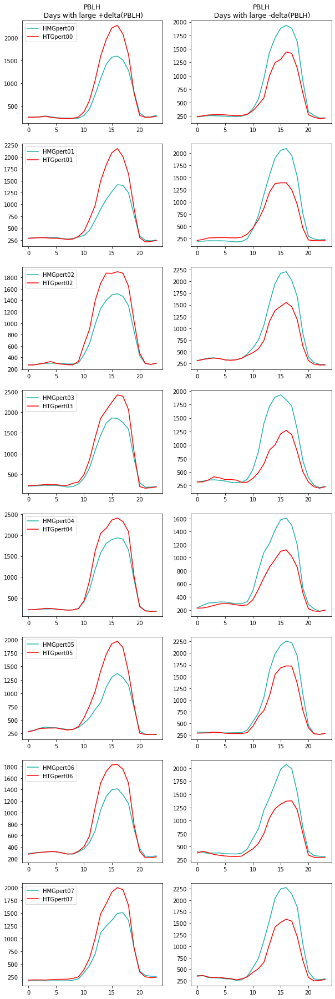

In [14]:
varPlot = 'PBLH'

fig,axs = plt.subplots(8,2, figsize=(10,4*8))
axs     = axs.ravel()

# - - - - - - - - - - - - pert00 - - - - - - - - - - - - 
axs[0].plot(hourlyMean_highPct_ensHMGpert00['hour'].values, np.squeeze(hourlyMean_highPct_ensHMGpert00[varPlot].values), color='lightseagreen', label='HMGpert00')
axs[0].plot(hourlyMean_highPct_ensHTGpert00['hour'].values, np.squeeze(hourlyMean_highPct_ensHTGpert00[varPlot].values), color='red', label='HTGpert00')
axs[0].legend()
axs[1].plot(hourlyMean_lowPct_ensHMGpert00['hour'].values, np.squeeze(hourlyMean_lowPct_ensHMGpert00[varPlot].values), color='lightseagreen', label='HMGpert00')
axs[1].plot(hourlyMean_lowPct_ensHTGpert00['hour'].values, np.squeeze(hourlyMean_lowPct_ensHTGpert00[varPlot].values), color='red', label='HTGpert00')

# - - - - - - - - - - - - pert01 - - - - - - - - - - - - 
axs[2].plot(hourlyMean_highPct_ensHMGpert01['hour'].values, np.squeeze(hourlyMean_highPct_ensHMGpert01[varPlot].values), color='lightseagreen', label='HMGpert01')
axs[2].plot(hourlyMean_highPct_ensHTGpert01['hour'].values, np.squeeze(hourlyMean_highPct_ensHTGpert01[varPlot].values), color='red', label='HTGpert01')
axs[2].legend()
axs[3].plot(hourlyMean_lowPct_ensHMGpert01['hour'].values, np.squeeze(hourlyMean_lowPct_ensHMGpert01[varPlot].values), color='lightseagreen')
axs[3].plot(hourlyMean_lowPct_ensHTGpert01['hour'].values, np.squeeze(hourlyMean_lowPct_ensHTGpert01[varPlot].values), color='red')

# - - - - - - - - - - - - pert02 - - - - - - - - - - - - 
axs[4].plot(hourlyMean_highPct_ensHMGpert02['hour'].values, np.squeeze(hourlyMean_highPct_ensHMGpert02[varPlot].values), color='lightseagreen', label='HMGpert02')
axs[4].plot(hourlyMean_highPct_ensHTGpert02['hour'].values, np.squeeze(hourlyMean_highPct_ensHTGpert02[varPlot].values), color='red', label='HTGpert02')
axs[4].legend()
axs[5].plot(hourlyMean_lowPct_ensHMGpert02['hour'].values, np.squeeze(hourlyMean_lowPct_ensHMGpert02[varPlot].values), color='lightseagreen')
axs[5].plot(hourlyMean_lowPct_ensHTGpert02['hour'].values, np.squeeze(hourlyMean_lowPct_ensHTGpert02[varPlot].values), color='red')

# - - - - - - - - - - - - pert03 - - - - - - - - - - - - 
axs[6].plot(hourlyMean_highPct_ensHMGpert03['hour'].values, np.squeeze(hourlyMean_highPct_ensHMGpert03[varPlot].values), color='lightseagreen', label='HMGpert03')
axs[6].plot(hourlyMean_highPct_ensHTGpert03['hour'].values, np.squeeze(hourlyMean_highPct_ensHTGpert03[varPlot].values), color='red', label='HTGpert03')
axs[6].legend()
axs[7].plot(hourlyMean_lowPct_ensHMGpert03['hour'].values, np.squeeze(hourlyMean_lowPct_ensHMGpert03[varPlot].values), color='lightseagreen')
axs[7].plot(hourlyMean_lowPct_ensHTGpert03['hour'].values, np.squeeze(hourlyMean_lowPct_ensHTGpert03[varPlot].values), color='red')

# - - - - - - - - - - - - pert04 - - - - - - - - - - - - 
axs[8].plot(hourlyMean_highPct_ensHMGpert04['hour'].values, np.squeeze(hourlyMean_highPct_ensHMGpert04[varPlot].values), color='lightseagreen', label='HMGpert04')
axs[8].plot(hourlyMean_highPct_ensHTGpert04['hour'].values, np.squeeze(hourlyMean_highPct_ensHTGpert04[varPlot].values), color='red', label='HTGpert04')
axs[8].legend()
axs[9].plot(hourlyMean_lowPct_ensHMGpert04['hour'].values, np.squeeze(hourlyMean_lowPct_ensHMGpert04[varPlot].values), color='lightseagreen')
axs[9].plot(hourlyMean_lowPct_ensHTGpert04['hour'].values, np.squeeze(hourlyMean_lowPct_ensHTGpert04[varPlot].values), color='red')

# - - - - - - - - - - - - pert05 - - - - - - - - - - - - 
axs[10].plot(hourlyMean_highPct_ensHMGpert05['hour'].values, np.squeeze(hourlyMean_highPct_ensHMGpert05[varPlot].values), color='lightseagreen', label='HMGpert05')
axs[10].plot(hourlyMean_highPct_ensHTGpert05['hour'].values, np.squeeze(hourlyMean_highPct_ensHTGpert05[varPlot].values), color='red', label='HTGpert05')
axs[10].legend()
axs[11].plot(hourlyMean_lowPct_ensHMGpert05['hour'].values, np.squeeze(hourlyMean_lowPct_ensHMGpert05[varPlot].values), color='lightseagreen')
axs[11].plot(hourlyMean_lowPct_ensHTGpert05['hour'].values, np.squeeze(hourlyMean_lowPct_ensHTGpert05[varPlot].values), color='red')

# - - - - - - - - - - - - pert06 - - - - - - - - - - - - 
axs[12].plot(hourlyMean_highPct_ensHMGpert06['hour'].values, np.squeeze(hourlyMean_highPct_ensHMGpert06[varPlot].values), color='lightseagreen', label='HMGpert06')
axs[12].plot(hourlyMean_highPct_ensHTGpert06['hour'].values, np.squeeze(hourlyMean_highPct_ensHTGpert06[varPlot].values), color='red', label='HTGpert06')
axs[12].legend()
axs[13].plot(hourlyMean_lowPct_ensHMGpert06['hour'].values, np.squeeze(hourlyMean_lowPct_ensHMGpert06[varPlot].values), color='lightseagreen')
axs[13].plot(hourlyMean_lowPct_ensHTGpert06['hour'].values, np.squeeze(hourlyMean_lowPct_ensHTGpert06[varPlot].values), color='red')

# - - - - - - - - - - - - pert07 - - - - - - - - - - - - 
axs[14].plot(hourlyMean_highPct_ensHMGpert07['hour'].values, np.squeeze(hourlyMean_highPct_ensHMGpert07[varPlot].values), color='lightseagreen', label='HMGpert07')
axs[14].plot(hourlyMean_highPct_ensHTGpert07['hour'].values, np.squeeze(hourlyMean_highPct_ensHTGpert07[varPlot].values), color='red', label='HTGpert07')
axs[14].legend()
axs[15].plot(hourlyMean_lowPct_ensHMGpert07['hour'].values, np.squeeze(hourlyMean_lowPct_ensHMGpert07[varPlot].values), color='lightseagreen')
axs[15].plot(hourlyMean_lowPct_ensHTGpert07['hour'].values, np.squeeze(hourlyMean_lowPct_ensHTGpert07[varPlot].values), color='red')


axs[0].set_title(varPlot+'\n Days with large +delta('+varSel+')', fontsize=12)
axs[1].set_title(varPlot+'\n Days with large -delta('+varSel+')', fontsize=12)

### How to combine??

In [15]:
highPct_byEnsHMG = xr.concat([highPct_ensHMGpert00, highPct_ensHMGpert01, highPct_ensHMGpert02, highPct_ensHMGpert03,
                              highPct_ensHMGpert04, highPct_ensHMGpert05, highPct_ensHMGpert06, highPct_ensHMGpert07], "case")

highPct_byEnsHTG = xr.concat([highPct_ensHTGpert00, highPct_ensHTGpert01, highPct_ensHTGpert02, highPct_ensHTGpert03,
                              highPct_ensHTGpert04, highPct_ensHTGpert05, highPct_ensHTGpert06, highPct_ensHTGpert07], "case")

# --- 
lowPct_byEnsHMG = xr.concat([lowPct_ensHMGpert00, lowPct_ensHMGpert01, lowPct_ensHMGpert02, lowPct_ensHMGpert03,
                             lowPct_ensHMGpert04, lowPct_ensHMGpert05, lowPct_ensHMGpert06, lowPct_ensHMGpert07], "case")

lowPct_byEnsHTG = xr.concat([lowPct_ensHTGpert00, lowPct_ensHTGpert01, lowPct_ensHTGpert02, lowPct_ensHTGpert03,
                             lowPct_ensHTGpert04, lowPct_ensHTGpert05, lowPct_ensHTGpert06, lowPct_ensHTGpert07], "case")

In [16]:
hourly_highPct_byEnsHMG = highPct_byEnsHMG.groupby("time.hour").mean(dim=["time", "case"])
hourly_highPct_byEnsHTG = highPct_byEnsHTG.groupby("time.hour").mean(dim=["time", "case"])

hourly_lowPct_byEnsHMG = lowPct_byEnsHMG.groupby("time.hour").mean(dim=["time", "case"])
hourly_lowPct_byEnsHTG = lowPct_byEnsHTG.groupby("time.hour").mean(dim=["time", "case"])


In [17]:
hourlyStd_highPct_byEnsHMG = highPct_byEnsHMG.groupby("time.hour").std(dim=["time", "case"])
hourlyStd_highPct_byEnsHTG = highPct_byEnsHTG.groupby("time.hour").std(dim=["time", "case"])

hourlyStd_lowPct_byEnsHMG = lowPct_byEnsHMG.groupby("time.hour").std(dim=["time", "case"])
hourlyStd_lowPct_byEnsHTG = lowPct_byEnsHTG.groupby("time.hour").std(dim=["time", "case"])

## And get number of samples going into mean and std

nTimes_highPct_ensHMG = np.squeeze(highPct_byEnsHMG.groupby("time.hour").count(dim=["time","case"]).PBLH.values)
nTimes_lowPct_ensHMG = np.squeeze(highPct_byEnsHMG.groupby("time.hour").count(dim=["time","case"]).PBLH.values)

# nTimes_highPct_ensHMG    = np.full([24], np.nan)
# nTimes_lowPct_ensHMG     = np.full([24], np.nan)

# for iHr in range(24): 
#     nTimes_highPct_ensHMG[iHr]    = len(np.where(highPct_byEnsHMG["time.hour"]==iHr)[0])*len(highPct_byEnsHMG['case'].values)
#     nTimes_lowPct_ensHMG[iHr]     = len(np.where(lowPct_byEnsHMG["time.hour"]==iHr)[0])*len(lowPct_byEnsHMG['case'].values)
    
hourly_highPct_byEnsHMG['SampleCount'] = (('hour'), nTimes_highPct_ensHMG)
hourly_highPct_byEnsHTG['SampleCount'] = (('hour'), nTimes_highPct_ensHMG)

hourly_lowPct_byEnsHMG['SampleCount'] = (('hour'), nTimes_lowPct_ensHMG)
hourly_lowPct_byEnsHTG['SampleCount'] = (('hour'), nTimes_lowPct_ensHMG)

    

In [39]:
def plot_ensMeanDiurnalCycle1D(varPlot): 
    
    fig,axs = plt.subplots(1,2, figsize=(10,4))
    axs     = axs.ravel()

    ## Define confidence level to rely on
    # CIlevel = 1.960   ## 95% CI
    CIlevel = 1.645   ## 90% CI

    # - - - - - - - - - - - - - - - - - - - - - - - - 
    axs[0].errorbar(hourly_highPct_byEnsHMG['hour'].values, np.squeeze(hourly_highPct_byEnsHMG[varPlot].values), 
                    yerr =CIlevel*(np.squeeze(hourlyStd_highPct_byEnsHMG[varPlot].values)/np.sqrt(hourly_highPct_byEnsHMG['SampleCount'].values)),capsize=3,
                    color='lightseagreen', label='HMG_allPerts')
    axs[0].errorbar(hourly_highPct_byEnsHTG['hour'].values, np.squeeze(hourly_highPct_byEnsHTG[varPlot].values), 
                    yerr =CIlevel*(np.squeeze(hourlyStd_highPct_byEnsHTG[varPlot].values)/np.sqrt(hourly_highPct_byEnsHTG['SampleCount'].values)),capsize=3,
                    color='red', label='HTG_allPerts')
    axs[0].legend()
    axs[1].errorbar(hourly_lowPct_byEnsHMG['hour'].values, np.squeeze(hourly_lowPct_byEnsHMG[varPlot].values), 
                    yerr =CIlevel*(np.squeeze(hourlyStd_lowPct_byEnsHMG[varPlot].values)/np.sqrt(hourly_lowPct_byEnsHMG['SampleCount'].values)),capsize=3,
                    color='lightseagreen', label='HMG_allPerts')
    axs[1].errorbar(hourly_lowPct_byEnsHTG['hour'].values, np.squeeze(hourly_lowPct_byEnsHTG[varPlot].values), 
                    yerr =CIlevel*(np.squeeze(hourlyStd_lowPct_byEnsHTG[varPlot].values)/np.sqrt(hourly_lowPct_byEnsHTG['SampleCount'].values)),capsize=3,
                    color='red', label='HTG_allPerts')


    axs[0].set_title(varPlot+'\n Days with large +delta('+varSel+')', fontsize=12)
    axs[1].set_title(varPlot+'\n Days with large -delta('+varSel+')', fontsize=12)

    axs[0].set_xlabel('Local Time')
    axs[1].set_xlabel('Local Time')
    
    return axs


def plot_ensMeanDiurnalCycle2D(varPlot, levSel): 
    
    fig,axs = plt.subplots(1,2, figsize=(10,4))
    axs     = axs.ravel()

    ## Define confidence level to rely on
    CIlevel = 1.960   ## 95% CI
    # CIlevel = 1.645   ## 90% CI

     # - - - - - - - - - - - - - - - - - - - - - - - - 
    axs[0].errorbar(hourly_highPct_byEnsHMG['hour'].values, np.squeeze(hourly_highPct_byEnsHMG[varPlot].values[:,levSel]), 
                    yerr =CIlevel*(np.squeeze(hourlyStd_highPct_byEnsHMG[varPlot].values[:,-1])/np.sqrt(hourly_highPct_byEnsHMG['SampleCount'].values)),capsize=3,
                    color='lightseagreen', label='HMG_allPerts')
    axs[0].errorbar(hourly_highPct_byEnsHTG['hour'].values, np.squeeze(hourly_highPct_byEnsHTG[varPlot].values[:,levSel]), 
                    yerr =CIlevel*(np.squeeze(hourlyStd_highPct_byEnsHTG[varPlot].values[:,-1])/np.sqrt(hourly_highPct_byEnsHTG['SampleCount'].values)),capsize=3,
                    color='red', label='HTG_allPerts')
    axs[0].legend()
    axs[1].errorbar(hourly_lowPct_byEnsHMG['hour'].values, np.squeeze(hourly_lowPct_byEnsHMG[varPlot].values[:,levSel]), 
                    yerr =CIlevel*(np.squeeze(hourlyStd_lowPct_byEnsHMG[varPlot].values[:,-1])/np.sqrt(hourly_lowPct_byEnsHMG['SampleCount'].values)),capsize=3,
                    color='lightseagreen', label='HMG_allPerts')
    axs[1].errorbar(hourly_lowPct_byEnsHTG['hour'].values, np.squeeze(hourly_lowPct_byEnsHTG[varPlot].values[:,levSel]), 
                    yerr =CIlevel*(np.squeeze(hourlyStd_lowPct_byEnsHTG[varPlot].values[:,-1])/np.sqrt(hourly_lowPct_byEnsHTG['SampleCount'].values)),capsize=3,
                    color='red', label='HTG_allPerts')



    axs[0].set_title(varPlot+'@ levInterp '+str(levSel)+'\n Days with large +delta('+varSel+')', fontsize=12)
    axs[1].set_title(varPlot+'\n Days with large -delta('+varSel+')', fontsize=12)

    axs[0].set_xlabel('Local Time')
    axs[1].set_xlabel('Local Time')
    
    return axs

(200.0, 2300.0)

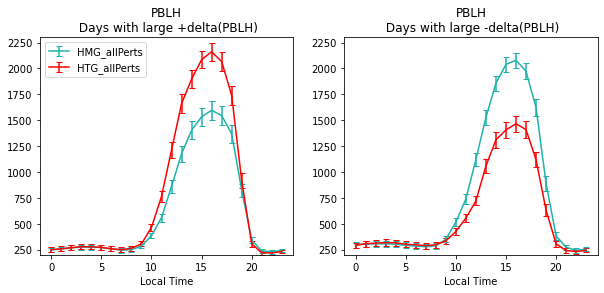

In [40]:
p1 = plot_ensMeanDiurnalCycle1D('PBLH')
p1[0].set_ylim([200, 2300])
p1[1].set_ylim([200, 2300])


(0.0, 2100.0)

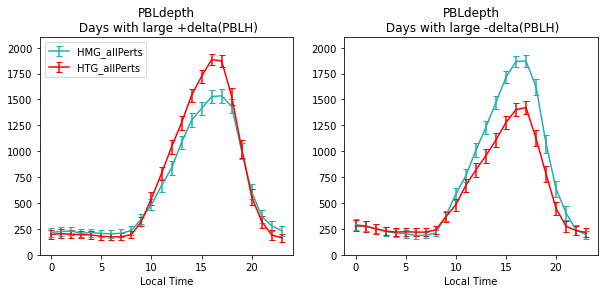

In [41]:
p1 = plot_ensMeanDiurnalCycle1D('PBLdepth')
p1[0].set_ylim([0, 2100])
p1[1].set_ylim([0, 2100])

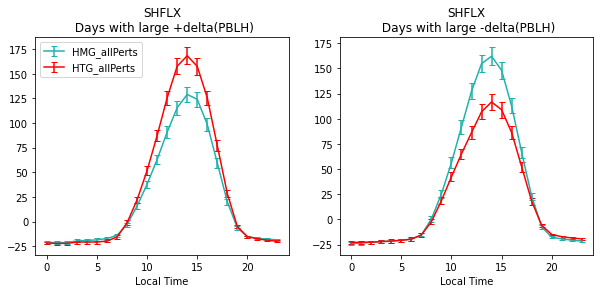

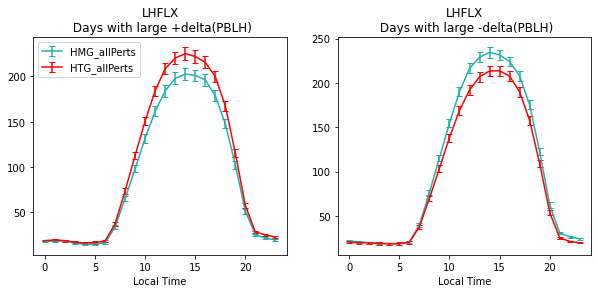

In [42]:
p1 = plot_ensMeanDiurnalCycle1D('SHFLX')
p2 = plot_ensMeanDiurnalCycle1D('LHFLX')


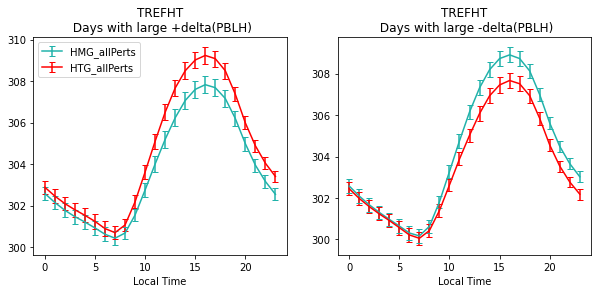

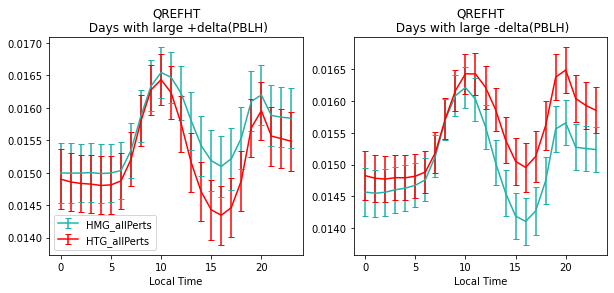

In [43]:
p1 = plot_ensMeanDiurnalCycle1D('TREFHT')
p2 = plot_ensMeanDiurnalCycle1D('QREFHT')


(0.0, 1.1)

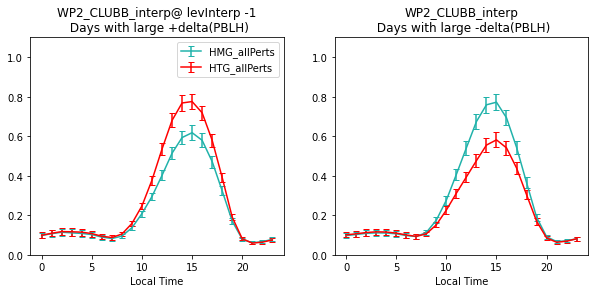

In [44]:
p1 = plot_ensMeanDiurnalCycle2D('WP2_CLUBB_interp', -1)
p1[0].set_ylim([0, 1.1])
p1[1].set_ylim([0, 1.1])

(-0.13, 0.05)

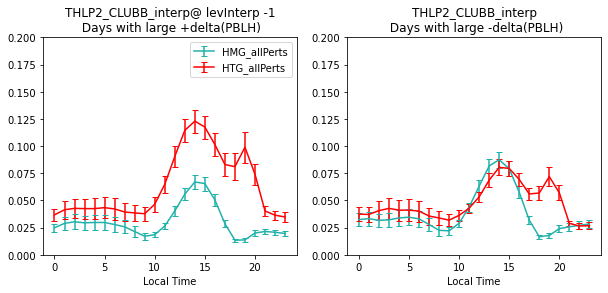

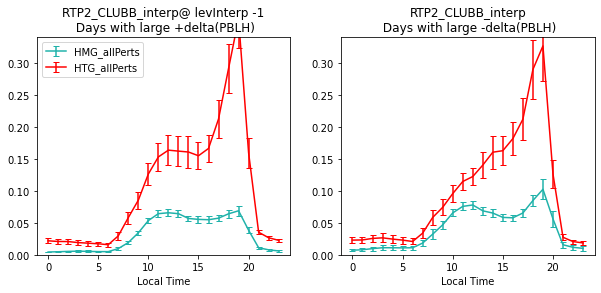

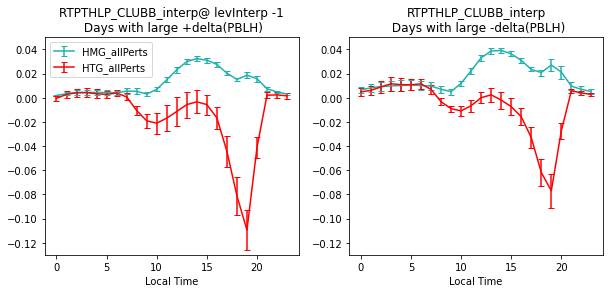

In [45]:
p1 = plot_ensMeanDiurnalCycle2D('THLP2_CLUBB_interp', -1)
p2 = plot_ensMeanDiurnalCycle2D('RTP2_CLUBB_interp', -1)
p3 = plot_ensMeanDiurnalCycle2D('RTPTHLP_CLUBB_interp', -1)

p1[0].set_ylim([0.0, 0.2])
p1[1].set_ylim([0.0, 0.2])
p2[0].set_ylim([0.0, 0.34])
p2[1].set_ylim([0.0, 0.34])
p3[0].set_ylim([-0.13, 0.05])
p3[1].set_ylim([-0.13, 0.05])


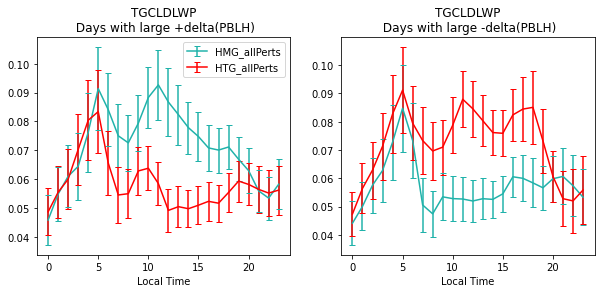

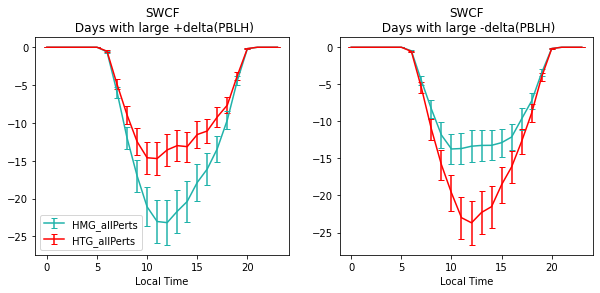

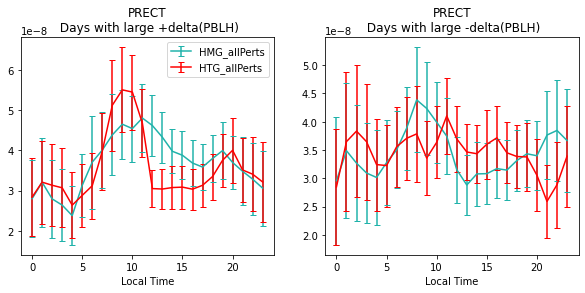

In [46]:
p1 = plot_ensMeanDiurnalCycle1D('TGCLDLWP')
p2 = plot_ensMeanDiurnalCycle1D('SWCF')
p3 = plot_ensMeanDiurnalCycle1D('PRECT')


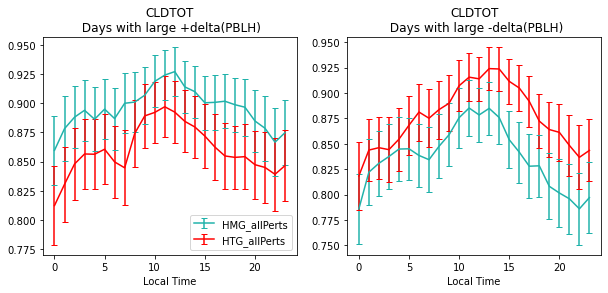

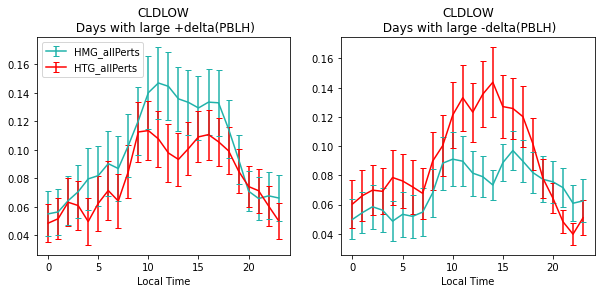

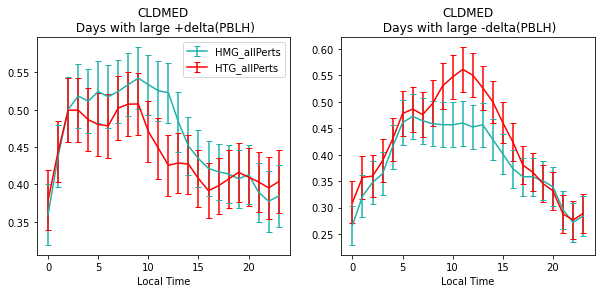

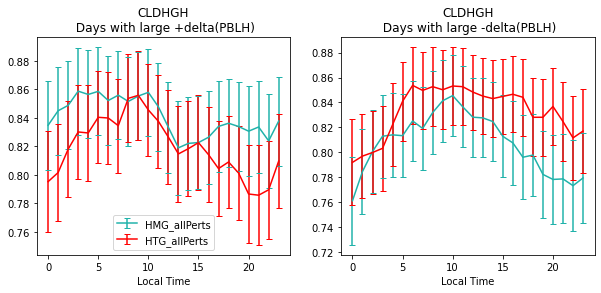

In [47]:
p1 = plot_ensMeanDiurnalCycle1D('CLDTOT')
p2 = plot_ensMeanDiurnalCycle1D('CLDLOW')
p3 = plot_ensMeanDiurnalCycle1D('CLDMED')
p4 = plot_ensMeanDiurnalCycle1D('CLDHGH')


**Vertical profiles here too**

In [48]:
'''
Give this plotting routine the hourly mean DS' of high/low percentile filtering
'''
## Read in one file that has units on it (once you upsample, they disappear)

saveDir    = '/glade/work/mdfowler/CLASP/histData/processedData/'
realSfcHMG = pickle.load( open( saveDir+"realSfc_HMG_rtpthlponly_relaxTlongTau_freeSfcT.p" , "rb") )

def plotProfiles_ensMeanOverHours(highPctDS_HMG, highPctDS_HTG,
                                  lowPctDS_HMG, lowPctDS_HTG,
                                  varSelPlot,
                                  startHr,endHr,
                                  xMin, xMax, maxLev):
    
    caseNames = np.asarray(['HMG','HTG'])
    colorList = np.asarray(['lightseagreen','red'])

    ## Select which levels array to use
    if np.shape(highPctDS_HMG[varSelPlot].values)[2]==len(highPctDS_HMG.ilev.values):
        levSel = 'ilev'
    elif np.shape(highPctDS_HMG[varSelPlot].values)[2]==len(highPctDS_HMG.lev.values):
        levSel = 'lev'
    elif np.shape(highPctDS_HMG[varSelPlot].values)[2]==len(highPctDS_HMG.levInterp.values):
        levSel = 'levInterp'
        
                            
    ## First, get means (& std) over the selected hours and ens cases
    iTimeSel_high = np.where((highPctDS_HMG["time.hour"].values>=startHr) & 
                             (highPctDS_HMG["time.hour"].values<=endHr))[0]
    iTimeSel_low  = np.where((lowPctDS_HMG["time.hour"].values>=startHr) & 
                             (lowPctDS_HMG["time.hour"].values<=endHr))[0]

    
    
    hourlyMean_highTimeSel_HMG   = highPctDS_HMG.isel(time=iTimeSel_high).mean(dim=["time","case"])
    hourlyMean_lowTimeSel_HMG    = lowPctDS_HMG.isel(time=iTimeSel_low).mean(dim=["time","case"])
    
    hourlyStd_highTimeSel_HMG   = highPctDS_HMG.isel(time=iTimeSel_high).std(dim=["time","case"])
    hourlyStd_lowTimeSel_HMG    = lowPctDS_HMG.isel(time=iTimeSel_low).std(dim=["time","case"])
    
    
    hourlyMean_highTimeSel_HTG   = highPctDS_HTG.isel(time=iTimeSel_high).mean(dim=["time","case"])
    hourlyMean_lowTimeSel_HTG    = lowPctDS_HTG.isel(time=iTimeSel_low).mean(dim=["time","case"])
    
    hourlyStd_highTimeSel_HTG   = highPctDS_HTG.isel(time=iTimeSel_high).std(dim=["time","case"])
    hourlyStd_lowTimeSel_HTG    = lowPctDS_HTG.isel(time=iTimeSel_low).std(dim=["time","case"])
    
    
    # Select the requested variable
    HMGvar_high   = np.squeeze(hourlyMean_highTimeSel_HMG[varSelPlot].values)
    HMGvar_low    = np.squeeze(hourlyMean_lowTimeSel_HMG[varSelPlot].values)

    HTGvar_high   = np.squeeze(hourlyMean_highTimeSel_HTG[varSelPlot].values)
    HTGvar_low    = np.squeeze(hourlyMean_lowTimeSel_HTG[varSelPlot].values)


    # Also get the std of that variable... 
    HMGvarStd_high   = np.squeeze(hourlyStd_highTimeSel_HMG[varSelPlot].values)
    HMGvarStd_low    = np.squeeze(hourlyStd_lowTimeSel_HMG[varSelPlot].values)

    HTGvarStd_high   = np.squeeze(hourlyStd_highTimeSel_HTG[varSelPlot].values)
    HTGvarStd_low    = np.squeeze(hourlyStd_lowTimeSel_HTG[varSelPlot].values)
    
 
    ## Set up figure
    fig,axs = plt.subplots(1,2, figsize=(10,5))
    axs     = axs.ravel()
    fig.subplots_adjust(hspace=0.2)

    atmLevs = highPctDS_HMG[levSel].values

    ## Define confidence level to rely on
    CIlevel = 1.960   ## 95% CI
    # CIlevel = 1.645   ## 90% CI

    ## - - - - - - - - - - - - - - - - - - - - - - - - - - -
    ## Plot profiles
    axs[0].errorbar(HMGvar_high,   atmLevs,
                    xerr=CIlevel*(HMGvarStd_high/np.sqrt(len(iTimeSel_high))),
                    capsize=3, color=colorList[0], label=caseNames[0])
    axs[0].errorbar(HTGvar_high,   atmLevs, 
                    xerr=CIlevel*(HTGvarStd_high/np.sqrt(len(iTimeSel_high))),
                    capsize=3, color=colorList[1], label=caseNames[1])
    axs[0].legend(fontsize=12)

    
    axs[1].errorbar(HMGvar_low,   atmLevs, 
                    xerr=CIlevel*(HMGvarStd_low/np.sqrt(len(iTimeSel_low))),
                    capsize=3, color=colorList[0], label=caseNames[0])
    axs[1].errorbar(HTGvar_low,   atmLevs,
                    xerr=CIlevel*(HTGvarStd_low/np.sqrt(len(iTimeSel_low))),
                    capsize=3, color=colorList[1], label=caseNames[1])

    
   ## - - - - - - - - - - - - - - - - - - - - - - - - - - -
    # Other plot options
    axs[0].invert_yaxis()
    axs[1].invert_yaxis()

    axs[0].set_ylim([980, maxLev])
    axs[1].set_ylim([980, maxLev])
    
    axs[0].set_xlim([xMin, xMax])
    axs[1].set_xlim([xMin, xMax])
    
    axs[1].axes.yaxis.set_ticklabels([]) 

    axs[0].set_title(varSelPlot+'\n Large increases in '+varSel, fontsize=14)       
    axs[1].set_title('Large decreases in '+varSel, fontsize=14)

    axs[0].set_xlabel(realSfcHMG[varSelPlot].units, fontsize=12)
    axs[1].set_xlabel(realSfcHMG[varSelPlot].units, fontsize=12)

    if varSelPlot.endswith('_interp'):
        axs[0].set_ylabel('hPa', fontsize=12)
    else:
        axs[0].set_ylabel('hPa (model hybrid coord)', fontsize=12)

    axs[0].tick_params(axis='both', labelsize= 12)
    axs[1].tick_params(axis='both', labelsize= 12)


    return

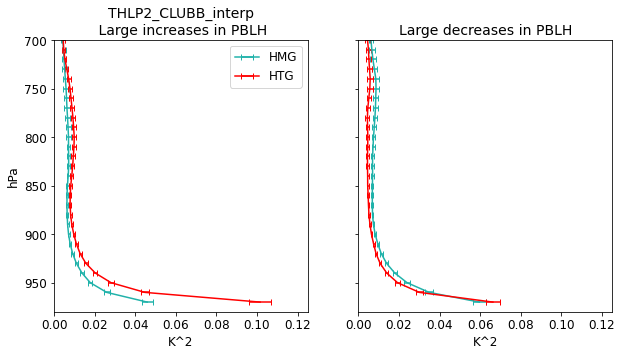

In [60]:
plotProfiles_ensMeanOverHours(highPct_byEnsHMG, highPct_byEnsHTG,
                              lowPct_byEnsHMG, lowPct_byEnsHTG,
                              'THLP2_CLUBB_interp',
                               12, 18,  # Start hr, end hr                    
                               0,       # Min x value
                               0.125,     # Max x value
                               700)     # Max level


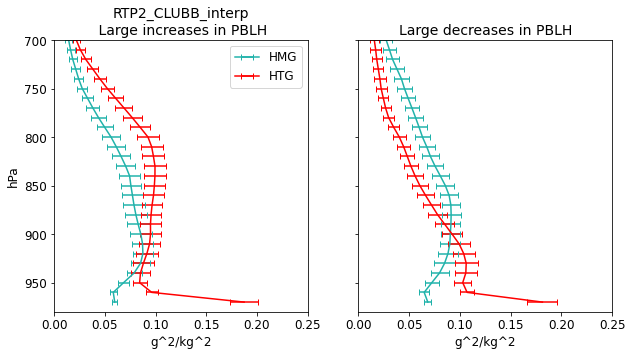

In [50]:
plotProfiles_ensMeanOverHours(highPct_byEnsHMG, highPct_byEnsHTG,
                              lowPct_byEnsHMG, lowPct_byEnsHTG,
                              'RTP2_CLUBB_interp',
                               12, 18,  # Start hr, end hr                    
                               0,       # Min x value
                               0.25,     # Max x value
                               700)     # Max level


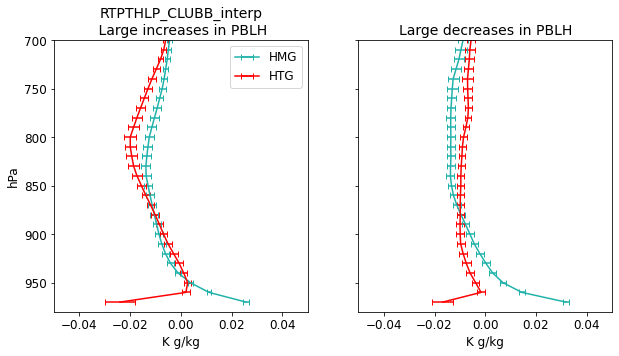

In [51]:
plotProfiles_ensMeanOverHours(highPct_byEnsHMG, highPct_byEnsHTG,
                              lowPct_byEnsHMG, lowPct_byEnsHTG,
                              'RTPTHLP_CLUBB_interp',
                               12, 18,  # Start hr, end hr                    
                               -0.05,       # Min x value
                               0.05,     # Max x value
                               700)     # Max level



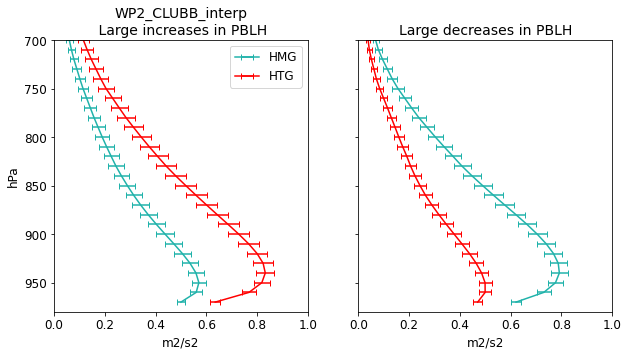

In [61]:
plotProfiles_ensMeanOverHours(highPct_byEnsHMG, highPct_byEnsHTG,
                              lowPct_byEnsHMG, lowPct_byEnsHTG,
                              'WP2_CLUBB_interp',
                               12, 18,  # Start hr, end hr                    
                               0,       # Min x value
                               1.0,     # Max x value
                               700)     # Max level


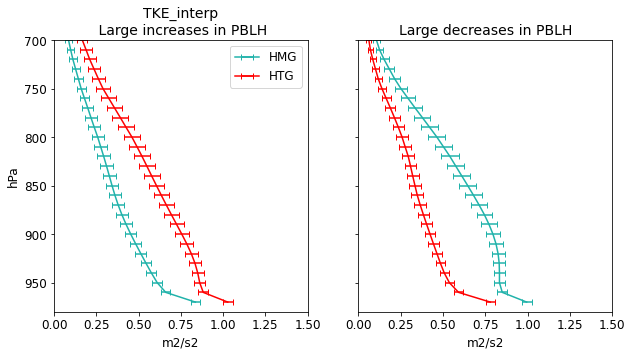

In [53]:
plotProfiles_ensMeanOverHours(highPct_byEnsHMG, highPct_byEnsHTG,
                              lowPct_byEnsHMG, lowPct_byEnsHTG,
                              'TKE_interp',
                               12, 18,  # Start hr, end hr                    
                               0,       # Min x value
                               1.5,     # Max x value
                               700)     # Max level


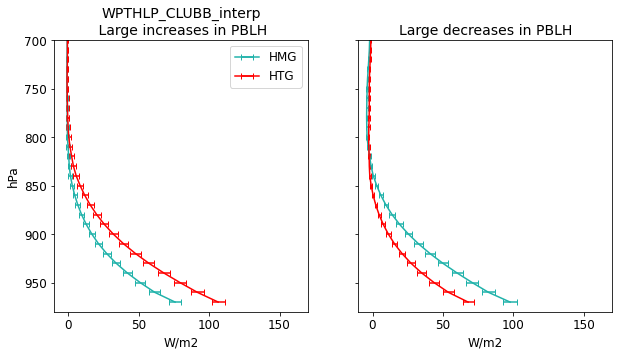

In [54]:
plotProfiles_ensMeanOverHours(highPct_byEnsHMG, highPct_byEnsHTG,
                              lowPct_byEnsHMG, lowPct_byEnsHTG,
                              'WPTHLP_CLUBB_interp',
                               12, 18,  # Start hr, end hr                    
                               -10,       # Min x value
                               170,     # Max x value
                               700)     # Max level



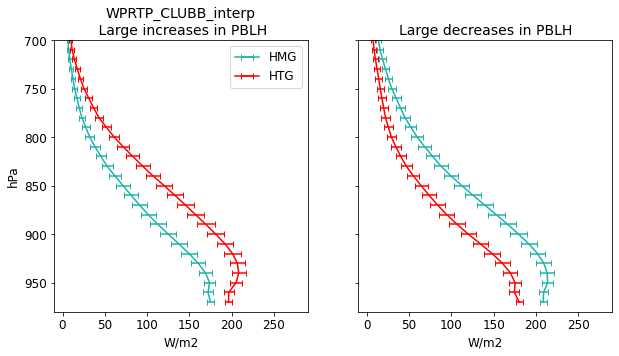

In [55]:
plotProfiles_ensMeanOverHours(highPct_byEnsHMG, highPct_byEnsHTG,
                              lowPct_byEnsHMG, lowPct_byEnsHTG,
                              'WPRTP_CLUBB_interp',
                               12, 18,  # Start hr, end hr                    
                               -10,       # Min x value
                               290,     # Max x value
                               700)     # Max level




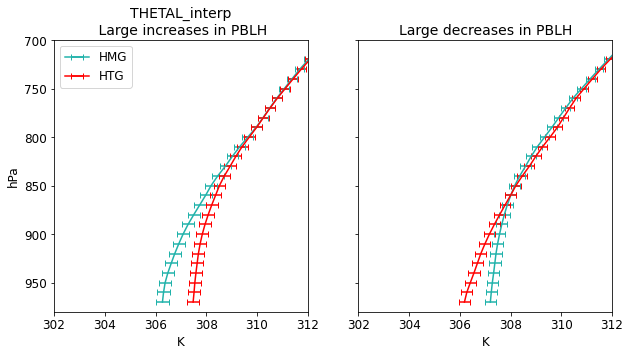

In [56]:
plotProfiles_ensMeanOverHours(highPct_byEnsHMG, highPct_byEnsHTG,
                              lowPct_byEnsHMG, lowPct_byEnsHTG,
                              'THETAL_interp',
                               12, 18,  # Start hr, end hr                    
                               302,       # Min x value
                               312,     # Max x value
                               700)     # Max level


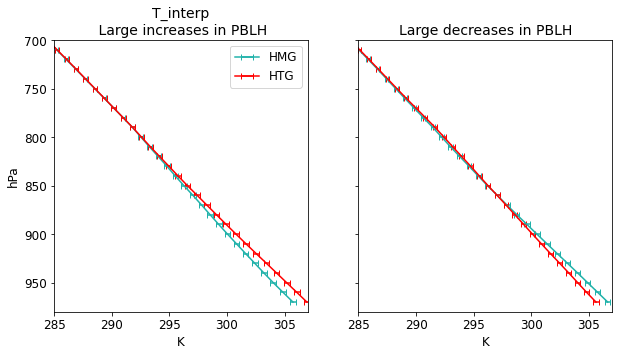

In [57]:
plotProfiles_ensMeanOverHours(highPct_byEnsHMG, highPct_byEnsHTG,
                              lowPct_byEnsHMG, lowPct_byEnsHTG,
                              'T_interp',
                               12, 18,  # Start hr, end hr                    
                               285,       # Min x value
                               307,     # Max x value
                               700)     # Max level


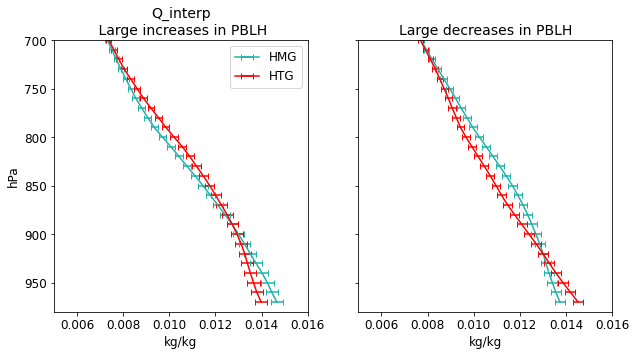

In [58]:
plotProfiles_ensMeanOverHours(highPct_byEnsHMG, highPct_byEnsHTG,
                              lowPct_byEnsHMG, lowPct_byEnsHTG,
                              'Q_interp',
                               12, 18,  # Start hr, end hr                    
                               0.005,       # Min x value
                               0.016,     # Max x value
                               700)     # Max level


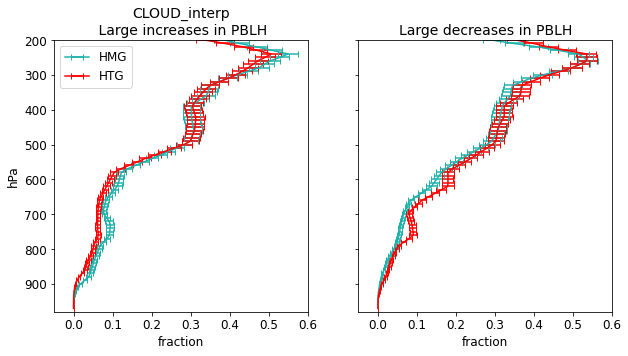

In [59]:
plotProfiles_ensMeanOverHours(highPct_byEnsHMG, highPct_byEnsHTG,
                              lowPct_byEnsHMG, lowPct_byEnsHTG,
                              'CLOUD_interp',
                               12, 18,  # Start hr, end hr                    
                               -0.05,       # Min x value
                               0.6,     # Max x value
                               200)     # Max level

